<a href="https://colab.research.google.com/github/javmencia/RBLog/blob/main/SimpleLinearRegressionv4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d
from scipy.special import gammaln
from scipy import stats
import time
import math

# Hypothesis

## Bias Against

In [ ]:
import pymc as pm
import numpy as np
from scipy import stats

def normal_logp(x, mu, sigma):
    return -0.5 * ((x - mu) / sigma) ** 2 - pm.math.log(sigma) - 0.5 * pm.math.log(2 * np.pi)

def normal_logp_np(x, mu, sigma):
    return -0.5 * ((x - mu) / sigma) ** 2 - np.log(sigma) - 0.5 * np.log(2 * np.pi)

n = 20
x1 = stats.norm.rvs(size=n)
x2 = stats.norm.rvs(size=n)
X = np.column_stack((np.ones(n), x1, x2))  # Design matrix with intercept

# Prior parameters for the multivariate normal distribution
beta_prior_mean = np.zeros(3)
beta_prior_cov = np.eye(3)

with pm.Model() as MLRBias:

    # Multivariate normal prior for the regression coefficients
    #beta = pm.MvNormal('beta', mu=beta_prior_mean, cov=beta_prior_cov, shape=3)

    # Linear model
    #mu = pm.math.dot(X, beta)

    # Likelihood
    #y = pm.Normal('y', mu=mu, sigma=1, observed=stats.norm.rvs(size=n))

    # "Empty model" MCMC sample over prior and prior predictive data
    mu_ = pm.Normal('mu_', mu=beta_prior_mean[0], sigma=1, shape=1)
    x_ = pm.Normal('x_', mu=mu_, sigma=1, shape=n)

    # Prior predictive data density evaluations
    prior_prior_pd = pm.Deterministic("prior_prior_pd", normal_logp(mu_, 0, 1)) # Chagnge for some mu_0

    posterior_var = 1 / (1 / 1**2 + n / 1)
    posterior_mean = (beta_prior_mean[0] / 1**2 + x_.sum() / 1) * posterior_var
    posterior_prior_pd = pm.Deterministic("posterior_prior_pd",
                                          normal_logp(mu_, posterior_mean, posterior_var**0.5))

    logRB_prior_pd = pm.Deterministic("logRB_prior_pd", posterior_prior_pd - prior_prior_pd)

    likelihood_prior_pd = pm.Deterministic("likelihood_prior_pd", normal_logp(x_, mu_, 1).sum())


    idata = pm.sample(draws=1000)


In [ ]:
import numpy as np
import pymc as pm
import arviz as az

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 5  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p))

# Ground truth parameters for generating data
beta0 = np.array([1, 2])
sigma0 = 1

# Generate response variable y
y = np.dot(X, beta0) + np.random.normal(0, sigma0, n)
print("y", y)

def normal_logp(x, mu, sigma):
    return -0.5 * np.log(2 * np.pi * sigma**2) - 0.5 * ((x - mu)**2 / sigma**2)

with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    # Likelihood
    mu = pm.Deterministic("mu", pm.math.dot(X, beta))
    y_ = pm.MvNormal('y_', mu=mu, cov= (sigma0**2)*np.eye(n), shape = n)

    # Prior log-probability
    prior_pd = pm.Deterministic("prior_pd", pm.logp(pm.Normal.dist(mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,)), mu).sum())

    # Posterior mean and covariance for beta
    X_transpose = X.T
    Sigma_inv = np.eye(n) / sigma0**2
    Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2

    cov_beta_post = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)
    print(cov_beta_post)
    mean_beta_post = np.dot(cov_beta_post, np.dot(X_transpose, np.dot(Sigma_inv, y)) + Sigma_beta_inv.dot(np.ones(p) * mu_prior_mean))
    print(mean_beta_post)

    # Posterior log-probability
    posterior_beta = pm.MvNormal('posterior_beta', mu=mean_beta_post, cov=cov_beta_post)
    posterior_pd = pm.Deterministic("posterior_pd", pm.logp(pm.MvNormal.dist(mu=pm.math.dot(X, posterior_beta), cov=(sigma0**2)*np.eye(n), shape=n), mu).sum())

    # Log BR
    logRB_prior_pd = pm.Deterministic("logRB_prior_pd", posterior_pd - prior_pd)

    # Likelihood
    likelihood_prior_pd = pm.Deterministic("likelihood_prior_pd", pm.logp(pm.MvNormal.dist(mu=mu, cov=(sigma0**2)*np.eye(n), shape=n), mu).sum())

    # Sampling
    idata = pm.sample(draws=5000, tune=1000)

y [ 1.88530777  5.07630864 -0.80801428  0.05892611 -6.28747393]
[[ 0.17828421 -0.04310783]
 [-0.04310783  0.10989077]]
[0.41814763 2.31679379]


In [ ]:
# Calculate the bias against the prior hypothesis
bias_against = idata.posterior["logRB_prior_pd"].values.ravel() <= 0
t = bias_against.shape[0]
burn = 1000
bias_against_mci = bias_against.cumsum() / np.arange(1, t+1)

# Extract posterior samples for simulation
beta_samples = idata.posterior['mu'][:, :, 0].values.ravel()[:1000]  # Use 1000 samples
x_samples = idata.posterior['y_'].values  # Shape (chains, draws, n)

# Compute log likelihoods for all samples at once
marginal_likelihoods = normal_logp_np(x_samples[:, :, :, np.newaxis], beta_samples, 1).sum(axis=2)

# Average the likelihoods over the samples
log_marginal_likelihoods = np.log(np.exp(marginal_likelihoods).mean(axis=-1)).ravel()

# Compute biases
likelihood_prior_pd = idata.posterior['likelihood_prior_pd'].values.ravel()

bias_against_ml = (likelihood_prior_pd - log_marginal_likelihoods) <= 0

bias_against_ml_mci = bias_against_ml.cumsum() / np.arange(1, len(bias_against_ml) + 1)

plt.plot(bias_against_mci[burn:], label='Bias Against (Analytical)')
#plt.plot(bias_against_ml_mci[burn:], label='Bias Against (Simulation)')
plt.title("Hypothesis: Bias Against n={}".format(n))
plt.legend()
plt.show()


NameError: name 'normal_logp_np' is not defined

In [ ]:
import pymc as pm
import numpy as np
import math

# Function definitions for normal and gamma log probabilities
def normal_logp(x, mu, sigma):
    return -0.5 * ((x - mu) / sigma) ** 2 - pm.math.log(sigma) - 0.5 * pm.math.log(2 * np.pi)

def gamma_logp(value, alpha, beta):
    return (alpha - 1) * pm.math.log(value) - (value / beta) - alpha * pm.math.log(beta) - pm.math.log(math.gamma(alpha))

# Define prior parameters
beta_prior_mean = 0
beta_prior_sigma = 1
alpha = 2
beta = 1 / 2

# Number of observations and covariates
n, p = 100, 2
X = np.random.normal(size=(n, p))
beta_0 = np.ones(p)
sigma_0 = 1

# Observed data
y = np.random.normal(X @ beta_0, sigma_0, size=n)

# Define the model
with pm.Model() as m:
    # Priors for regression coefficients
    beta = pm.Normal('beta', mu=beta_prior_mean, sigma=beta_prior_sigma, shape=p)

    # Prior for variance
    sigma = pm.Gamma('sigma', alpha=alpha, beta=beta)

    # Generate synthetic data based on the priors
    y_ = pm.Normal('y_', mu=pm.math.dot(X, beta), sigma=sigma, shape=n)

    # Prior predictive data density evaluations
    prior_prior_pd_beta = pm.Deterministic("beta_prior", normal_logp(beta_0, beta_prior_mean, beta_prior_sigma))
    prior_prior_pd_sigma = pm.Deterministic("sigma_prior", pm.logp(pm.Gamma.dist(alpha=alpha, beta=beta), sigma_0))

    # Posterior computations for sigma (using conjugate prior properties)
    posterior_beta_sigma = pm.Deterministic("posterior_beta_sigma", beta + 0.5 * ((y - X @ beta_0)**2).sum())
    posterior_prior_pd_sigma = pm.Deterministic("posterior_prior_pd_sigma", pm.logp(pm.Gamma.dist(alpha=alpha + n / 2, beta=posterior_beta_sigma), sigma_0))

    # Posterior computations for beta
    posterior_var_beta = np.linalg.inv(np.linalg.inv(np.eye(p) * beta_prior_sigma**2) + (X.T @ X) / sigma_0)
    posterior_mean_beta = posterior_var_beta @ ((X.T @ y / sigma_0) + (np.ones(p) * beta_prior_mean / beta_prior_sigma**2))
    posterior_prior_pd_beta = pm.Deterministic("posterior_prior_pd_beta", pm.logp(pm.MvNormal.dist(mu=posterior_mean_beta, cov=posterior_var_beta), beta_0))

    # Bayes factor for the priors
    logBR_prior_pd = pm.Deterministic("logBR_prior_pd", posterior_prior_pd_beta - prior_prior_pd_beta)

    # Likelihood prior predictive density evaluations
    likelihood_prior_pd = pm.Deterministic("likelihood_prior_pd", normal_logp(y, X @ beta_0, sigma_0).sum())

# Sample from the model
with m:
    idata = pm.sample(draws=1000)


Currently looking at

In [ ]:
import pymc as pm
import numpy as np
import math

# Function definitions for normal and gamma log probabilities
def normal_logp(x, mu, sigma):
    return -0.5 * ((x - mu) / sigma) ** 2 - pm.math.log(sigma) - 0.5 * pm.math.log(2 * np.pi)

def gamma_logp(value, alpha, beta):
    return (alpha - 1) * pm.math.log(value) - (value / beta) - alpha * pm.math.log(beta) - pm.math.log(math.gamma(alpha))

# Define prior parameters
beta_prior_mean = 0
beta_prior_sigma = 1
alpha = 2
beta = 1 / 2

# Number of observations and covariates
n, p = 100, 2
X = np.random.normal(size=(n, p))
betas_0 = np.zeros((p,1))
betas_cov_0 = np.eye(p)
sigma_0 = 1

# Observed data
y = np.random.normal(X @ beta_0, sigma_0, size=n)

# Define the model
with pm.Model() as m:
    # Priors for regression coefficients
    betas = pm.MvNormal('betas', mu= betas_0, cov=betas_cov_0, shape=(p,1))
    sigma = pm.TruncatedNormal('sigma', mu=sigma_0, sigma=sigma_0, lower=0) # it's just a half normal, actually


    #This might be the posterior
    y = pm.Normal('y', mu=pm.math.dot(X, betas), sigma=sigma)

    logBR_prior_pd = pm.Deterministic("logBR_prior_pd", posterior_prior_pd_theta - prior_prior_pd_theta)

    likelihood_prior_pd = pm.Deterministic("likelihood_prior_pd", pm.logp(pm.Normal.dist(mu = posterior_mean_theta, tau = posterior_var_theta), theta_0).sum())

CAN EITHER WORK WITH BETA AND THEN MULTIPLY BY X OR MULTIPLY AND WORK WITH Y

In [ ]:
# ON Y

import pymc as pm
import numpy as np
import math

def normal_logp(x, mu, sigma):
    return -0.5 * ((x - mu) / sigma) ** 2 - pm.math.log(sigma) - 0.5*pm.math.log(2*np.pi)

# Define the dimensions and generate synthetic data
n, p = 100, 2
X = np.zeros((n, p))
y = np.ones(n)

# Define prior parameters
beta_prior_mean = np.zeros(p)
beta_prior_cov = np.eye(p)
alpha_prior = 2
beta_prior = 2

# Number of observations
sigma_0 = 1

# Define the model
with pm.Model() as model:
    # Priors
    beta_ = pm.Normal('beta_', mu=beta_prior_mean, sigma=1, shape=p)
    #sigma2 = pm.InverseGamma('sigma2', alpha=alpha_prior, beta=beta_prior)

    # Likelihood
    #y_ = pm.Normal('y_', mu=pm.math.dot(X, beta_), sigma=sigma2**0.5)
    betas = pm.MvNormal('betas', mu=beta_prior_mean, cov=beta_prior_cov, shape=(p,1))

    sigma = pm.TruncatedNormal('sigma', mu=1, sigma=1, lower=0) # it's just a half normal, actually
    y = pm.Normal('y', mu=pm.math.dot(X, betas), sigma=sigma)

    # Prior predictive data density evaluations for beta
    prior_prior_pd_beta = pm.Deterministic("beta_prior", normal_logp(0, 0, 1))

    # Posterior computations for sigma2 (using conjugate prior properties)
    posterior_beta_sigma2 = pm.Deterministic("posterior_beta_sigma2", beta_prior + 0.5 * ((y - pm.math.dot(X, beta_prior_mean))**2).sum())
    posterior_prior_pd_sigma2 = pm.Deterministic("posterior_prior_pd_sigma2", pm.logp(pm.InverseGamma.dist(alpha=alpha_prior + n/2, beta=posterior_beta_sigma2), sigma_0))

    # Posterior computations for beta
    XTX_inv = np.linalg.inv(X.T @ X + np.eye(p))
    XTy = X.T @ y
    posterior_mean_beta = XTX_inv @ XTy
    posterior_cov_beta = XTX_inv * sigma2
    posterior_prior_pd_beta = pm.Deterministic("posterior_prior_pd_beta",
                                               pm.logp(pm.MvNormal.dist(mu=posterior_mean_beta, cov=posterior_cov_beta), beta_))

    # Bayes factor for the priors
    logBR_prior_pd = pm.Deterministic("logBR_prior_pd", posterior_prior_pd_beta - prior_prior_pd_beta)

    # Likelihood prior predictive density evaluations
    likelihood_prior_pd = pm.Deterministic("likelihood_prior_pd", normal_logp(y_, pm.math.dot(X, beta_prior_mean), sigma2**0.5).sum())

# Sample from the model
with model:
    idata = pm.sample(draws=1000)



In [ ]:
# Calculate the bias against the prior hypothesis
bias_against = idata.posterior["logBR_prior_pd"].values.ravel() <= 0
t = bias_against.shape[0]
burn = 1000
bias_against_mci = bias_against.cumsum() / np.arange(1, t+1)

# Extract posterior samples for simulation
beta_samples = idata.posterior['beta_'][:, :, 0].values.ravel()[:1000]  # Use 1000 samples
x_samples = idata.posterior['y_'].values  # Shape (chains, draws, n)

# Compute log likelihoods for all samples at once
marginal_likelihoods = normal_logp_np(x_samples[:, :, :, np.newaxis], beta_samples, 1).sum(axis=2)

# Average the likelihoods over the samples
log_marginal_likelihoods = np.log(np.exp(marginal_likelihoods).mean(axis=-1)).ravel()

# Compute biases
likelihood_prior_pd = idata.posterior['likelihood_prior_pd'].values.ravel()

bias_against_ml = (likelihood_prior_pd - log_marginal_likelihoods) <= 0

bias_against_ml_mci = bias_against_ml.cumsum() / np.arange(1, len(bias_against_ml) + 1)

plt.plot(bias_against_mci[burn:], label='Bias Against (Analytical)')
#plt.plot(bias_against_ml_mci[burn:], label='Bias Against (Simulation)')
plt.title("Hypothesis: Bias Against n={}".format(n))
plt.legend()
plt.show()


KeyError: 'y_'

On beta

In [ ]:
# For x
mu_prior_mean = 0
mu_prior_sigma = 1
n=50
mu_0 = 0


p = 2

# For beta

beta_mu_0 = np.zeros((p, 1))
beta_cov_0 = np.eye(p)

# For sigma

sigma_mu_0 = 1
sigma_sigma_0 = 1

y_0 = np.ones(2)
with pm.Model() as m:

    # Define hyperparameters for all

    # For x
    mu_ = pm.Normal('mu_', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=1)
    x_ = pm.Normal('x_', mu=mu_0, sigma=1, shape=n)

    # For beta and sigma
    beta = pm.MvNormal("beta", mu = beta_mu_0, cov = beta_cov_0, shape = (p, 1))
    sigma = pm.TruncatedNormal("sigma", mu = sigma_mu_0, sigma = sigma_sigma_0, lower = 0)

    y = pm.Normal('y', mu = pm.math.dot(x_, beta), sigma = sigma)

    # Priors
    prior_beta = pm.Deterministic("prior_beta", pm.logp(pm.MvNormal.dist(mu = beta_mu_0, cov = beta_cov_0, shape = (p, 1)), beta_mu_0))
    prior_sigma = pm.Deterministic("prior_sigma", pm.logp(pm.TruncatedNormal.dist(mu = sigma_mu_0, sigma = sigma_sigma_0, lower = 0), sigma_mu_0 ) )
    prior_y = pm.Deterministic("prior_y", pm.logp(pm.Normal.dist(mu = pm.math.dot(x_, beta_mu_0), sigma = sigma_mu_0), y_0))

    # Posteriors
    posterior_y = pm.Deterministic("posterior_y", pm.logp(pm.Normal.dist(mu = pm.math.dot(x_, beta), sigma = sigma), y_0))
    """
    # prior predictive data density evaluations
    prior_prior_pd = pm.Deterministic("prior_prior_pd", normal_logp(mu_0,0,1))

    posterior_var = 1/(1/mu_prior_sigma**2 + n/1)
    posterior_mean = (mu_prior_mean/mu_prior_sigma**2 + x_.sum()/1)*posterior_var
    posterior_prior_pd = pm.Deterministic("posterior_prior_pd",
                                          normal_logp(mu_0, posterior_mean, posterior_var**0.5))
    logBR_prior_pd = pm.Deterministic("logBR_prior_pd", posterior_prior_pd-prior_prior_pd) # pm.math.exp()

    likelihood_prior_pd = pm.Deterministic("likelihood_prior_pd", normal_logp(x_,mu_0,1).sum())"""

with m:
    idata = pm.sample(draws=1000)

ValueError: Incompatible Elemwise input shapes [(50,), (2,)]

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


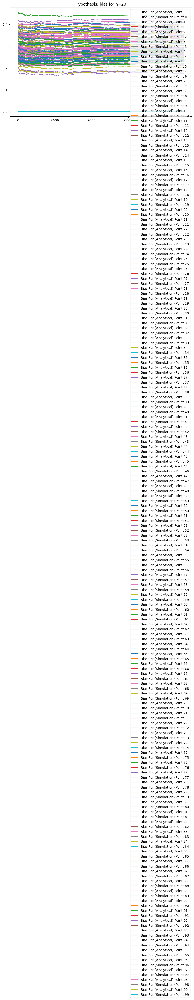

In [ ]:
import numpy as np
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 20  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p))

# Ground truth parameters for generating data
beta0 = np.array([1, 2])
delta = 0.05
sigma0 = 1

# Generate points on the circle around beta0
num_points = 100  # Number of points on the circle
theta = np.linspace(0, 2 * np.pi, num_points)
beta_circle = np.column_stack((beta0[0] + delta * np.cos(theta), beta0[1] + delta * np.sin(theta)))

# Generate response variables for each point on the circle
y_circle = []
for beta in beta_circle:
    mu = np.dot(X, beta)
    y = mu + np.random.normal(0, sigma0, n)
    y_circle.append(y)

def normal_logp_np(x, mu, sigma):
    return -0.5 * np.log(2 * np.pi * sigma**2) - 0.5 * ((x - mu)**2 / sigma**2)

with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    # Likelihood
    mu = pm.Deterministic("mu", pm.math.dot(X, beta))

    # Prior log-probability
    prior_pd = pm.Deterministic("prior_pd", pm.logp(pm.MvNormal.dist(mu=mu_prior_mean, cov=(mu_prior_sigma**2)*np.eye(n), shape=(n,)), mu).sum())

    posterior_pds = []
    logBR_prior_pds = []
    likelihood_prior_pds = []

    # Iterate over each point on the circle
    for idx, (mu_i, y_i) in enumerate(zip(beta_circle, y_circle)):
        # Posterior mean and covariance for beta
        mul = np.dot(X, mu_i)
        X_transpose = X.T
        Sigma_inv = np.eye(n) / sigma0**2
        Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2

        cov_beta_post = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)
        mean_beta_post = np.dot(cov_beta_post, np.dot(X_transpose, np.dot(Sigma_inv, y_i)) + Sigma_beta_inv.dot(np.ones(p) * mu_prior_mean))

        # Posterior log-probability
        posterior_beta = pm.MvNormal(f'posterior_beta_{idx}', mu=mean_beta_post, cov=cov_beta_post)
        posterior_pd = pm.Deterministic(f"posterior_pd_{idx}", pm.logp(posterior_beta, beta).sum())
        posterior_pds.append(posterior_pd)

        # Log BR
        logBR_prior_pd = pm.Deterministic(f"logBR_prior_pd_{idx}", posterior_pd - prior_pd)
        logBR_prior_pds.append(logBR_prior_pd)

        # Likelihood
        likelihood_prior_pd = pm.Deterministic(f"likelihood_prior_pd_{idx}", pm.logp(pm.MvNormal.dist(mu=mul, cov=(sigma**2)*np.eye(n), shape=(n,)), y_i).sum())
        likelihood_prior_pds.append(likelihood_prior_pd)

    # Sampling
    idata = pm.sample(draws=5000, tune=1000)

# Convert lists to numpy arrays
posterior_pds = np.array(posterior_pds)
logBR_prior_pds = np.array(logBR_prior_pds)
likelihood_prior_pds = np.array(likelihood_prior_pds)

# Compute biases for all points on the circle
bias_for = []
bias_for_ml = []
burn = 1000

for idx in range(num_points):
    logBR_prior_pd_values = idata.posterior[f'logBR_prior_pd_{idx}'].values.ravel()
    likelihood_prior_pd_values = idata.posterior[f'likelihood_prior_pd_{idx}'].values.ravel()

    bias_for_values = logBR_prior_pd_values > 0
    bias_for_mci = bias_for_values.cumsum() / np.arange(1, len(bias_for_values) + 1)

    mu_samples = idata.posterior['mu'][:, :, 0].values.ravel()[:1000]
    y_samples = idata.posterior[f'posterior_beta_{idx}'].values
    marginal_likelihoods = normal_logp_np(y_samples[:, :, :, np.newaxis], mu_samples, 1).sum(axis=2)
    log_marginal_likelihoods = np.log(np.exp(marginal_likelihoods).mean(axis=-1)).ravel()

    bias_for_ml_values = (likelihood_prior_pd_values - log_marginal_likelihoods) >= 0
    bias_for_ml_mci = bias_for_ml_values.cumsum() / np.arange(1, len(bias_for_ml_values) + 1)

    bias_for.append(bias_for_mci)
    bias_for_ml.append(bias_for_ml_mci)

# Plotting
plt.figure(figsize=(10, 6))
for idx in range(num_points):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}')
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}')

plt.title("Hypothesis: bias for n={}".format(n))
plt.legend()
plt.show()


Vectorising ising ing

In [ ]:
import numpy as np
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 20  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p))

# Ground truth parameters for generating data
beta0 = np.array([1, 2])
mu0 = np.dot(X, beta0)
delta = 0.05
sigma0 = 1

# Generate points on the circle
num_points = 100  # Number of points on the circle
theta = np.linspace(0, 2 * np.pi, num_points)
circle_points = np.column_stack((beta0[0] + delta * np.cos(theta), beta0[1] + delta * np.sin(theta)))

with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    mu = pm.Deterministic("mu", pm.math.dot(X, beta))

    X_transpose = X.T
    Sigma_inv = np.eye(n) / sigma0**2
    Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2

    # Vectorize over circle_points[:50]
    muls = np.dot(X, circle_points[:50].T)

    # Generate response variables y for each point on the circle
    yls = muls + np.random.normal(0, sigma0, (n, 50))

    # Likelihood
    y_ls = pm.MvNormal('y_ls', mu=muls.T, cov=(sigma0**2) * np.eye(n), shape=(50, n))

    # Posterior mean and covariance for beta
    cov_beta_post = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)
    mean_beta_posts = np.dot(cov_beta_post, np.dot(X_transpose, np.dot(Sigma_inv, yls)) + np.outer(Sigma_beta_inv.dot(np.ones(p) * mu_prior_mean), np.ones(50)))

    # Posterior log-probability
    posterior_betals = pm.MvNormal('posterior_betals', mu=mean_beta_posts.T, cov=cov_beta_post, shape=(50, p))
    posterior_pdls = pm.Deterministic('posterior_pdls', pm.logp(pm.MvNormal.dist(mu=pm.math.dot(X, posterior_betals.T), cov=(sigma0**2) * np.eye(n)), mu0[:, None]).sum(axis=0))

    # Log BR
    logBR_prior_pdls = pm.Deterministic('logBR_prior_pdls', posterior_pdls - pm.logp(pm.MvNormal.dist(mu=mu_prior_mean, cov=(mu_prior_sigma**2) * np.eye(n)), pm.math.dot(X, beta)[:, None]).sum(axis=0))

    # Likelihood
    likelihood_prior_pdls = pm.Deterministic('likelihood_prior_pdls', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(sigma**2) * np.eye(n)), y_ls).sum(axis=1))

    # Sampling
    idata = pm.sample(draws=5000, tune=1000)
# Use ArviZ to analyze the results
az.summary(idata)
az.plot_trace(idata)
plt.show()
print(idata.posterior)


ValueError: Incompatible Elemwise input shapes [(1, 20), (20, 50)]

In [ ]:
import numpy as np
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 20  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p))

# Ground truth parameters for generating data
beta0 = np.array([1, 2])
mu0 = np.dot(X, beta0)
delta = 0.05
sigma0 = 1

# Generate points on the circle
num_points = 100  # Number of points on the circle
theta = np.linspace(0, 2 * np.pi, num_points)
circle_points = np.column_stack((beta0[0] + delta * np.cos(theta), beta0[1] + delta * np.sin(theta)))

print("Shape of X:", X.shape)  # Should be (n, p)
print("Shape of circle_points:", circle_points.shape)  # Should be (num_points, p)

with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    mu = pm.Deterministic("mu", pm.math.dot(X, beta))

    # Vectorize over circle_points[:50]
    muls = np.dot(X, circle_points[:50].T)  # Shape: (n, 50)

    # Generate response variables y for each point on the circle
    yls = muls + np.random.normal(0, sigma0, (n, 50))  # Shape: (n, 50)

    print("Shape of muls:", muls.shape)
    print("Shape of yls:", yls.shape)

    # Likelihood
    y_ls = pm.MvNormal('y_ls', mu=muls.T, cov=(sigma0**2) * np.eye(n), shape=(50, n))

    # Posterior mean and covariance for beta
    X_transpose = X.T
    Sigma_inv = np.eye(n) / sigma0**2
    Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2

    cov_beta_post = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)
    mean_beta_posts = np.dot(cov_beta_post, np.dot(X_transpose, np.dot(Sigma_inv, yls)) + np.outer(Sigma_beta_inv.dot(np.ones(p) * mu_prior_mean), np.ones(50)))
    print("Shape of mean_beta_posts:", mean_beta_posts.shape)

    # Posterior log-probability
    posterior_betals = pm.MvNormal('posterior_betals', mu=mean_beta_posts.T, cov=cov_beta_post, shape=(50, p))

    # Adjust the posterior_pdls definition to ensure shape compatibility
    posterior_pdls = pm.Deterministic('posterior_pdls', pm.logp(pm.MvNormal.dist(mu=pm.math.dot(X, posterior_betals.T), cov=(sigma0**2) * np.eye(n)), mu0[:, None]).sum(axis=0))

    # Log BR
    logBR_prior_pdls = pm.Deterministic('logBR_prior_pdls', posterior_pdls - pm.logp(pm.MvNormal.dist(mu=mu_prior_mean, cov=(mu_prior_sigma**2) * np.eye(n)), pm.math.dot(X, beta)[:, None]).sum(axis=0))

    # Likelihood
    likelihood_prior_pdls = pm.Deterministic('likelihood_prior_pdls', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(sigma**2) * np.eye(n)), y_ls).sum(axis=1))

    # Sampling
    idata = pm.sample(draws=5000, tune=1000)

# Use ArviZ to analyze the results
az.summary(idata)
az.plot_trace(idata)
plt.show()
print(idata.posterior)
print("Shape of X:", X.shape)
print("Shape of circle_points[:50]:", circle_points[:50].shape)
print("Shape of muls:", muls.shape)
print("Shape of yls:", yls.shape)
print("Shape of mean_beta_posts:", mean_beta_posts.shape)
print("Shape of posterior_betals:", posterior_betals.shape)


Shape of X: (20, 2)
Shape of circle_points: (100, 2)
Shape of muls: (20, 50)
Shape of yls: (20, 50)
Shape of mean_beta_posts: (2, 50)


ValueError: Incompatible Elemwise input shapes [(1, 20), (20, 50)]

In [ ]:
import numpy as np
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 20  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p))

# Ground truth parameters for generating data
beta0 = np.array([1, 2])
mu0 = np.dot(X, beta0)
delta = 0.05
sigma0 = 1

# Generate points on the circle
num_points = 100  # Number of points on the circle
theta = np.linspace(0, 2 * np.pi, num_points)
circle_points = np.column_stack((beta0[0] + delta * np.cos(theta), beta0[1] + delta * np.sin(theta)))

print("Shape of X:", X.shape)  # Should be (n, p)
print("Shape of circle_points:", circle_points.shape)  # Should be (num_points, p)

with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    mu = pm.Deterministic("mu", pm.math.dot(X, beta))

    # Vectorize over circle_points[:50]
    muls = pm.math.dot(X, circle_points[:50].T)  # Shape: (n, 50)

    # Generate response variables y for each point on the circle
    yls = muls + np.random.normal(0, sigma0, (n, 50))  # Shape: (n, 50)

    print("Shape of muls:", muls.shape)
    print("Shape of yls:", yls.shape)

    # Likelihood
    y_ls = pm.MvNormal('y_ls', mu=muls.T, cov=(sigma0**2) * np.eye(n), shape=(50, n))

    # Posterior mean and covariance for beta
    X_transpose = X.T
    Sigma_inv = np.eye(n) / sigma0**2
    Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2

    cov_beta_post = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)
    mean_beta_posts = np.dot(cov_beta_post, np.dot(X_transpose, np.dot(Sigma_inv, yls)) + np.outer(Sigma_beta_inv.dot(np.ones(p) * mu_prior_mean), np.ones(50)))
    print("Shape of mean_beta_posts:", mean_beta_posts.shape)

    # Posterior log-probability
    posterior_betals = pm.MvNormal('posterior_betals', mu=mean_beta_posts.T, cov=cov_beta_post, shape=(50, p))

    # Adjust the posterior_pdls definition to ensure shape compatibility
    dot_X_posterior_betals = pm.math.dot(X, posterior_betals.T)  # Shape should be (20, 50)
    mu0_broadcasted = pm.math.stack([mu0] * 50, axis=1)  # Shape (20, 50)
    posterior_pdls = pm.Deterministic('posterior_pdls', pm.logp(pm.MvNormal.dist(mu=dot_X_posterior_betals, cov=(sigma0**2) * np.eye(n)), mu0_broadcasted).sum(axis=0))

    # Log BR
    dot_X_beta = pm.math.dot(X, beta)[:, None]  # Shape should be (20, 1)
    mu_prior_mean_broadcasted = pm.math.stack([mu_prior_mean] * 20, axis=0)[:, None]  # Shape (20, 1)
    logBR_prior_pdls = pm.Deterministic('logBR_prior_pdls', posterior_pdls - pm.logp(pm.MvNormal.dist(mu=mu_prior_mean_broadcasted, cov=(mu_prior_sigma**2) * np.eye(n)), dot_X_beta).sum(axis=0))

    # Likelihood
    likelihood_prior_pdls = pm.Deterministic('likelihood_prior_pdls', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(sigma**2) * np.eye(n)), y_ls).sum(axis=1))

    # Sampling
    idata = pm.sample(draws=5000, tune=1000)

# Use ArviZ to analyze the results
az.summary(idata)
az.plot_trace(idata)
plt.show()
print(idata.posterior)
print("Shape of X:", X.shape)
print("Shape of circle_points[:50]:", circle_points[:50].shape)
print("Shape of muls:", muls.shape)
print("Shape of yls:", yls.shape)
print("Shape of mean_beta_posts:", mean_beta_posts.shape)
print("Shape of posterior_betals:", posterior_betals.shape)


Shape of X: (20, 2)
Shape of circle_points: (100, 2)
Shape of muls: Shape.0
Shape of yls: Shape.0


ValueError: operands could not be broadcast together with shapes (2,20) (2,50) 

In [ ]:
import numpy as np
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 20  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p)).astype(np.float64)

# Ground truth parameters for generating data
beta0 = np.array([1, 2], dtype=np.float64)
mu0 = np.dot(X, beta0)
delta = 0.05
sigma0 = 1

# Generate points on the circle
num_points = 100  # Number of points on the circle
theta = np.linspace(0, 2 * np.pi, num_points)
circle_points = np.column_stack((beta0[0] + delta * np.cos(theta), beta0[1] + delta * np.sin(theta))).astype(np.float64)

print("Shape of X:", X.shape)  # Should be (20, 2)
print("Shape of circle_points:", circle_points.shape)  # Should be (100, 2)

with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    mu = pm.Deterministic("mu", pm.math.dot(X, beta))

    # Vectorize over circle_points[:50]
    muls = pm.math.dot(X, circle_points[:50].T)  # Shape: (n, 50)

    # Generate response variables y for each point on the circle
    yls = muls + np.random.normal(0, sigma0, (n, 50)).astype(np.float64)  # Shape: (n, 50)

    print("Shape of muls:", muls.shape)
    print("Shape of yls:", yls.shape)

    # Likelihood
    y_ls = pm.MvNormal('y_ls', mu=muls.T, cov=(sigma0**2) * np.eye(n), shape=(50, n))

    # Posterior mean and covariance for beta
    X_transpose = X.T
    Sigma_inv = np.eye(n) / sigma0**2
    Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2

    cov_beta_post = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)
    mean_beta_posts = np.dot(cov_beta_post, (np.dot(X_transpose, np.dot(Sigma_inv, yls)).sum(axis=1)[:, None])).flatten()
    print("Shape of mean_beta_posts:", mean_beta_posts.shape)

    # Posterior log-probability
    posterior_betals = pm.MvNormal('posterior_betals', mu=mean_beta_posts, cov=cov_beta_post, shape=(p,))

    # Adjust the posterior_pdls definition to ensure shape compatibility
    dot_X_posterior_betals = pm.math.dot(X, posterior_betals)  # Shape should be (20, )
    mu0_broadcasted = pm.math.stack([mu0] * 50, axis=1)  # Shape (20, 50)
    posterior_pdls = pm.Deterministic('posterior_pdls', pm.logp(pm.MvNormal.dist(mu=dot_X_posterior_betals, cov=(sigma0**2) * np.eye(n)), mu0_broadcasted).sum(axis=0))

    # Log BR
    dot_X_beta = pm.math.dot(X, beta)[:, None]  # Shape should be (20, 1)
    mu_prior_mean_broadcasted = pm.math.stack([mu_prior_mean] * 20, axis=0)[:, None]  # Shape (20, 1)
    logBR_prior_pdls = pm.Deterministic('logBR_prior_pdls', posterior_pdls - pm.logp(pm.MvNormal.dist(mu=mu_prior_mean_broadcasted, cov=(mu_prior_sigma**2) * np.eye(n)), dot_X_beta).sum(axis=0))

    # Likelihood
    likelihood_prior_pdls = pm.Deterministic('likelihood_prior_pdls', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(sigma**2) * np.eye(n)), y_ls).sum(axis=1))

    # Sampling
    idata = pm.sample(draws=5000, tune=1000)

# Use ArviZ to analyze the results
az.summary(idata)
az.plot_trace(idata)
plt.show()
print(idata.posterior)
print("Shape of X:", X.shape)
print("Shape of circle_points[:50]:", circle_points[:50].shape)
print("Shape of muls:", muls.shape)
print("Shape of yls:", yls.shape)
print("Shape of mean_beta_posts:", mean_beta_posts.shape)
print("Shape of posterior_betals:", posterior_betals.tag.test_value.shape)


Shape of X: (20, 2)
Shape of circle_points: (100, 2)
Shape of muls: Shape.0
Shape of yls: Shape.0
Shape of mean_beta_posts: (2,)


TypeError: Unsupported dtype for TensorType: object

In [ ]:
import numpy as np
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 20  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p))

# Ground truth parameters for generating data
beta0 = np.array([1, 2])
mu0 = np.dot(X, beta0)
delta = 0.05
sigma0 = 1

# Generate points on the circle
num_points = 100  # Number of points on the circle
theta = np.linspace(0, 2 * np.pi, num_points)
circle_points = np.column_stack((beta0[0] + delta * np.cos(theta), beta0[1] + delta * np.sin(theta)))

# Reduce the number of points to iterate over for efficiency
circle_points = circle_points[:25]

# Vectorized response variable generation
muls = np.dot(X, circle_points.T)  # Shape: (n, 25)
yls = muls + np.random.normal(0, sigma0, (n, 25))  # Shape: (n, 25)

with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    mu = pm.Deterministic("mu", pm.math.dot(X, beta))

    # Likelihood
    y_ls = pm.MvNormal('y_ls', mu=muls.T, cov=(sigma0**2) * np.eye(n), shape=(25, n))

    # Posterior mean and covariance for beta
    X_transpose = X.T
    Sigma_inv = np.eye(n) / sigma0**2
    Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2

    cov_beta_post = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)
    mean_beta_posts = np.dot(cov_beta_post, np.dot(X_transpose, np.dot(Sigma_inv, yls)) + np.outer(Sigma_beta_inv.dot(np.ones(p) * mu_prior_mean), np.ones(25)))

    # Posterior log-probability
    posterior_betals = pm.MvNormal('posterior_betals', mu=mean_beta_posts.T, cov=cov_beta_post, shape=(25, p))
    dot_X_posterior_betals = pm.math.dot(X, posterior_betals.T)  # Shape should be (20, 25)
    mu0_broadcasted = np.tile(mu0[:, None], 25)  # Shape (20, 25)
    posterior_pdls = pm.Deterministic('posterior_pdls', pm.logp(pm.MvNormal.dist(mu=dot_X_posterior_betals, cov=(sigma0**2) * np.eye(n)), mu0_broadcasted).sum(axis=0))

    # Log BR
    dot_X_beta = pm.math.dot(X, beta)[:, None]  # Shape should be (20, 1)
    mu_prior_mean_broadcasted = np.tile(mu_prior_mean, (n, 1))  # Shape (20, 1)
    logBR_prior_pdls = pm.Deterministic('logBR_prior_pdls', posterior_pdls - pm.logp(pm.MvNormal.dist(mu=mu_prior_mean_broadcasted, cov=(mu_prior_sigma**2) * np.eye(n)), dot_X_beta).sum(axis=0))

    # Likelihood
    likelihood_prior_pdls = pm.Deterministic('likelihood_prior_pdls', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(sigma**2) * np.eye(n)), y_ls).sum(axis=1))

    # Sampling with multiple chains for parallelization
    idata = pm.sample(draws=2000, tune=1000, chains=4, cores=4)

# Use ArviZ to analyze the results
az.summary(idata)
az.plot_trace(idata)
plt.show()
print(idata.posterior)
print("Shape of X:", X.shape)
print("Shape of circle_points[:25]:", circle_points.shape)
print("Shape of muls:", muls.shape)
print("Shape of yls:", yls.shape)
print("Shape of mean_beta_posts:", mean_beta_posts.shape)
print("Shape of posterior_betals:", posterior_betals.tag.test_value.shape)


ValueError: Incompatible Elemwise input shapes [(1, 20), (20, 25)]

/usr/local/lib/python3.10/dist-packages/arviz/utils.py:184: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)
/usr/local/lib/python3.10/dist-packages/arviz/plots/traceplot.py:222: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (128), generating only 20 plots
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/arviz/utils.py:184: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/

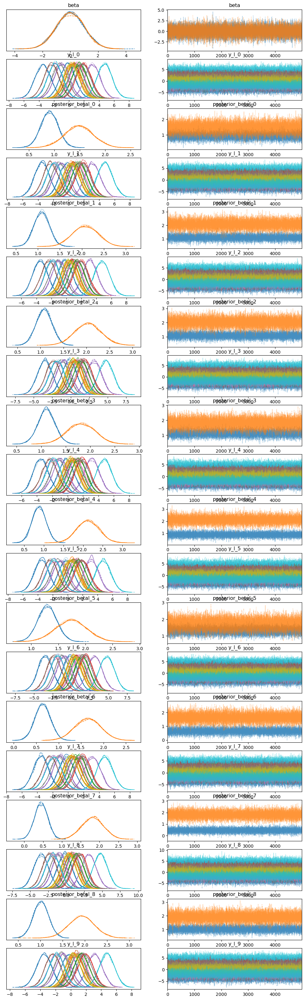

<xarray.Dataset>
Dimensions:                   (chain: 4, draw: 5000, beta_dim_0: 2,
                               y_l_0_dim_0: 20, posterior_betal_0_dim_0: 2,
                               y_l_1_dim_0: 20, posterior_betal_1_dim_0: 2,
                               y_l_2_dim_0: 20, posterior_betal_2_dim_0: 2,
                               y_l_3_dim_0: 20, posterior_betal_3_dim_0: 2,
                               y_l_4_dim_0: 20, posterior_betal_4_dim_0: 2,
                               ...
                               y_l_20_dim_0: 20, posterior_betal_20_dim_0: 2,
                               y_l_21_dim_0: 20, posterior_betal_21_dim_0: 2,
                               y_l_22_dim_0: 20, posterior_betal_22_dim_0: 2,
                               y_l_23_dim_0: 20, posterior_betal_23_dim_0: 2,
                               y_l_24_dim_0: 20, posterior_betal_24_dim_0: 2,
                               mu_dim_0: 20)
Coordinates: (12/54)
  * chain                     (chain) int64 

In [ ]:
import numpy as np
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 20  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p))

# Ground truth parameters for generating data
beta0 = np.array([1, 2])
mu0 = np.dot(X, beta0)
delta = 0.05
sigma0 = 1

# Generate points on the circle
num_points = 100  # Number of points on the circle
theta = np.linspace(0, 2 * np.pi, num_points)
circle_points = np.column_stack((beta0[0] + delta * np.cos(theta), beta0[1] + delta * np.sin(theta)))

# Reduce the number of points to iterate over for efficiency
circle_points = circle_points[:25]

# Vectorized response variable generation
muls = np.dot(X, circle_points.T)  # Shape: (n, 25)
yls = muls + np.random.normal(0, sigma0, (n, 25))  # Shape: (n, 25)

posterior_pds = []
logBR_prior_pds = []
likelihood_prior_pds = []

with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    mu = pm.Deterministic("mu", pm.math.dot(X, beta))

    X_transpose = X.T
    Sigma_inv = np.eye(n) / sigma0**2
    Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2

    # Iterate over each point on the circle
    for i, betal in enumerate(circle_points):
        # Calculate mu for each point on the circle
        mul = muls[:, i]  # Shape: (n,)

        # Generate response variable y for each point on the circle
        yl = yls[:, i]  # Shape: (n,)

        # Likelihood
        y_l = pm.MvNormal(f'y_l_{i}', mu=mul, cov=(sigma0**2) * np.eye(n), shape=n)

        # Posterior mean and covariance for beta
        cov_beta_post = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)
        mean_beta_post = np.dot(cov_beta_post, np.dot(X_transpose, np.dot(Sigma_inv, yl)) + Sigma_beta_inv.dot(np.ones(p) * mu_prior_mean))

        # Posterior log-probability
        posterior_betal = pm.MvNormal(f'posterior_betal_{i}', mu=mean_beta_post, cov=cov_beta_post)
        posterior_pdl = pm.Deterministic(f'posterior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=pm.math.dot(X, posterior_betal), cov=(sigma0**2) * np.eye(n), shape=(n,)), mu0).sum())
        posterior_pds.append(posterior_pdl)

        # Log BR
        logBR_prior_pdl = pm.Deterministic(f'logBR_prior_pdl_{i}', posterior_pdl - pm.logp(pm.MvNormal.dist(mu=mu_prior_mean, cov=(mu_prior_sigma**2) * np.eye(n), shape=(n,)), pm.math.dot(X, beta)).sum())
        logBR_prior_pds.append(logBR_prior_pdl)

        # Likelihood
        likelihood_prior_pdl = pm.Deterministic(f'likelihood_prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(sigma**2) * np.eye(n), shape=n), y_l).sum())
        likelihood_prior_pds.append(likelihood_prior_pdl)

    # Sampling
    idata = pm.sample(draws=5000, tune=1000, cores = 4)

# Use ArviZ to analyze the results
az.summary(idata)
az.plot_trace(idata)
plt.show()
print(idata.posterior)
print("Shape of X:", X.shape)
print("Shape of circle_points[:25]:", circle_points.shape)
print("Shape of muls:", muls.shape)
print("Shape of yls:", yls.shape)


Partial vectorising

/usr/local/lib/python3.10/dist-packages/arviz/utils.py:184: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)
/usr/local/lib/python3.10/dist-packages/arviz/plots/traceplot.py:222: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (128), generating only 20 plots
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/arviz/utils.py:184: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/

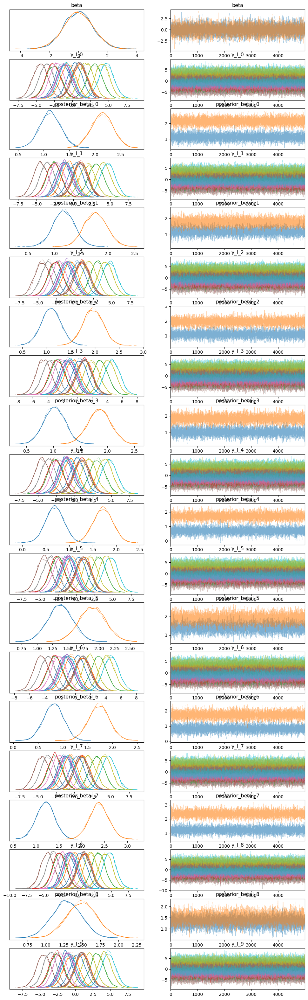

In [ ]:
import numpy as np
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 20  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p))

# Ground truth parameters for generating data
beta0 = np.array([1, 2])
mu0 = np.dot(X, beta0)
delta = 0.05
sigma0 = 1

# Generate points on the circle
num_points = 100  # Number of points on the circle
theta = np.linspace(0, 2 * np.pi, num_points)
circle_points = np.column_stack((beta0[0] + delta * np.cos(theta), beta0[1] + delta * np.sin(theta)))

# Vectorized response variable generation
muls = np.dot(X, circle_points[:25].T)  # Shape: (n, 25)
yls = muls + np.random.normal(0, sigma0, (n, 25))  # Shape: (n, 25)

posterior_pds = []
logBR_prior_pds = []
likelihood_prior_pds = []

with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    mu = pm.Deterministic("mu", pm.math.dot(X, beta))

    X_transpose = X.T
    Sigma_inv = np.eye(n) / sigma0**2
    Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2

    for i in range(25):
        # Calculate mu for each point on the circle
        mul = muls[:, i]

        # Generate response variable y for each point on the circle
        yl = yls[:, i]

        # Likelihood
        y_l = pm.MvNormal(f'y_l_{i}', mu=mul, cov=(sigma0**2) * np.eye(n), shape=n)

        # Posterior mean and covariance for beta
        cov_beta_post = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)
        mean_beta_post = np.dot(cov_beta_post, np.dot(X_transpose, np.dot(Sigma_inv, yl)) + Sigma_beta_inv.dot(np.ones(p) * mu_prior_mean))

        # Posterior log-probability
        posterior_betal = pm.MvNormal(f'posterior_betal_{i}', mu=mean_beta_post, cov=cov_beta_post)
        posterior_pdl = pm.Deterministic(f'posterior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=pm.math.dot(X, posterior_betal), cov=(sigma0**2) * np.eye(n), shape=(n,)), mu0).sum())
        posterior_pds.append(posterior_pdl)

        # Log BR
        logBR_prior_pdl = pm.Deterministic(f'logBR_prior_pdl_{i}', posterior_pdl - pm.logp(pm.MvNormal.dist(mu=mu_prior_mean, cov=(mu_prior_sigma**2) * np.eye(n), shape=(n,)), pm.math.dot(X, beta)).sum())
        logBR_prior_pds.append(logBR_prior_pdl)

        # Likelihood
        likelihood_prior_pdl = pm.Deterministic(f'likelihood_prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(sigma**2) * np.eye(n), shape=n), y_l).sum())
        likelihood_prior_pds.append(likelihood_prior_pdl)

    # Sampling
    idata = pm.sample(draws=5000, tune=1000)

# Use ArviZ to analyze the results
az.summary(idata)
az.plot_trace(idata)
plt.show()
print(idata.posterior)


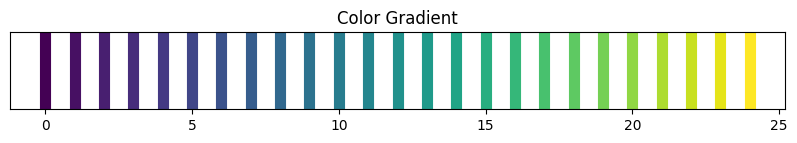

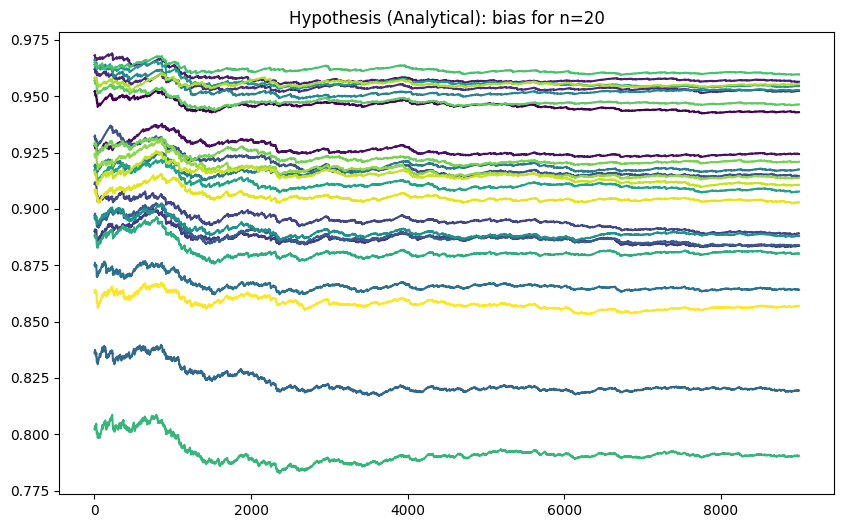

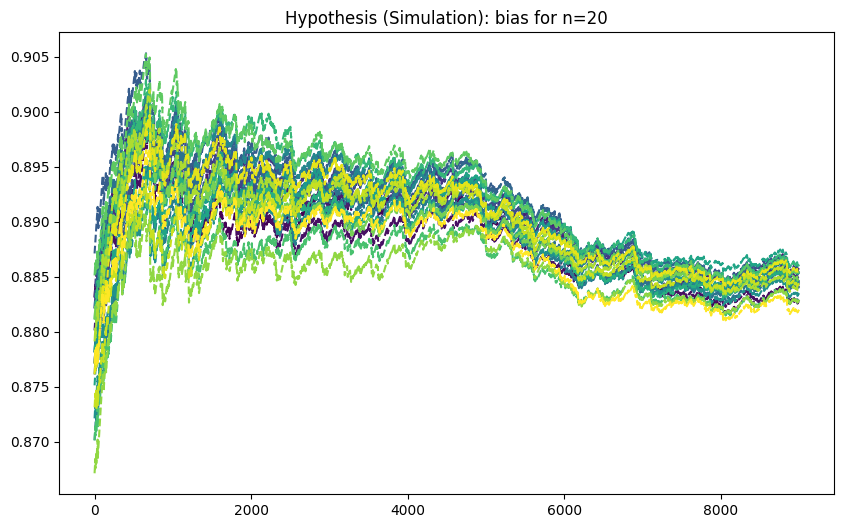

In [ ]:
from matplotlib import cm
def normal_logp_np(x, mu, sigma):
    return -0.5 * ((x - mu) / sigma) ** 2 - np.log(sigma) - 0.5 * np.log(2 * np.pi)
# Convert lists to numpy arrays
posterior_pds = np.array(posterior_pds)
logBR_prior_pds = np.array(logBR_prior_pds)
likelihood_prior_pds = np.array(likelihood_prior_pds)

# Compute biases for all points on the circle
bias_for = []
bias_for_ml = []
burn = 1000
num_points = 25
for idx in range(num_points):
    logBR_prior_pd_values = idata.posterior[f'logBR_prior_pdl_{idx}'].values.ravel()
    likelihood_prior_pd_values = idata.posterior[f'likelihood_prior_pdl_{idx}'].values.ravel()

    bias_for_values = logBR_prior_pd_values > 0
    bias_for_mci = bias_for_values.cumsum() / np.arange(1, len(bias_for_values) + 1)

    mu_samples = idata.posterior['mu'][:, :, 0].values.ravel()[:1000]
    y_samples = idata.posterior[f'y_l_{idx}'].values
    marginal_likelihoods = normal_logp_np(y_samples[:, :, :, np.newaxis], mu_samples, 1).sum(axis=2)
    log_marginal_likelihoods = np.log(np.exp(marginal_likelihoods).mean(axis=-1)).ravel()

    bias_for_ml_values = (likelihood_prior_pd_values - log_marginal_likelihoods) >= 0
    bias_for_ml_mci = bias_for_ml_values.cumsum() / np.arange(1, len(bias_for_ml_values) + 1)

    bias_for.append(bias_for_mci)
    bias_for_ml.append(bias_for_ml_mci)

# Generate colors from a colormap
colors = cm.viridis(np.linspace(0, 1, num_points))

# Plotting the color gradient
plt.figure(figsize=(10, 1))
for idx, color in enumerate(colors):
    plt.plot([idx, idx], [0, 1], color=color, linewidth=8)
plt.title("Color Gradient")
plt.yticks([])
plt.show()

# Plotting
plt.figure(figsize=(10, 6))
for idx in range(num_points):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    #plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Analytical): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points):
    #plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Simulation): bias for n={}".format(n))
plt.show()

yls [[-2.43249069e+00 -2.27897380e+00 -1.53805027e+00 -6.55213805e-01
  -7.98077595e-01 -9.92497283e-01 -2.41864146e+00 -9.91850099e-01
  -1.17403664e+00 -2.03973791e+00 -1.39275957e+00 -2.43093758e+00
  -3.62998194e+00 -2.88483791e+00 -1.11226347e+00 -1.47929607e+00
  -2.77086725e+00 -4.80403860e-01 -2.24738437e+00 -2.25998711e+00
  -2.08843943e+00 -1.98189980e+00 -1.85663023e+00 -1.41560189e+00
  -2.92033697e+00]
 [ 4.34896158e-01  6.27455281e-01  1.03822733e+00  4.03253588e-02
   1.87993632e-01  1.21443254e+00  2.27292258e+00 -1.47340178e-01
   3.52622670e-01  9.32181162e-01  9.78440003e-01  1.88223521e+00
  -2.79735240e-01 -8.60366229e-02  8.87834906e-01 -2.22473125e-01
   9.45064716e-02  1.45712442e+00  4.70132761e-01  1.83924854e+00
   1.81238951e+00  1.18551464e+00 -4.20020144e-01  1.02137216e+00
  -1.18785080e-01]
 [-1.83934065e+00 -1.73617103e+00 -2.97790198e+00 -3.53905747e+00
  -2.11114288e+00 -2.58055837e+00 -1.79530185e+00 -2.08841352e+00
  -2.64273065e+00 -2.06175034e+00 

/usr/local/lib/python3.10/dist-packages/arviz/utils.py:184: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)
/usr/local/lib/python3.10/dist-packages/arviz/plots/traceplot.py:222: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (79), generating only 20 plots
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/arviz/utils.py:184: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/e

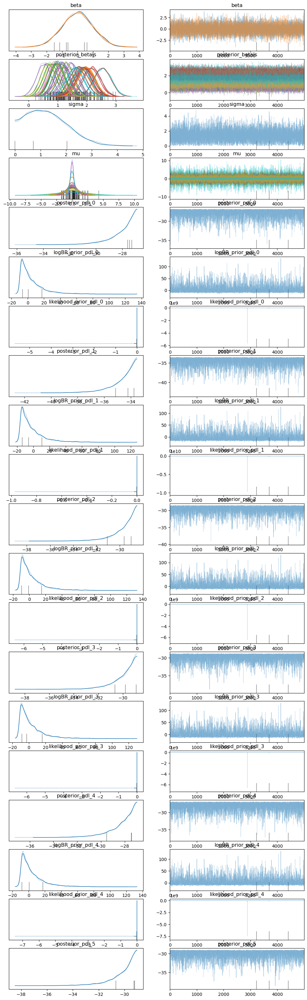

In [ ]:
import numpy as np
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 20  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p))

# Ground truth parameters for generating data
beta0 = np.array([1, 2])
mu0 = np.dot(X, beta0)
delta = 0.05
sigma0 = 1

# Generate points on the circle
num_points = 100  # Number of points on the circle
theta = np.linspace(0, 2 * np.pi, num_points)
circle_points = np.column_stack((beta0[0] + delta * np.cos(theta), beta0[1] + delta * np.sin(theta)))

# Reduce the number of points to iterate over for efficiency
circle_points = circle_points[:25]

# Vectorized response variable generation
muls = np.dot(X, circle_points.T)  # Shape: (n, 25)
yls = muls + np.random.normal(0, sigma0, (n, 25))  # Shape: (n, 25)

print("yls", yls)


# Precompute inverse matrices and other repeated values
X_transpose = X.T
Sigma_inv = np.eye(n) / sigma0**2
Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2
cov_beta_post_common = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)

# Vectorized calculation of mean_beta_post for all points on the circle
mean_beta_posts = np.dot(cov_beta_post_common, np.dot(X_transpose, np.dot(Sigma_inv, yls)) + Sigma_beta_inv.dot(np.ones((p, 25)) * mu_prior_mean))

# Initialize PyMC model
with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    mu = pm.Deterministic("mu", pm.math.dot(X, beta))

    # Posterior log-probability calculations
    posterior_betals = pm.MvNormal('posterior_betals', mu=mean_beta_posts.T, cov=cov_beta_post_common, shape=(25, p))

    # Calculate the mu for the posterior predictive distribution
    posterior_mus = pm.math.dot(X, posterior_betals.T)  # Shape: (n, 25)

    # Ensure the shapes are correct for logp calculation
    posterior_mus = posterior_mus.T  # Shape: (25, n)
    yls_transposed = yls.T  # Shape: (25, n)

    # Compute log-probabilities for each point
    posterior_pdls = []
    logBR_prior_pds = []
    likelihood_prior_pdls = []

    for i in range(len(circle_points)):
        posterior_pdli = pm.Deterministic(f'posterior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=posterior_mus[i], cov=(sigma0**2) * np.eye(n)), yls_transposed[i]).sum())
        posterior_pdls.append(posterior_pdli)

        logBR_prior_pdl = pm.Deterministic(f'logBR_prior_pdl_{i}', posterior_pdli - pm.logp(pm.MvNormal.dist(mu=mu_prior_mean, cov=(mu_prior_sigma**2) * np.eye(n), shape=(n,)), pm.math.dot(X, beta)).sum())
        logBR_prior_pds.append(logBR_prior_pdl)

        likelihood_prior_pdli = pm.Deterministic(f'likelihood_prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(sigma**2) * np.eye(n)), yls_transposed[i]).sum())
        likelihood_prior_pdls.append(likelihood_prior_pdli)

    # Sampling
    idata = pm.sample(draws=5000, tune=1000)


# Use ArviZ to analyze the results
az.summary(idata)
az.plot_trace(idata)
plt.show()
print(idata.posterior)
print("Shape of X:", X.shape)
print("Shape of circle_points[:25]:", circle_points.shape)
print("Shape of muls:", muls.shape)
print("Shape of yls:", yls.shape)


<ipython-input-6-ecb9f9eb00f3>:28: RuntimeWarning: divide by zero encountered in log
  log_marginal_likelihoods = np.log(np.exp(marginal_likelihoods).mean(axis=0)).ravel()


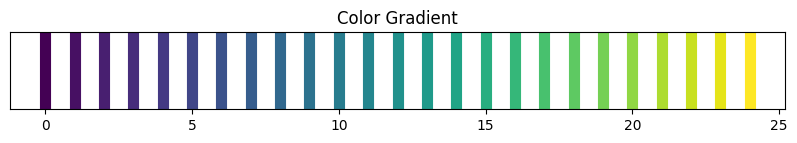

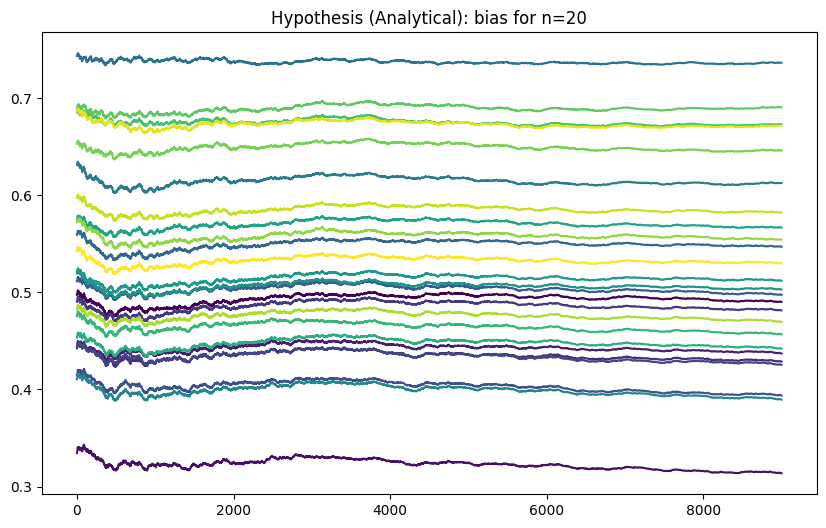

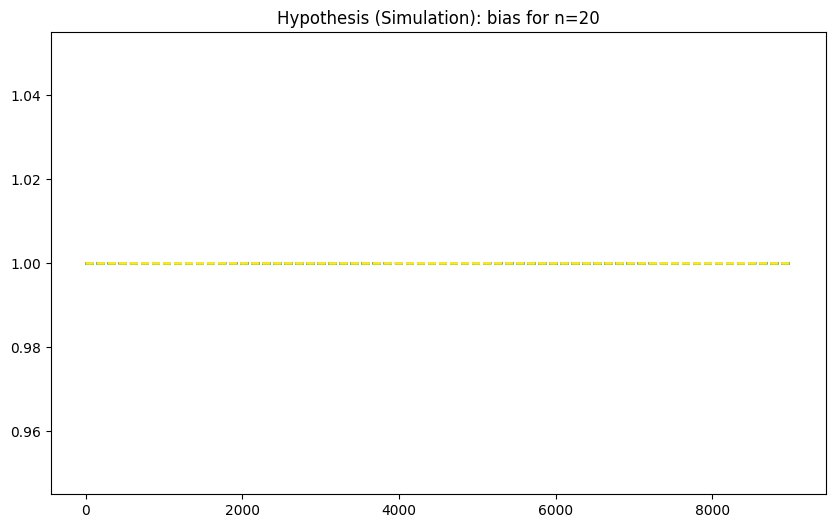

In [ ]:
from matplotlib import cm

# Convert lists to numpy arrays
posterior_pds = np.array(posterior_pdls)
logBR_prior_pds = np.array(logBR_prior_pds)
likelihood_prior_pds = np.array(likelihood_prior_pdls)

# Bias calculation
def normal_logp_np(x, mu, sigma):
    return -0.5 * ((x - mu) / sigma) ** 2 - np.log(sigma) - 0.5 * np.log(2 * np.pi)

# Compute biases for all points on the circle
bias_for = []
bias_for_ml = []
burn = 1000
num_points = 25

for idx in range(num_points):
    logBR_prior_pd_values = idata.posterior[f'logBR_prior_pdl_{idx}'].values.ravel()
    likelihood_prior_pd_values = idata.posterior[f'likelihood_prior_pdl_{idx}'].values.ravel()

    bias_for_values = logBR_prior_pd_values > 0
    bias_for_mci = bias_for_values.cumsum() / np.arange(1, len(bias_for_values) + 1)

    mu_samples = idata.posterior['mu'][:, :, 0].values.ravel()[:1000]
    y_samples = yls_transposed[idx]
    marginal_likelihoods = normal_logp_np(y_samples[:, np.newaxis], mu_samples, 1).sum(axis=1)
    log_marginal_likelihoods = np.log(np.exp(marginal_likelihoods).mean(axis=0)).ravel()

    bias_for_ml_values = (likelihood_prior_pd_values - log_marginal_likelihoods) >= 0
    bias_for_ml_mci = bias_for_ml_values.cumsum() / np.arange(1, len(bias_for_ml_values) + 1)

    bias_for.append(bias_for_mci)
    bias_for_ml.append(bias_for_ml_mci)

# Generate colors from a colormap
colors = cm.viridis(np.linspace(0, 1, num_points))

# Plotting the color gradient
plt.figure(figsize=(10, 1))
for idx, color in enumerate(colors):
    plt.plot([idx, idx], [0, 1], color=color, linewidth=8)
plt.title("Color Gradient")
plt.yticks([])
plt.show()

# Plotting
plt.figure(figsize=(10, 6))
for idx in range(num_points):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    # plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Analytical): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points):
    # plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Simulation): bias for n={}".format(n))
plt.show()

In [ ]:
import numpy as np
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt
import time

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 20  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p))

# Ground truth parameters for generating data
beta0 = np.array([1, 2])
mu0 = np.dot(X, beta0)
delta = 0.05
sigma0 = 1

# Generate points on the circle
num_points = 100  # Number of points on the circle
theta = np.linspace(0, 2 * np.pi, num_points)
circle_points = np.column_stack((beta0[0] + delta * np.cos(theta), beta0[1] + delta * np.sin(theta)))

# Reduce the number of points to iterate over for efficiency
circle_points = circle_points[:25]

# Vectorized response variable generation
muls = np.dot(X, circle_points.T).T  # Shape: (25, n)
yls = muls + np.random.normal(0, sigma0, (25, n))  # Shape: (25, n)

posterior_pds = []
logBR_prior_pds = []
likelihood_prior_pds = []

start_time = time.time()

with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    mu = pm.Deterministic("mu", pm.math.dot(X, beta))

    X_transpose = X.T
    Sigma_inv = np.eye(n) / sigma0**2
    Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2

    cov_beta_post = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)

    # Iterate over each point on the circle
    for i, betal in enumerate(circle_points[:25]):
        # Calculate mu for each point on the circle

        # Likelihood
        y_l = pm.MvNormal(f'y_l_{i}', mu=muls[i], cov=(sigma0**2) * np.eye(n), shape=n)
        # Posterior mean and covariance for beta
        mean_beta_post = np.dot(cov_beta_post, np.dot(X_transpose, np.dot(Sigma_inv, yls[i])) + Sigma_beta_inv.dot(np.ones(p) * mu_prior_mean))

        # Posterior log-probability
        posterior_betal = pm.MvNormal(f'posterior_betal_{i}', mu=mean_beta_post, cov=cov_beta_post)
        posterior_pdl = pm.Deterministic(f'posterior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=pm.math.dot(X, posterior_betal), cov=(sigma0**2) * np.eye(n), shape=(n,)), mu0).sum())
        posterior_pds.append(posterior_pdl)

        # Log BR
        logBR_prior_pdl = pm.Deterministic(f'logBR_prior_pdl_{i}', posterior_pdl - pm.logp(pm.MvNormal.dist(mu=mu_prior_mean, cov=(mu_prior_sigma**2) * np.eye(n), shape=(n,)), pm.math.dot(X, beta)).sum())
        logBR_prior_pds.append(logBR_prior_pdl)

        # Likelihood
        likelihood_prior_pdl = pm.Deterministic(f'likelihood_prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(sigma**2) * np.eye(n), shape=n), y_l).sum())
        likelihood_prior_pds.append(likelihood_prior_pdl)

    # Sampling
    idata = pm.sample(draws=5000, tune=1000)

end_time = time.time()

# Calculate elapsed time
elapsed_time = end_time - start_time

print(f"Cell execution time: {elapsed_time:.2f} seconds")


Cell execution time: 1664.60 seconds


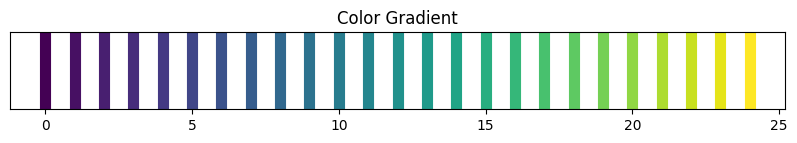

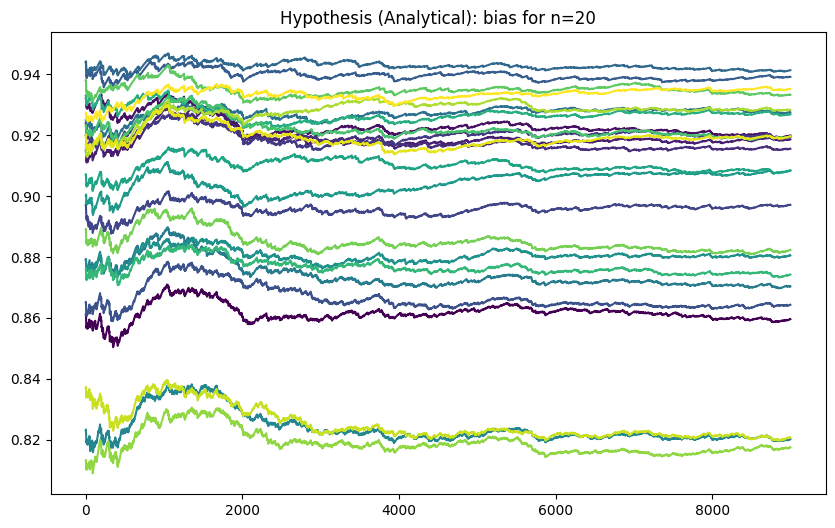

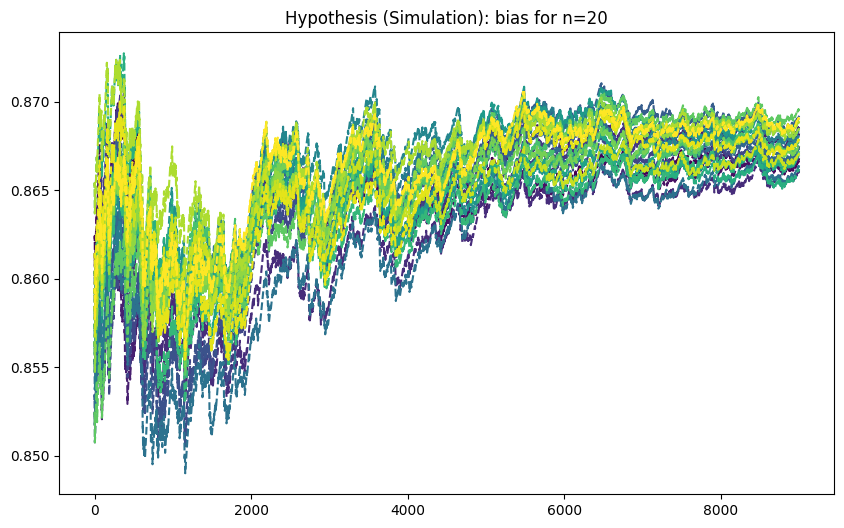

In [ ]:
from matplotlib import cm

# Convert lists to numpy arrays
posterior_pds = np.array(posterior_pds)
logBR_prior_pds = np.array(logBR_prior_pds)
likelihood_prior_pds = np.array(likelihood_prior_pds)

# Compute biases for all points on the circle
bias_for = []
bias_for_ml = []
burn = 1000
num_points = 25
for idx in range(num_points):
    logBR_prior_pd_values = idata.posterior[f'logBR_prior_pdl_{idx}'].values.ravel()
    likelihood_prior_pd_values = idata.posterior[f'likelihood_prior_pdl_{idx}'].values.ravel()

    bias_for_values = logBR_prior_pd_values > 0
    bias_for_mci = bias_for_values.cumsum() / np.arange(1, len(bias_for_values) + 1)

    mu_samples = idata.posterior['mu'][:, :, 0].values.ravel()[:1000]
    y_samples = idata.posterior[f'y_l_{idx}'].values
    marginal_likelihoods = normal_logp_np(y_samples[:, :, :, np.newaxis], mu_samples, 1).sum(axis=2)
    log_marginal_likelihoods = np.log(np.exp(marginal_likelihoods).mean(axis=-1)).ravel()

    bias_for_ml_values = (likelihood_prior_pd_values - log_marginal_likelihoods) >= 0
    bias_for_ml_mci = bias_for_ml_values.cumsum() / np.arange(1, len(bias_for_ml_values) + 1)

    bias_for.append(bias_for_mci)
    bias_for_ml.append(bias_for_ml_mci)

# Generate colors from a colormap
colors = cm.viridis(np.linspace(0, 1, num_points))

# Plotting the color gradient
plt.figure(figsize=(10, 1))
for idx, color in enumerate(colors):
    plt.plot([idx, idx], [0, 1], color=color, linewidth=8)
plt.title("Color Gradient")
plt.yticks([])
plt.show()

# Plotting
plt.figure(figsize=(10, 6))
for idx in range(num_points):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    #plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Analytical): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points):
    #plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Simulation): bias for n={}".format(n))
plt.show()

Fullllllll

In [ ]:
import numpy as np
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt
import time

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 20  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p))

# Ground truth parameters for generating data
beta0 = np.array([1, 2])
mu0 = np.dot(X, beta0)
delta = 0.05
sigma0 = 1

# Generate points on the circle
num_points = 40  # Number of points on the circle
theta = np.linspace(0, 2 * np.pi, num_points)
circle_points = np.column_stack((beta0[0] + delta * np.cos(theta), beta0[1] + delta * np.sin(theta)))



# Vectorized response variable generation
muls = np.dot(X, circle_points.T).T  # Shape: (num_points, n)
yls = muls + np.random.normal(0, sigma0, (num_points, n))  # Shape: (num_points, n)

posterior_pds = []
logBR_prior_pds = []
likelihood_prior_pds = []

start_time = time.time()

with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    mu = pm.Deterministic("mu", pm.math.dot(X, beta))

    X_transpose = X.T
    Sigma_inv = np.eye(n) / sigma0**2
    Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2

    cov_beta_post = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)

    # Iterate over each point on the circle
    for i, betal in enumerate(circle_points[:25]):
        # Calculate mu for each point on the circle

        # Likelihood
        y_l = pm.MvNormal(f'y_l_{i}', mu=muls[i], cov=(sigma0**2) * np.eye(n), shape=n)
        # Posterior mean and covariance for beta
        mean_beta_post = np.dot(cov_beta_post, np.dot(X_transpose, np.dot(Sigma_inv, yls[i])) + Sigma_beta_inv.dot(np.ones(p) * mu_prior_mean))

        # Posterior log-probability
        posterior_betal = pm.MvNormal(f'posterior_betal_{i}', mu=mean_beta_post, cov=cov_beta_post)
        posterior_pdl = pm.Deterministic(f'posterior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=pm.math.dot(X, posterior_betal), cov=(sigma0**2) * np.eye(n), shape=(n,)), mu0).sum())
        posterior_pds.append(posterior_pdl)

        # Log BR
        logBR_prior_pdl = pm.Deterministic(f'logBR_prior_pdl_{i}', posterior_pdl - pm.logp(pm.MvNormal.dist(mu=mu_prior_mean, cov=(mu_prior_sigma**2) * np.eye(n), shape=(n,)), pm.math.dot(X, beta)).sum())
        logBR_prior_pds.append(logBR_prior_pdl)

        # Likelihood
        likelihood_prior_pdl = pm.Deterministic(f'likelihood_prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(sigma**2) * np.eye(n), shape=n), y_l).sum())
        likelihood_prior_pds.append(likelihood_prior_pdl)

    # Sampling
    idata = pm.sample(draws=5000, tune=1000)

end_time = time.time()

# Calculate elapsed time
elapsed_time = end_time - start_time

print(f"Cell execution time: {elapsed_time:.2f} seconds")


Cell execution time: 1637.74 seconds


Inward square

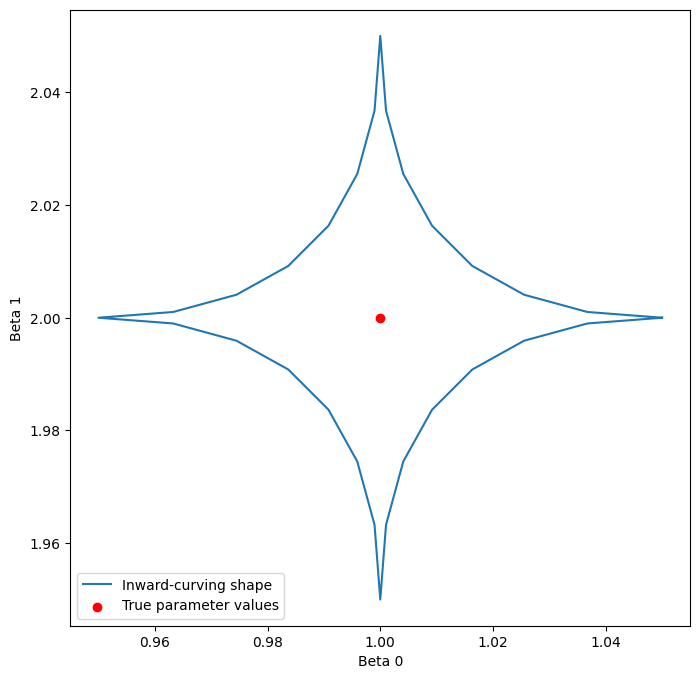

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.special import binom

# Function to calculate Bezier curve points
def bezier_curve(control_points, num_points=100):
    n = len(control_points) - 1
    curve = np.zeros((num_points, 2))
    t = np.linspace(0, 1, num_points)
    for i in range(n + 1):
        curve += np.outer(binom(n, i) * (t ** i) * ((1 - t) ** (n - i)), control_points[i])
    return curve

# True parameter values
beta0 = np.array([1, 2])
delta = 0.05  # Half-diagonal length of the rhombus

# Define the four vertices of the rhombus
vertices = np.array([
    [beta0[0] + delta, beta0[1]],  # Right vertex
    [beta0[0], beta0[1] + delta],  # Top vertex
    [beta0[0] - delta, beta0[1]],  # Left vertex
    [beta0[0], beta0[1] - delta]   # Bottom vertex
])

# Define control points for inward-curving sides
control_points = []
control_points.append([vertices[0], beta0, vertices[1]])  # Right to Top
control_points.append([vertices[1], beta0, vertices[2]])  # Top to Left
control_points.append([vertices[2], beta0, vertices[3]])  # Left to Bottom
control_points.append([vertices[3], beta0, vertices[0]])  # Bottom to Right

# Generate points on the inward-curving rhombus
num_points_per_curve = 8
curved_points = []
for cp in control_points:
    curve = bezier_curve(cp, num_points_per_curve)
    curved_points.append(curve)

# Concatenate all points
curved_rhombus_points = np.vstack(curved_points)

# Plotting the rhombus-like shape and the true parameter values
plt.figure(figsize=(8, 8))
plt.plot(curved_rhombus_points[:, 0], curved_rhombus_points[:, 1], label='Inward-curving shape')
plt.scatter(beta0[0], beta0[1], color='red', label='True parameter values')
plt.xlabel('Beta 0')
plt.ylabel('Beta 1')
plt.legend(loc=3)
plt.axis('equal')
plt.show()


In [ ]:
import numpy as np
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt
import time

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 20  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p))

# Ground truth parameters for generating data
beta0 = np.array([1, 2])
mu0 = np.dot(X, beta0)
delta = 0.05
sigma0 = 1

num_points = len(curved_rhombus_points)

# Vectorized response variable generation
muls = np.dot(X, curved_rhombus_points.T).T  # Shape: (25, n)
yls = muls + np.random.normal(0, sigma0, (num_points, n))  # Shape: (25, n)

posterior_pds = []
logBR_prior_pds = []
likelihood_prior_pds = []

start_time = time.time()

with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    mu = pm.Deterministic("mu", pm.math.dot(X, beta))

    X_transpose = X.T
    Sigma_inv = np.eye(n) / sigma0**2
    Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2

    cov_beta_post = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)

    # Iterate over each point on the circle
    for i, betal in enumerate(curved_rhombus_points):
        # Calculate mu for each point on the circle

        # Likelihood
        y_l = pm.MvNormal(f'y_l_{i}', mu=muls[i], cov=(sigma0**2) * np.eye(n), shape=n)
        # Posterior mean and covariance for beta
        mean_beta_post = np.dot(cov_beta_post, np.dot(X_transpose, np.dot(Sigma_inv, yls[i])) + Sigma_beta_inv.dot(np.ones(p) * mu_prior_mean))

        # Posterior log-probability
        posterior_betal = pm.MvNormal(f'posterior_betal_{i}', mu=mean_beta_post, cov=cov_beta_post)
        posterior_pdl = pm.Deterministic(f'posterior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=pm.math.dot(X, posterior_betal), cov=(sigma0**2) * np.eye(n), shape=(n,)), mu0).sum())
        posterior_pds.append(posterior_pdl)

        # Log BR
        logBR_prior_pdl = pm.Deterministic(f'logBR_prior_pdl_{i}', posterior_pdl - pm.logp(pm.MvNormal.dist(mu=mu_prior_mean, cov=(mu_prior_sigma**2) * np.eye(n), shape=(n,)), pm.math.dot(X, beta)).sum())
        logBR_prior_pds.append(logBR_prior_pdl)

        # Likelihood
        likelihood_prior_pdl = pm.Deterministic(f'likelihood_prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(sigma**2) * np.eye(n), shape=n), y_l).sum())
        likelihood_prior_pds.append(likelihood_prior_pdl)

    # Sampling
    idata = pm.sample(draws=5000, tune=1000)

end_time = time.time()

# Calculate elapsed time
elapsed_time = end_time - start_time

print(f"Cell execution time: {elapsed_time:.2f} seconds")


Cell execution time: 2758.64 seconds


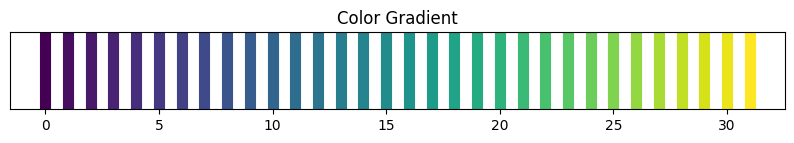

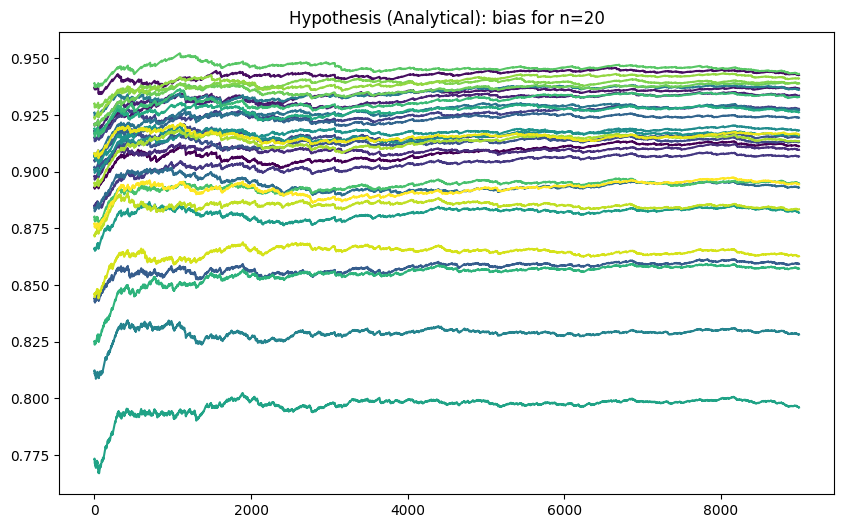

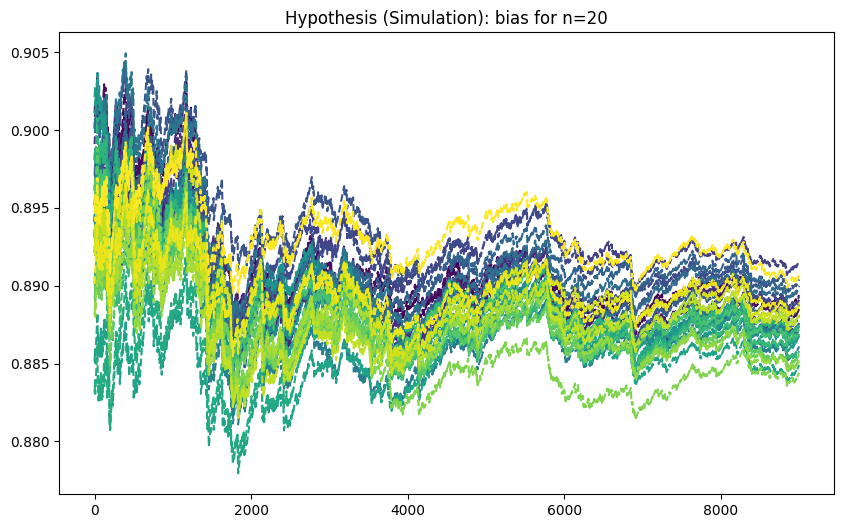

In [ ]:
from matplotlib import cm
def normal_logp_np(x, mu, sigma):
    return -0.5 * ((x - mu) / sigma) ** 2 - np.log(sigma) - 0.5 * np.log(2 * np.pi)
# Convert lists to numpy arrays
posterior_pds = np.array(posterior_pds)
logBR_prior_pds = np.array(logBR_prior_pds)
likelihood_prior_pds = np.array(likelihood_prior_pds)

# Compute biases for all points on the circle
bias_for = []
bias_for_ml = []
burn = 1000
for idx in range(num_points):
    logBR_prior_pd_values = idata.posterior[f'logBR_prior_pdl_{idx}'].values.ravel()
    likelihood_prior_pd_values = idata.posterior[f'likelihood_prior_pdl_{idx}'].values.ravel()

    bias_for_values = logBR_prior_pd_values > 0
    bias_for_mci = bias_for_values.cumsum() / np.arange(1, len(bias_for_values) + 1)

    mu_samples = idata.posterior['mu'][:, :, 0].values.ravel()[:1000]
    y_samples = idata.posterior[f'y_l_{idx}'].values
    marginal_likelihoods = normal_logp_np(y_samples[:, :, :, np.newaxis], mu_samples, 1).sum(axis=2)
    log_marginal_likelihoods = np.log(np.exp(marginal_likelihoods).mean(axis=-1)).ravel()

    bias_for_ml_values = (likelihood_prior_pd_values - log_marginal_likelihoods) >= 0
    bias_for_ml_mci = bias_for_ml_values.cumsum() / np.arange(1, len(bias_for_ml_values) + 1)

    bias_for.append(bias_for_mci)
    bias_for_ml.append(bias_for_ml_mci)

# Generate colors from a colormap
colors = cm.viridis(np.linspace(0, 1, num_points))

# Plotting the color gradient
plt.figure(figsize=(10, 1))
for idx, color in enumerate(colors):
    plt.plot([idx, idx], [0, 1], color=color, linewidth=8)
plt.title("Color Gradient")
plt.yticks([])
plt.show()

# Plotting
plt.figure(figsize=(10, 6))
for idx in range(num_points):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    #plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Analytical): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points):
    #plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Simulation): bias for n={}".format(n))
plt.show()

Attempt to vectorise

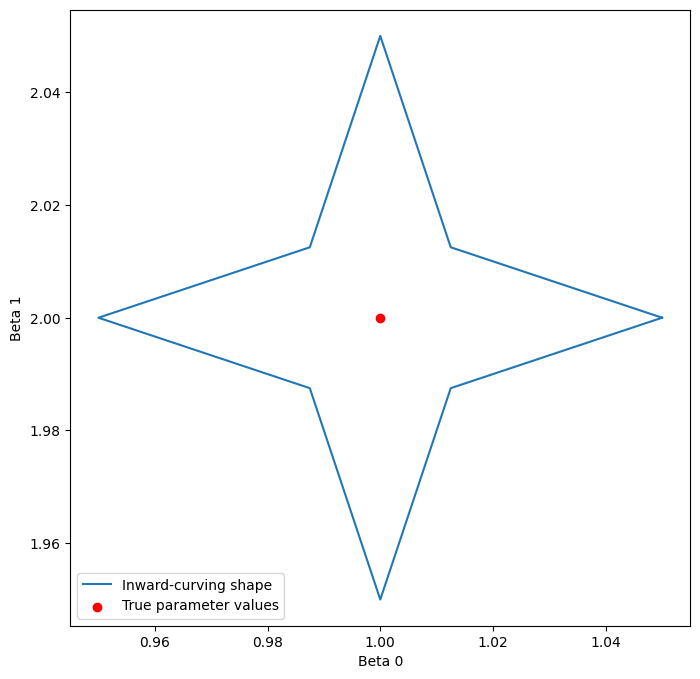

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.special import binom

# Function to calculate Bezier curve points
def bezier_curve(control_points, num_points=100):
    n = len(control_points) - 1
    curve = np.zeros((num_points, 2))
    t = np.linspace(0, 1, num_points)
    for i in range(n + 1):
        curve += np.outer(binom(n, i) * (t ** i) * ((1 - t) ** (n - i)), control_points[i])
    return curve

# True parameter values
beta0 = np.array([1, 2])
delta = 0.05  # Half-diagonal length of the rhombus

# Define the four vertices of the rhombus
vertices = np.array([
    [beta0[0] + delta, beta0[1]],  # Right vertex
    [beta0[0], beta0[1] + delta],  # Top vertex
    [beta0[0] - delta, beta0[1]],  # Left vertex
    [beta0[0], beta0[1] - delta]   # Bottom vertex
])

# Define control points for inward-curving sides
control_points = []
control_points.append([vertices[0], beta0, vertices[1]])  # Right to Top
control_points.append([vertices[1], beta0, vertices[2]])  # Top to Left
control_points.append([vertices[2], beta0, vertices[3]])  # Left to Bottom
control_points.append([vertices[3], beta0, vertices[0]])  # Bottom to Right

# Generate points on the inward-curving rhombus
num_points_per_curve = 3
curved_points = []
for cp in control_points:
    curve = bezier_curve(cp, num_points_per_curve)
    curved_points.append(curve)

# Concatenate all points
curved_rhombus_points = np.vstack(curved_points)

# Plotting the rhombus-like shape and the true parameter values
plt.figure(figsize=(8, 8))
plt.plot(curved_rhombus_points[:, 0], curved_rhombus_points[:, 1], label='Inward-curving shape')
plt.scatter(beta0[0], beta0[1], color='red', label='True parameter values')
plt.xlabel('Beta 0')
plt.ylabel('Beta 1')
plt.legend(loc=3)
plt.axis('equal')
plt.show()


In [ ]:
import numpy as np
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt
import time

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 20  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p))

# Ground truth parameters for generating data
beta0 = np.array([1, 2])
mu0 = np.dot(X, beta0)
delta = 0.05
sigma0 = 1

num_points = len(curved_rhombus_points)

# Vectorized response variable generation
muls = np.dot(X, curved_rhombus_points.T).T  # Shape: (25, n)
yls = muls + np.random.normal(0, sigma0, (num_points, n))  # Shape: (25, n)

posterior_pds = []
logBR_prior_pds = []
likelihood_prior_pds = []

start_time = time.time()

with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    mu = pm.Deterministic("mu", pm.math.dot(X, beta))

    X_transpose = X.T
    Sigma_inv = np.eye(n) / sigma0**2
    Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2

    cov_beta_post = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)

    # Iterate over each point on the circle
    for i, betal in enumerate(curved_rhombus_points):
        # Calculate mu for each point on the circle

        # Likelihood
        y_l = pm.MvNormal(f'y_l_{i}', mu=muls[i], cov=(sigma0**2) * np.eye(n), shape=n)
        # Posterior mean and covariance for beta
        mean_beta_post = np.dot(cov_beta_post, np.dot(X_transpose, np.dot(Sigma_inv, yls[i])) + Sigma_beta_inv.dot(np.ones(p) * mu_prior_mean))

        # Posterior log-probability
        posterior_betal = pm.MvNormal(f'posterior_betal_{i}', mu=mean_beta_post, cov=cov_beta_post)
        posterior_pdl = pm.Deterministic(f'posterior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=pm.math.dot(X, posterior_betal), cov=(sigma0**2) * np.eye(n), shape=(n,)), mu0).sum())
        posterior_pds.append(posterior_pdl)

        # Log BR
        logBR_prior_pdl = pm.Deterministic(f'logBR_prior_pdl_{i}', posterior_pdl - pm.logp(pm.MvNormal.dist(mu=mu_prior_mean, cov=(mu_prior_sigma**2) * np.eye(n), shape=(n,)), pm.math.dot(X, beta)).sum())
        logBR_prior_pds.append(logBR_prior_pdl)

        # Likelihood
        likelihood_prior_pdl = pm.Deterministic(f'likelihood_prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(sigma**2) * np.eye(n), shape=n), y_l).sum())
        likelihood_prior_pds.append(likelihood_prior_pdl)

    # Sampling
    idata = pm.sample(draws=5000, tune=1000)

end_time = time.time()

# Calculate elapsed time
elapsed_time = end_time - start_time

print(f"Cell execution time: {elapsed_time:.2f} seconds")


Cell execution time: 842.45 seconds


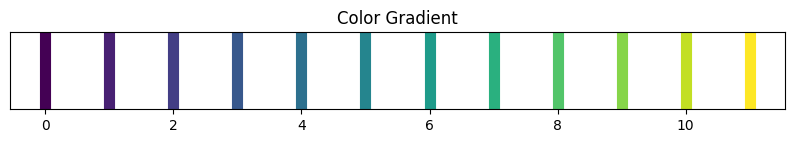

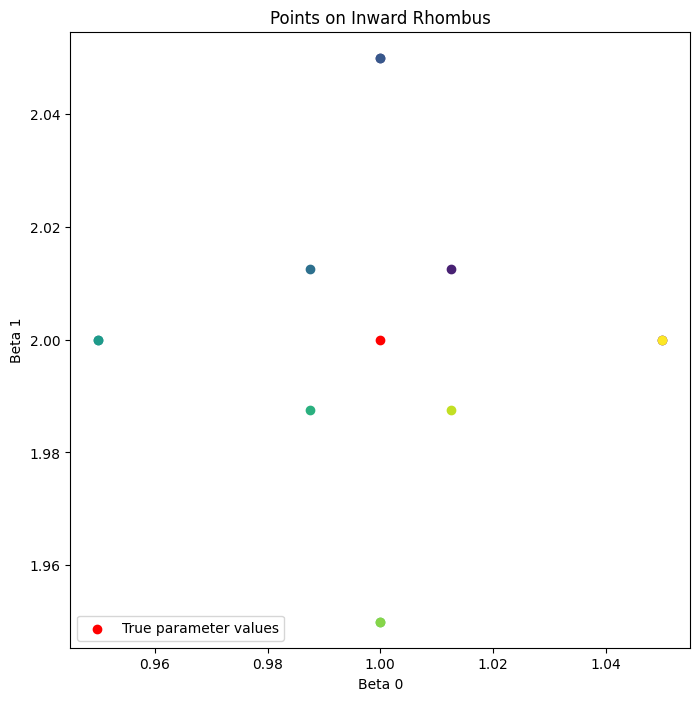

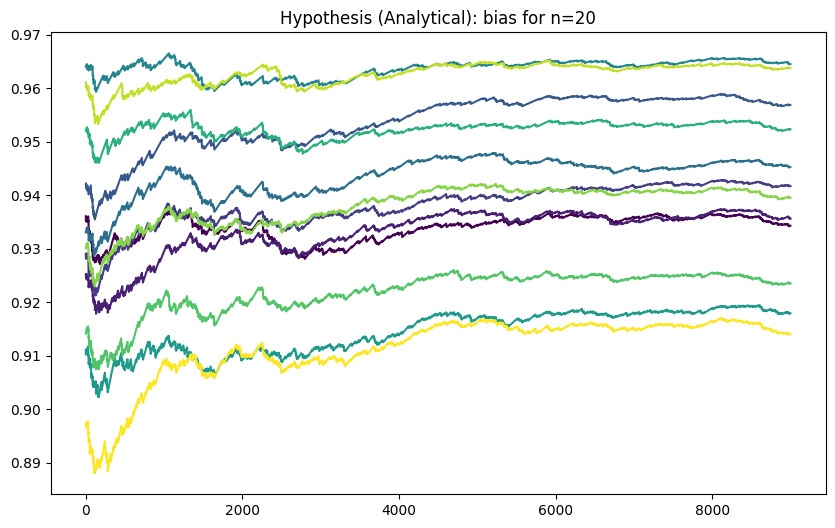

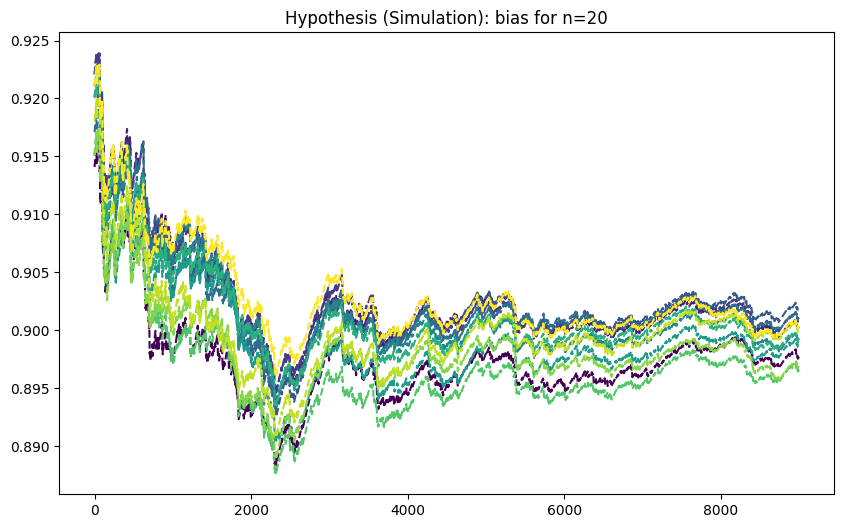

In [ ]:
from matplotlib import cm
def normal_logp_np(x, mu, sigma):
    return -0.5 * ((x - mu) / sigma) ** 2 - np.log(sigma) - 0.5 * np.log(2 * np.pi)
# Convert lists to numpy arrays
posterior_pds = np.array(posterior_pds)
logBR_prior_pds = np.array(logBR_prior_pds)
likelihood_prior_pds = np.array(likelihood_prior_pds)

# Compute biases for all points on the circle
bias_for = []
bias_for_ml = []
burn = 1000
for idx in range(num_points):
    logBR_prior_pd_values = idata.posterior[f'logBR_prior_pdl_{idx}'].values.ravel()
    likelihood_prior_pd_values = idata.posterior[f'likelihood_prior_pdl_{idx}'].values.ravel()

    bias_for_values = logBR_prior_pd_values > 0
    bias_for_mci = bias_for_values.cumsum() / np.arange(1, len(bias_for_values) + 1)

    mu_samples = idata.posterior['mu'][:, :, 0].values.ravel()[:1000]
    y_samples = idata.posterior[f'y_l_{idx}'].values
    marginal_likelihoods = normal_logp_np(y_samples[:, :, :, np.newaxis], mu_samples, 1).sum(axis=2)
    log_marginal_likelihoods = np.log(np.exp(marginal_likelihoods).mean(axis=-1)).ravel()

    bias_for_ml_values = (likelihood_prior_pd_values - log_marginal_likelihoods) >= 0
    bias_for_ml_mci = bias_for_ml_values.cumsum() / np.arange(1, len(bias_for_ml_values) + 1)

    bias_for.append(bias_for_mci)
    bias_for_ml.append(bias_for_ml_mci)

# Generate colors from a colormap
colors = cm.viridis(np.linspace(0, 1, num_points))

# Plotting the color gradient
plt.figure(figsize=(10, 1))
for idx, color in enumerate(colors):
    plt.plot([idx, idx], [0, 1], color=color, linewidth=8)
plt.title("Color Gradient")
plt.yticks([])
plt.show()


# Generate colors from a colormap
colors = cm.viridis(np.linspace(0, 1, num_points))

# Plotting the circle and the true parameter values
plt.figure(figsize=(8, 8))
plt.scatter(beta0[0], beta0[1], color='red', label='True parameter values')


for idx in range(num_points):
    plt.scatter(curved_rhombus_points[idx, 0], curved_rhombus_points[idx, 1], color=colors[idx])

plt.xlabel('Beta 0')
plt.ylabel('Beta 1')
plt.legend(loc=3)
plt.axis('equal')
plt.title('Points on Inward Rhombus')
plt.show()


# Plotting
plt.figure(figsize=(10, 6))
for idx in range(num_points):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    #plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Analytical): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points):
    #plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Simulation): bias for n={}".format(n))
plt.show()

In [ ]:
import numpy as np
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt
import time

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 20  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p))

# Ground truth parameters for generating data
beta0 = np.array([1, 2])
mu0 = np.dot(X, beta0)
delta = 0.05
sigma0 = 1

num_points = len(curved_rhombus_points)

# Vectorized response variable generation
muls = np.dot(X, curved_rhombus_points.T).T  # Shape: (25, n)
yls = muls + np.random.normal(0, sigma0, (num_points, n))  # Shape: (25, n)


posterior_pds = []
logBR_prior_pds = []
likelihood_prior_pds = []

start_time = time.time()

with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    mu = pm.Deterministic("mu", pm.math.dot(X, beta))

    X_transpose = X.T
    Sigma_inv = np.eye(n) / sigma0**2
    Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2

    cov_beta_post = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)
    # Vectorize mean_beta_post calculation
    yls_stack = np.stack(yls)  # Shape: (num_points, n)
    Sigma_inv_dot_yls = np.dot(Sigma_inv, yls_stack.T).T  # Shape: (num_points, n)
    mean_beta_posts = (np.dot(cov_beta_post, np.dot(X_transpose, Sigma_inv_dot_yls.T) + Sigma_beta_inv.dot(np.ones(p) * mu_prior_mean)[:, np.newaxis])).T

    print(mean_beta_posts)
    y_ls = pm.MvNormal('y_l', mu=muls, cov=(sigma0**2) * np.eye(n), shape=(num_points, n))

    # Iterate over each point on the circle
    for i, betal in enumerate(curved_rhombus_points):
        # Calculate mu for each point on the circle
        y_l = pm.Deterministic(f'y_l_{i}', y_ls[i])
        # Likelihood
        #y_l = pm.MvNormal(f'y_l_{i}', mu=muls[i], cov=(sigma0**2) * np.eye(n), shape=n)
        # Posterior mean and covariance for beta

        # Posterior log-probability
        posterior_betal = pm.MvNormal(f'posterior_betal_{i}', mu=mean_beta_posts[i], cov=cov_beta_post)
        posterior_pdl = pm.Deterministic(f'posterior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=pm.math.dot(X, posterior_betal), cov=(sigma0**2) * np.eye(n), shape=(n,)), mu0).sum())
        posterior_pds.append(posterior_pdl)

        # Log BR
        logBR_prior_pdl = pm.Deterministic(f'logBR_prior_pdl_{i}', posterior_pdl - pm.logp(pm.MvNormal.dist(mu=mu_prior_mean, cov=(mu_prior_sigma**2) * np.eye(n), shape=(n,)), pm.math.dot(X, beta)).sum())
        logBR_prior_pds.append(logBR_prior_pdl)

        # Likelihood
        likelihood_prior_pdl = pm.Deterministic(f'likelihood_prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(sigma**2) * np.eye(n), shape=n), y_l).sum())
        likelihood_prior_pds.append(likelihood_prior_pdl)

    # Sampling
    idata = pm.sample(draws=5000, tune=1000)

end_time = time.time()

# Calculate elapsed time
elapsed_time = end_time - start_time

print(f"Cell execution time: {elapsed_time:.2f} seconds")


[[0.70166934 1.94714016]
 [1.12091127 2.1268756 ]
 [0.39814803 2.2295872 ]
 [1.36027542 1.89600903]
 [0.70031737 1.84542927]
 [0.66574235 1.96278982]
 [0.86404209 1.74953153]
 [1.13308189 2.11273596]
 [0.41218485 1.35901363]
 [0.85474914 1.9459799 ]
 [0.88418718 1.82766548]
 [0.77307527 2.09394144]]


Cell execution time: 756.50 seconds


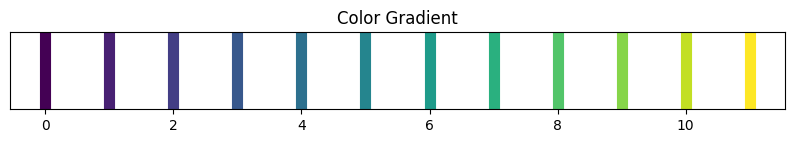

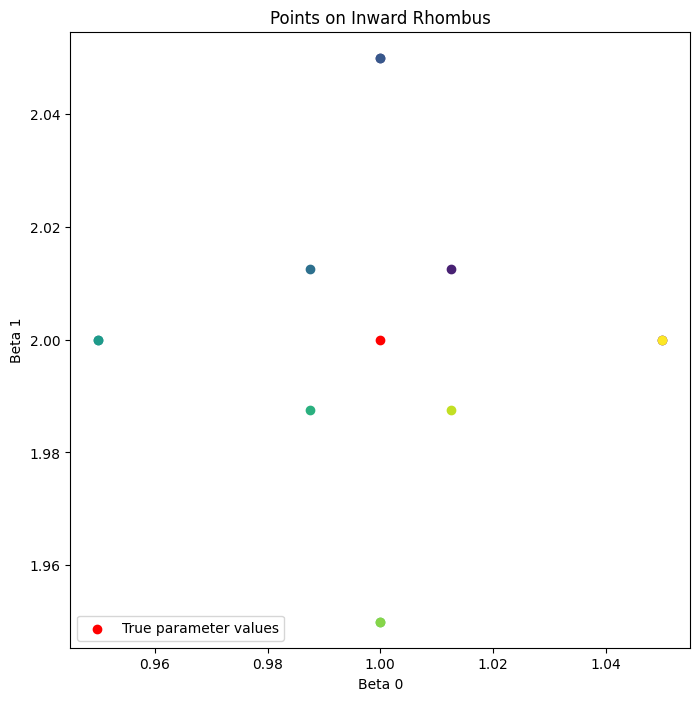

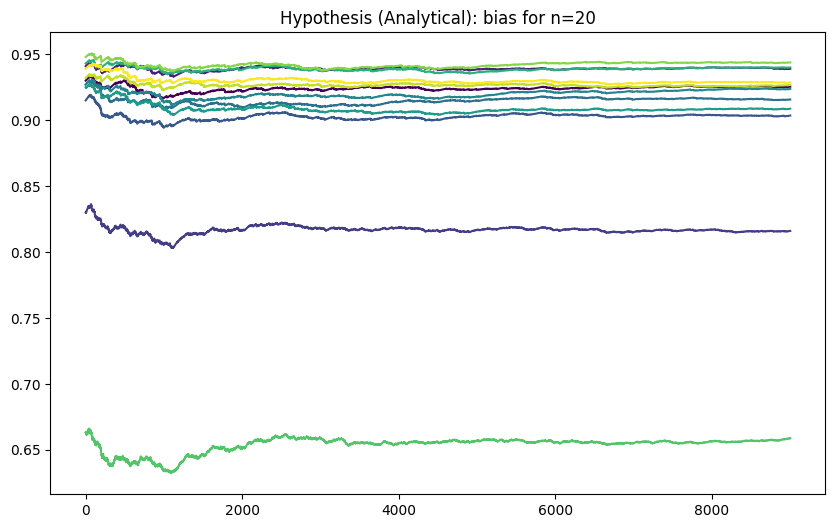

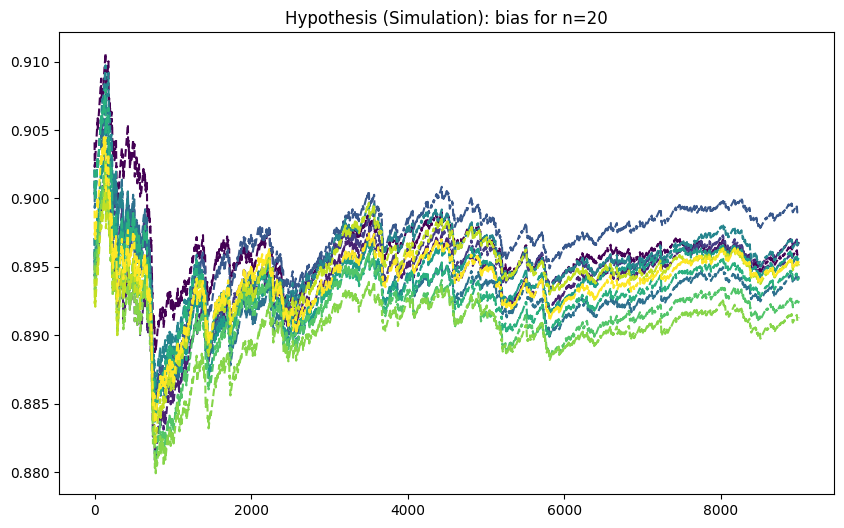

In [ ]:
from matplotlib import cm
def normal_logp_np(x, mu, sigma):
    return -0.5 * ((x - mu) / sigma) ** 2 - np.log(sigma) - 0.5 * np.log(2 * np.pi)
# Convert lists to numpy arrays
posterior_pds = np.array(posterior_pds)
logBR_prior_pds = np.array(logBR_prior_pds)
likelihood_prior_pds = np.array(likelihood_prior_pds)

# Compute biases for all points on the circle
bias_for = []
bias_for_ml = []
burn = 1000
for idx in range(num_points):
    logBR_prior_pd_values = idata.posterior[f'logBR_prior_pdl_{idx}'].values.ravel()
    likelihood_prior_pd_values = idata.posterior[f'likelihood_prior_pdl_{idx}'].values.ravel()

    bias_for_values = logBR_prior_pd_values > 0
    bias_for_mci = bias_for_values.cumsum() / np.arange(1, len(bias_for_values) + 1)

    mu_samples = idata.posterior['mu'][:, :, 0].values.ravel()[:1000]
    y_samples = idata.posterior[f'y_l_{idx}'].values
    marginal_likelihoods = normal_logp_np(y_samples[:, :, :, np.newaxis], mu_samples, 1).sum(axis=2)
    log_marginal_likelihoods = np.log(np.exp(marginal_likelihoods).mean(axis=-1)).ravel()

    bias_for_ml_values = (likelihood_prior_pd_values - log_marginal_likelihoods) >= 0
    bias_for_ml_mci = bias_for_ml_values.cumsum() / np.arange(1, len(bias_for_ml_values) + 1)

    bias_for.append(bias_for_mci)
    bias_for_ml.append(bias_for_ml_mci)

# Generate colors from a colormap
colors = cm.viridis(np.linspace(0, 1, num_points))

# Plotting the color gradient
plt.figure(figsize=(10, 1))
for idx, color in enumerate(colors):
    plt.plot([idx, idx], [0, 1], color=color, linewidth=8)
plt.title("Color Gradient")
plt.yticks([])
plt.show()


# Generate colors from a colormap
colors = cm.viridis(np.linspace(0, 1, num_points))

# Plotting the circle and the true parameter values
plt.figure(figsize=(8, 8))
plt.scatter(beta0[0], beta0[1], color='red', label='True parameter values')


for idx in range(num_points):
    plt.scatter(curved_rhombus_points[idx, 0], curved_rhombus_points[idx, 1], color=colors[idx])

plt.xlabel('Beta 0')
plt.ylabel('Beta 1')
plt.legend(loc=3)
plt.axis('equal')
plt.title('Points on Inward Rhombus')
plt.show()


# Plotting
plt.figure(figsize=(10, 6))
for idx in range(num_points):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    #plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Analytical): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points):
    #plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Simulation): bias for n={}".format(n))
plt.show()

In [ ]:
import numpy as np
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt
import time

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 20  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p))

# Ground truth parameters for generating data
beta0 = np.array([1, 2])
mu0 = np.dot(X, beta0)
delta = 0.05
sigma0 = 1

num_points = len(curved_rhombus_points)

# Vectorized response variable generation
muls = np.dot(X, curved_rhombus_points.T).T  # Shape: (25, n)
yls = muls + np.random.normal(0, sigma0, (num_points, n))  # Shape: (25, n)


posterior_pds = []
logBR_prior_pds = []
likelihood_prior_pds = []

start_time = time.time()

with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    mu = pm.Deterministic("mu", pm.math.dot(X, beta))

    X_transpose = X.T
    Sigma_inv = np.eye(n) / sigma0**2
    Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2

    cov_beta_post = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)
    # Vectorize mean_beta_post calculation
    yls_stack = np.stack(yls)  # Shape: (num_points, n)
    Sigma_inv_dot_yls = np.dot(Sigma_inv, yls_stack.T).T  # Shape: (num_points, n)
    mean_beta_posts = (np.dot(cov_beta_post, np.dot(X_transpose, Sigma_inv_dot_yls.T) + Sigma_beta_inv.dot(np.ones(p) * mu_prior_mean)[:, np.newaxis])).T

    print(mean_beta_posts)
    y_ls = pm.MvNormal('y_l', mu=muls, cov=(sigma0**2) * np.eye(n), shape=(num_points, n))
    posterior_betals = pm.MvNormal('posterior_betal', mu=mean_beta_posts, cov=cov_beta_post, shape = (num_points, p))
    # Iterate over each point on the circle
    for i, betal in enumerate(curved_rhombus_points):
        # Calculate mu for each point on the circle
        y_l = pm.Deterministic(f'y_l_{i}', y_ls[i])
        # Likelihood
        #y_l = pm.MvNormal(f'y_l_{i}', mu=muls[i], cov=(sigma0**2) * np.eye(n), shape=n)
        # Posterior mean and covariance for beta

        # Posterior log-probability
        posterior_pdl = pm.Deterministic(f'posterior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=pm.math.dot(X, posterior_betals[i]), cov=(sigma0**2) * np.eye(n), shape=(n,)), mu0).sum())
        #posterior_pds.append(posterior_pdl)

        # Log BR
        logBR_prior_pdl = pm.Deterministic(f'logBR_prior_pdl_{i}', posterior_pdl - pm.logp(pm.MvNormal.dist(mu=mu_prior_mean, cov=(mu_prior_sigma**2) * np.eye(n), shape=(n,)), pm.math.dot(X, beta)).sum())
        #logBR_prior_pds.append(logBR_prior_pdl)

        # Likelihood
        likelihood_prior_pdl = pm.Deterministic(f'likelihood_prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(sigma**2) * np.eye(n), shape=n), y_l).sum())
        #likelihood_prior_pds.append(likelihood_prior_pdl)

    # Sampling
    idata = pm.sample(draws=5000, tune=1000)

end_time = time.time()

# Calculate elapsed time
elapsed_time = end_time - start_time

print(f"Cell execution time: {elapsed_time:.2f} seconds")


[[0.88112951 2.08667016]
 [1.0365081  1.98693373]
 [1.09989589 1.72520685]
 [0.94425468 1.76780364]
 [1.07136631 1.43330497]
 [1.10417755 1.88773832]
 [1.00384167 1.85716385]
 [1.28692225 1.87405605]
 [0.76576795 1.52359434]
 [0.88191747 1.79695345]
 [0.87612534 1.95428358]
 [0.74826709 1.84865613]]


Cell execution time: 276.89 seconds


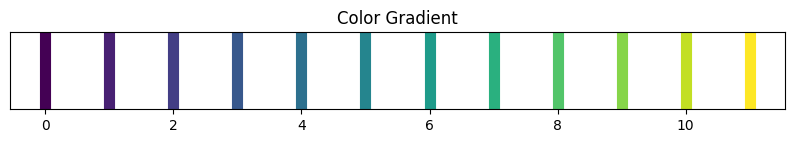

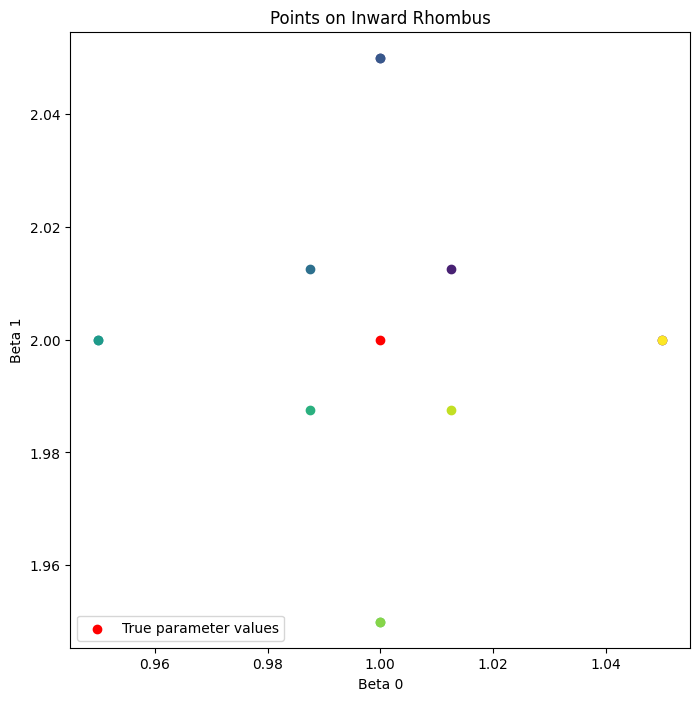

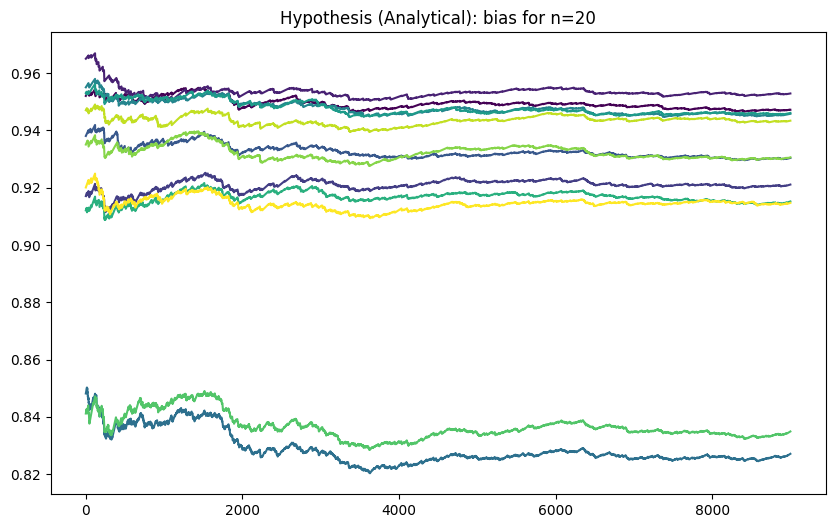

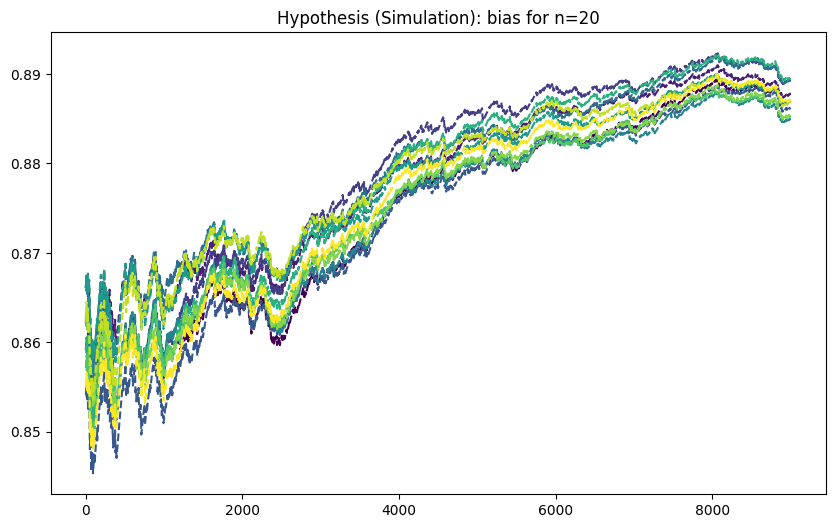

In [ ]:
from matplotlib import cm
def normal_logp_np(x, mu, sigma):
    return -0.5 * ((x - mu) / sigma) ** 2 - np.log(sigma) - 0.5 * np.log(2 * np.pi)
# Convert lists to numpy arrays
#posterior_pds = np.array(posterior_pds)
#logBR_prior_pds = np.array(logBR_prior_pds)
#likelihood_prior_pds = np.array(likelihood_prior_pds)

# Compute biases for all points on the circle
bias_for = []
bias_for_ml = []
burn = 1000
for idx in range(num_points):
    logBR_prior_pd_values = idata.posterior[f'logBR_prior_pdl_{idx}'].values.ravel()
    likelihood_prior_pd_values = idata.posterior[f'likelihood_prior_pdl_{idx}'].values.ravel()

    bias_for_values = logBR_prior_pd_values > 0
    bias_for_mci = bias_for_values.cumsum() / np.arange(1, len(bias_for_values) + 1)

    mu_samples = idata.posterior['mu'][:, :, 0].values.ravel()[:1000]
    y_samples = idata.posterior[f'y_l_{idx}'].values
    marginal_likelihoods = normal_logp_np(y_samples[:, :, :, np.newaxis], mu_samples, 1).sum(axis=2)
    log_marginal_likelihoods = np.log(np.exp(marginal_likelihoods).mean(axis=-1)).ravel()

    bias_for_ml_values = (likelihood_prior_pd_values - log_marginal_likelihoods) >= 0
    bias_for_ml_mci = bias_for_ml_values.cumsum() / np.arange(1, len(bias_for_ml_values) + 1)

    bias_for.append(bias_for_mci)
    bias_for_ml.append(bias_for_ml_mci)

# Generate colors from a colormap
colors = cm.viridis(np.linspace(0, 1, num_points))

# Plotting the color gradient
plt.figure(figsize=(10, 1))
for idx, color in enumerate(colors):
    plt.plot([idx, idx], [0, 1], color=color, linewidth=8)
plt.title("Color Gradient")
plt.yticks([])
plt.show()


# Generate colors from a colormap
colors = cm.viridis(np.linspace(0, 1, num_points))

# Plotting the circle and the true parameter values
plt.figure(figsize=(8, 8))
plt.scatter(beta0[0], beta0[1], color='red', label='True parameter values')


for idx in range(num_points):
    plt.scatter(curved_rhombus_points[idx, 0], curved_rhombus_points[idx, 1], color=colors[idx])

plt.xlabel('Beta 0')
plt.ylabel('Beta 1')
plt.legend(loc=3)
plt.axis('equal')
plt.title('Points on Inward Rhombus')
plt.show()


# Plotting
plt.figure(figsize=(10, 6))
for idx in range(num_points):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    #plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Analytical): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points):
    #plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Simulation): bias for n={}".format(n))
plt.show()

Bit more

In [ ]:
import numpy as np
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt
import time

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 20  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p))

# Ground truth parameters for generating data
beta0 = np.array([1, 2])
mu0 = np.dot(X, beta0)
delta = 0.05
sigma0 = 1

num_points = len(curved_rhombus_points)

# Vectorized response variable generation
muls = np.dot(X, curved_rhombus_points.T).T  # Shape: (25, n)
yls = muls + np.random.normal(0, sigma0, (num_points, n))  # Shape: (25, n)


posterior_pds = []
logBR_prior_pds = []
likelihood_prior_pds = []

start_time = time.time()

with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    mu = pm.Deterministic("mu", pm.math.dot(X, beta))

    X_transpose = X.T
    Sigma_inv = np.eye(n) / sigma0**2
    Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2

    cov_beta_post = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)
    # Vectorize mean_beta_post calculation
    yls_stack = np.stack(yls)  # Shape: (num_points, n)
    Sigma_inv_dot_yls = np.dot(Sigma_inv, yls_stack.T).T  # Shape: (num_points, n)
    mean_beta_posts = (np.dot(cov_beta_post, np.dot(X_transpose, Sigma_inv_dot_yls.T) + Sigma_beta_inv.dot(np.ones(p) * mu_prior_mean)[:, np.newaxis])).T

    print(mean_beta_posts)
    y_ls = pm.MvNormal('y_l', mu=muls, cov=(sigma0**2) * np.eye(n), shape=(num_points, n))
    posterior_betals = pm.MvNormal('posterior_betal', mu=mean_beta_posts, cov=cov_beta_post, shape = (num_points, p))
    # Iterate over each point on the circle
    for i, betal in enumerate(curved_rhombus_points):
        # Calculate mu for each point on the circle
        y_l = pm.Deterministic(f'y_l_{i}', y_ls[i])
        # Likelihood
        #y_l = pm.MvNormal(f'y_l_{i}', mu=muls[i], cov=(sigma0**2) * np.eye(n), shape=n)
        # Posterior mean and covariance for beta

        # Posterior log-probability
        posterior_pdl = pm.Deterministic(f'posterior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=pm.math.dot(X, posterior_betals[i]), cov=(sigma0**2) * np.eye(n), shape=(n,)), mu0))
        #posterior_pds.append(posterior_pdl)

        # Log BR
        logBR_prior_pdl = pm.Deterministic(f'logBR_prior_pdl_{i}', posterior_pdl - pm.logp(pm.MvNormal.dist(mu=mu_prior_mean, cov=(mu_prior_sigma**2) * np.eye(n), shape=(n,)), pm.math.dot(X, beta)).sum())
        #logBR_prior_pds.append(logBR_prior_pdl)

        # Likelihood
        likelihood_prior_pdl = pm.Deterministic(f'likelihood_prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(sigma**2) * np.eye(n), shape=n), y_l).sum())
        #likelihood_prior_pds.append(likelihood_prior_pdl)

    # Sampling
    idata = pm.sample(draws=5000, tune=1000)

end_time = time.time()

# Calculate elapsed time
elapsed_time = end_time - start_time

print(f"Cell execution time: {elapsed_time:.2f} seconds")


[[1.00673743 1.9287017 ]
 [0.65540195 1.81160094]
 [0.85107463 1.86141847]
 [0.82260459 1.86334955]
 [0.76830831 2.11002321]
 [0.31283354 1.97161665]
 [0.88238095 1.73300574]
 [1.17952012 2.18328383]
 [1.03634083 1.99059886]
 [1.01712275 2.12375962]
 [1.11832428 1.93134348]
 [0.69139734 2.03838954]]


Cell execution time: 277.48 seconds


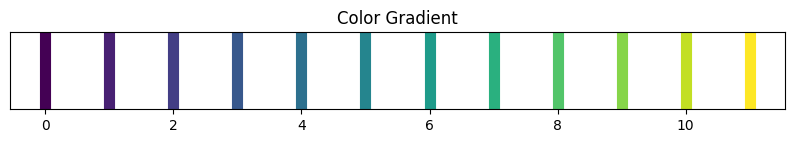

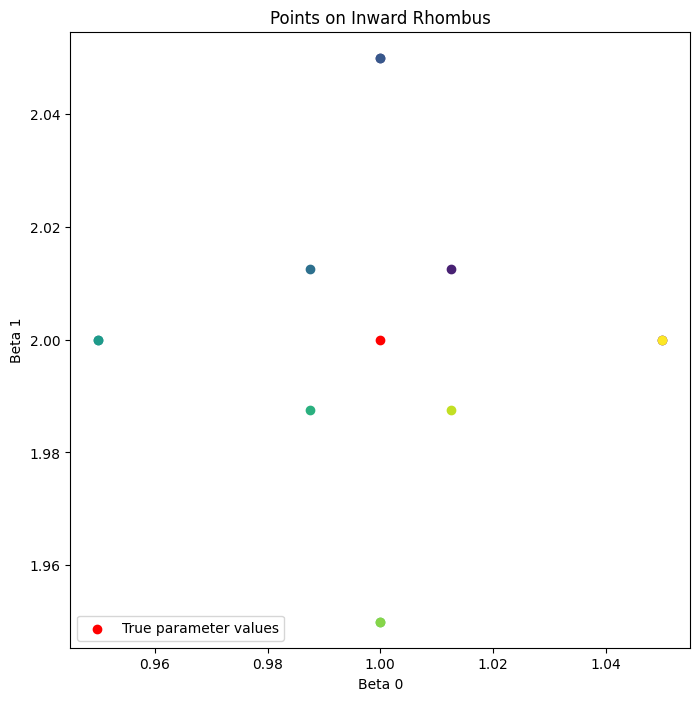

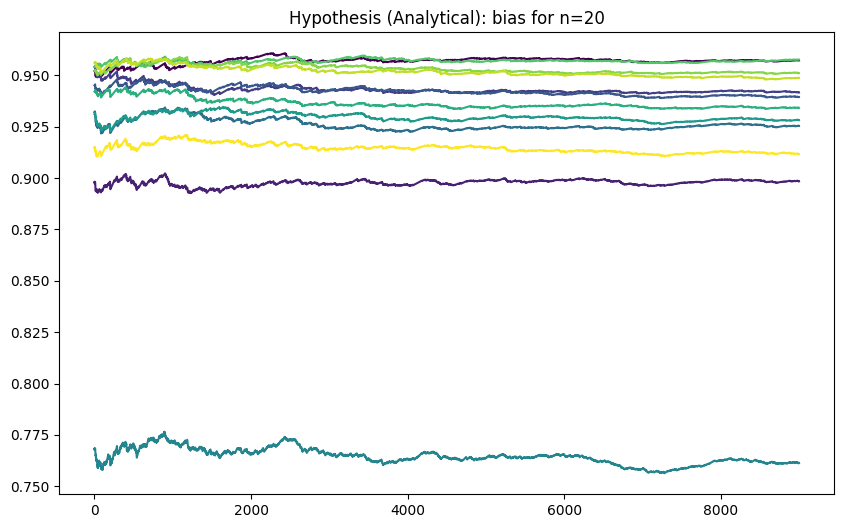

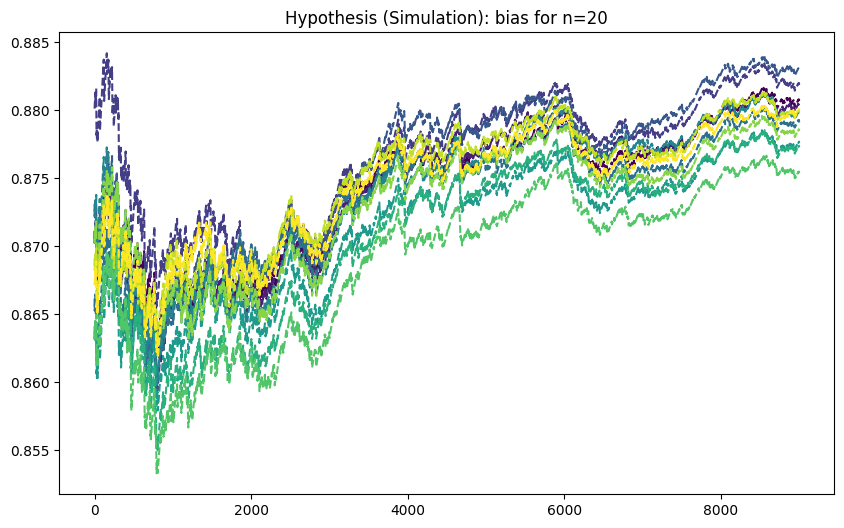

In [ ]:
from matplotlib import cm
def normal_logp_np(x, mu, sigma):
    return -0.5 * ((x - mu) / sigma) ** 2 - np.log(sigma) - 0.5 * np.log(2 * np.pi)
# Convert lists to numpy arrays
#posterior_pds = np.array(posterior_pds)
#logBR_prior_pds = np.array(logBR_prior_pds)
#likelihood_prior_pds = np.array(likelihood_prior_pds)

# Compute biases for all points on the circle
bias_for = []
bias_for_ml = []
burn = 1000
for idx in range(num_points):
    logBR_prior_pd_values = idata.posterior[f'logBR_prior_pdl_{idx}'].values.ravel()
    likelihood_prior_pd_values = idata.posterior[f'likelihood_prior_pdl_{idx}'].values.ravel()

    bias_for_values = logBR_prior_pd_values > 0
    bias_for_mci = bias_for_values.cumsum() / np.arange(1, len(bias_for_values) + 1)

    mu_samples = idata.posterior['mu'][:, :, 0].values.ravel()[:1000]
    y_samples = idata.posterior[f'y_l_{idx}'].values
    marginal_likelihoods = normal_logp_np(y_samples[:, :, :, np.newaxis], mu_samples, 1).sum(axis=2)
    log_marginal_likelihoods = np.log(np.exp(marginal_likelihoods).mean(axis=-1)).ravel()

    bias_for_ml_values = (likelihood_prior_pd_values - log_marginal_likelihoods) >= 0
    bias_for_ml_mci = bias_for_ml_values.cumsum() / np.arange(1, len(bias_for_ml_values) + 1)

    bias_for.append(bias_for_mci)
    bias_for_ml.append(bias_for_ml_mci)

# Generate colors from a colormap
colors = cm.viridis(np.linspace(0, 1, num_points))

# Plotting the color gradient
plt.figure(figsize=(10, 1))
for idx, color in enumerate(colors):
    plt.plot([idx, idx], [0, 1], color=color, linewidth=8)
plt.title("Color Gradient")
plt.yticks([])
plt.show()


# Generate colors from a colormap
colors = cm.viridis(np.linspace(0, 1, num_points))

# Plotting the circle and the true parameter values
plt.figure(figsize=(8, 8))
plt.scatter(beta0[0], beta0[1], color='red', label='True parameter values')


for idx in range(num_points):
    plt.scatter(curved_rhombus_points[idx, 0], curved_rhombus_points[idx, 1], color=colors[idx])

plt.xlabel('Beta 0')
plt.ylabel('Beta 1')
plt.legend(loc=3)
plt.axis('equal')
plt.title('Points on Inward Rhombus')
plt.show()


# Plotting
plt.figure(figsize=(10, 6))
for idx in range(num_points):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    #plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Analytical): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points):
    #plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Simulation): bias for n={}".format(n))
plt.show()

In [ ]:
import numpy as np
import pymc as pm
import arviz as az

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 5  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p))

# Ground truth parameters for generating data
beta0 = np.array([1, 2])
sigma0 = 1
mu0 = np.dot(X, beta0)

# Generate response variable y
y = np.dot(X, beta0) + np.random.normal(0, sigma0, n)
print("y", y)

def normal_logp(x, mu, sigma):
    return -0.5 * np.log(2 * np.pi * sigma**2) - 0.5 * ((x - mu)**2 / sigma**2)

with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    # Likelihood
    mu = pm.Deterministic("mu", pm.math.dot(X, beta))
    y_ = pm.MvNormal('y_', mu=mu, cov= (sigma0**2)*np.eye(n), shape = n)

    # Prior log-probability
    prior_pd = pm.Deterministic("prior_pd", pm.logp(pm.MvNormal.dist(mu=mu_prior_mean, cov=(mu_prior_sigma**2)*np.eye(n), shape=(n,)), mu))

    # Posterior mean and covariance for beta
    X_transpose = X.T
    Sigma_inv = np.eye(n) / sigma0**2
    Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2

    cov_beta_post = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)
    print(cov_beta_post)
    mean_beta_post = np.dot(cov_beta_post, np.dot(X_transpose, np.dot(Sigma_inv, y)) + Sigma_beta_inv.dot(np.ones(p) * mu_prior_mean))
    print(mean_beta_post)

    # Posterior log-probability
    posterior_beta = pm.MvNormal('posterior_beta', mu=mean_beta_post, cov=cov_beta_post)
    posterior_pd = pm.Deterministic("posterior_pd", pm.logp(pm.MvNormal.dist(mu=pm.math.dot(X, posterior_beta), cov=(sigma0**2)*np.eye(n), shape=(n, )), mu))

    # Log BR
    logRB_prior_pd = pm.Deterministic("logRB_prior_pd", posterior_pd - prior_pd)

    # Likelihood
    likelihood_prior_pd = pm.Deterministic("likelihood_prior_pd", pm.logp(pm.MvNormal.dist(mu=mu0, cov=(sigma0**2)*np.eye(n), shape=n), y_).sum())

    # Sampling
    idata = pm.sample(draws=5000, tune=1000)

y [-1.80017885 -0.40492517  2.36415357  1.9685497   0.74971802]
[[0.2011106  0.09683027]
 [0.09683027 0.39573101]]
[0.45247429 1.56068129]


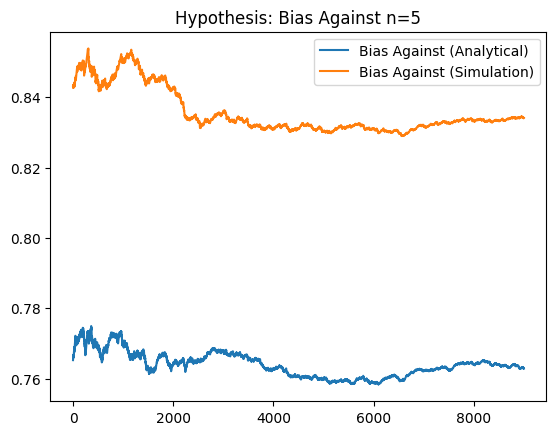

In [ ]:
# Calculate the bias against the prior hypothesis
bias_against = idata.posterior["logRB_prior_pd"].values.ravel() <= 0
t = bias_against.shape[0]
burn = 1000
bias_against_mci = bias_against.cumsum() / np.arange(1, t+1)

# Extract posterior samples for simulation
beta_samples = idata.posterior['mu'][:, :, 0].values.ravel()[:1000]  # Use 1000 samples
x_samples = idata.posterior['y_'].values  # Shape (chains, draws, n)

# Compute log likelihoods for all samples at once
marginal_likelihoods = normal_logp_np(x_samples[:, :, :, np.newaxis], beta_samples, 1).sum(axis=2)

# Average the likelihoods over the samples
log_marginal_likelihoods = np.log(np.exp(marginal_likelihoods).mean(axis=-1)).ravel()

# Compute biases
likelihood_prior_pd = idata.posterior['likelihood_prior_pd'].values.ravel()

bias_against_ml = (likelihood_prior_pd - log_marginal_likelihoods) <= 0

bias_against_ml_mci = bias_against_ml.cumsum() / np.arange(1, len(bias_against_ml) + 1)

plt.plot(bias_against_mci[burn:], label='Bias Against (Analytical)')
plt.plot(bias_against_ml_mci[burn:], label='Bias Against (Simulation)')
plt.title("Hypothesis: Bias Against n={}".format(n))
plt.legend()
plt.show()

In [ ]:
import numpy as np
import pymc as pm
import arviz as az

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 5  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p))

# Ground truth parameters for generating data
beta0 = np.array([1, 2])
sigma0 = 1
mu0 = np.dot(X, beta0)

# Generate response variable y
y = np.dot(X, beta0) + np.random.normal(0, sigma0, n)
print("y", y)

def normal_logp(x, mu, sigma):
    return -0.5 * np.log(2 * np.pi * sigma**2) - 0.5 * ((x - mu)**2 / sigma**2)

with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    # Likelihood
    mu = pm.Deterministic("mu", pm.math.dot(X, beta))
    y_ = pm.MvNormal('y_', mu=mu, cov= (sigma0**2)*np.eye(n), shape = n)

    # Prior log-probability
    prior_pd = pm.Deterministic("prior_pd", pm.logp(pm.MvNormal.dist(mu=mu_prior_mean, cov=(mu_prior_sigma**2)*np.eye(n), shape=(n,)), mu))

    # Posterior mean and covariance for beta
    X_transpose = X.T
    Sigma_inv = np.eye(n) / sigma0**2
    Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2

    cov_beta_post = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)
    print(cov_beta_post)
    mean_beta_post = np.dot(cov_beta_post, np.dot(X_transpose, np.dot(Sigma_inv, y)) + Sigma_beta_inv.dot(np.ones(p) * mu_prior_mean))
    print(mean_beta_post)

    # Posterior log-probability
    posterior_beta = pm.MvNormal('posterior_beta', mu=mean_beta_post, cov=cov_beta_post)
    posterior_pd = pm.Deterministic("posterior_pd", pm.logp(pm.MvNormal.dist(mu=pm.math.dot(X, posterior_beta), cov=(sigma0**2)*np.eye(n), shape=(n, )), mu))

    # Log BR
    logRB_prior_pd = pm.Deterministic("logRB_prior_pd", posterior_pd - prior_pd)

    # Likelihood
    likelihood_prior_pd = pm.Deterministic("likelihood_prior_pd", pm.logp(pm.MvNormal.dist(mu=mu0, cov=(sigma0**2)*np.eye(n), shape=n), y_).sum())

    # Sampling
    idata = pm.sample(draws=5000, tune=1000)

y [-1.15538618 -3.40656092  0.47446759  2.55486908  3.50493884]
[[0.22386213 0.06887285]
 [0.06887285 0.17500856]]
[0.27482254 1.94021363]


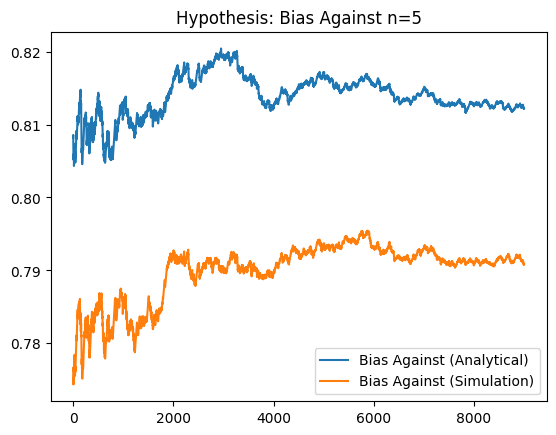

In [ ]:
def normal_logp_np(x, mu, sigma):
    return -0.5 * ((x - mu) / sigma) ** 2 - np.log(sigma) - 0.5 * np.log(2 * np.pi)

# Calculate the bias against the prior hypothesis
bias_against = idata.posterior["logRB_prior_pd"].values.ravel() <= 0
t = bias_against.shape[0]
burn = 1000
bias_against_mci = bias_against.cumsum() / np.arange(1, t+1)

# Extract posterior samples for simulation
beta_samples = idata.posterior['mu'][:, :, 0].values.ravel() # Use 1000 samples
x_samples = idata.posterior['y_'].values  # Shape (chains, draws, n)

# Compute log likelihoods for all samples at once
marginal_likelihoods = normal_logp_np(x_samples[:, :, :, np.newaxis], beta_samples, 1).sum(axis=2)

# Average the likelihoods over the samples
log_marginal_likelihoods = np.log(np.exp(marginal_likelihoods).mean(axis=-1)).ravel()

# Compute biases
likelihood_prior_pd = idata.posterior['likelihood_prior_pd'].values.ravel()

bias_against_ml = (likelihood_prior_pd - log_marginal_likelihoods) <= 0

bias_against_ml_mci = bias_against_ml.cumsum() / np.arange(1, len(bias_against_ml) + 1)

plt.plot(bias_against_mci[burn:], label='Bias Against (Analytical)')
plt.plot(bias_against_ml_mci[burn:], label='Bias Against (Simulation)')
plt.title("Hypothesis: Bias Against n={}".format(n))
plt.legend()
plt.show()

In [28]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.special import binom

# Function to calculate Bezier curve points
def bezier_curve(control_points, num_points=100):
    n = len(control_points) - 1
    curve = np.zeros((num_points, 2))
    t = np.linspace(0, 1, num_points)
    for i in range(n + 1):
        curve += np.outer(binom(n, i) * (t ** i) * ((1 - t) ** (n - i)), control_points[i])
    return curve

# True parameter values
beta0 = np.array([1, 2])
delta = 0.05  # Half-diagonal length of the rhombus

# Define the four vertices of the rhombus
vertices = np.array([
    [beta0[0] + delta, beta0[1]],  # Right vertex
    [beta0[0], beta0[1] + delta],  # Top vertex
    [beta0[0] - delta, beta0[1]],  # Left vertex
    [beta0[0], beta0[1] - delta]   # Bottom vertex
])

# Define control points for inward-curving sides
control_points = []
control_points.append([vertices[0], beta0, vertices[1]])  # Right to Top
control_points.append([vertices[1], beta0, vertices[2]])  # Top to Left
control_points.append([vertices[2], beta0, vertices[3]])  # Left to Bottom
control_points.append([vertices[3], beta0, vertices[0]])  # Bottom to Right

# Generate points on the inward-curving rhombus
num_points_per_curve = 4
curved_points = []
for cp in control_points:
    curve = bezier_curve(cp, num_points_per_curve)
    curved_points.append(curve)

# Concatenate all points
curved_rhombus_points = np.vstack(curved_points)


In [ ]:
import numpy as np
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt
import time

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 20  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p))

# Ground truth parameters for generating data
beta0 = np.array([1, 2])
mu0 = np.dot(X, beta0)
delta = 0.05
sigma0 = 1

num_points = len(curved_rhombus_points)

# Vectorized response variable generation
muls = np.dot(X, curved_rhombus_points.T).T  # Shape: (25, n)
yls = muls + np.random.normal(0, sigma0, (num_points, n))  # Shape: (25, n)

posterior_pds = []
logBR_prior_pds = []
likelihood_prior_pds = []

start_time = time.time()

with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    mu = pm.Deterministic("mu", pm.math.dot(X, beta))

    X_transpose = X.T
    Sigma_inv = np.eye(n) / sigma0**2
    Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2

    cov_beta_post = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)

    # Iterate over each point on the circle
    for i, betal in enumerate(curved_rhombus_points):
        # Calculate mu for each point on the circle

        # Likelihood
        y_l = pm.MvNormal(f'y_l_{i}', mu=muls[i], cov=(sigma0**2) * np.eye(n), shape=n)
        # Posterior mean and covariance for beta
        mean_beta_post = np.dot(cov_beta_post, np.dot(X_transpose, np.dot(Sigma_inv, yls[i])) + Sigma_beta_inv.dot(np.ones(p) * mu_prior_mean))

        prior_pdl = pm.Deterministic(f'prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mu_prior_mean, cov=(mu_prior_sigma**2) * np.eye(n), shape=(n,)), mu0))


        # Posterior log-probability
        posterior_betal = pm.MvNormal(f'posterior_betal_{i}', mu=mean_beta_post, cov=cov_beta_post)
        posterior_pdl = pm.Deterministic(f'posterior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=pm.math.dot(X, posterior_betal), cov=(sigma0**2) * np.eye(n), shape=(n,)), mu0))
        posterior_pds.append(posterior_pdl)

        # Log BR
        logBR_prior_pdl = pm.Deterministic(f'logBR_prior_pdl_{i}', posterior_pdl - prior_pdl)
        logBR_prior_pds.append(logBR_prior_pdl)

        # Likelihood
        likelihood_prior_pdl = pm.Deterministic(f'likelihood_prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(sigma0**2) * np.eye(n), shape=n), mu).sum())
        likelihood_prior_pds.append(likelihood_prior_pdl)

    # Sampling
    idata = pm.sample(draws=5000, tune=1000)

end_time = time.time()

# Calculate elapsed time
elapsed_time = end_time - start_time

print(f"Cell execution time: {elapsed_time:.2f} seconds")


Cell execution time: 683.81 seconds


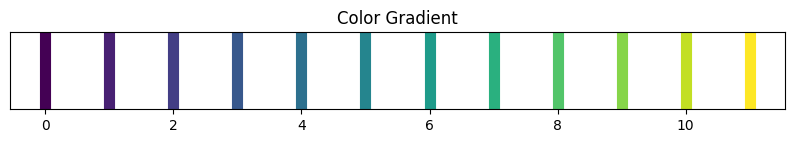

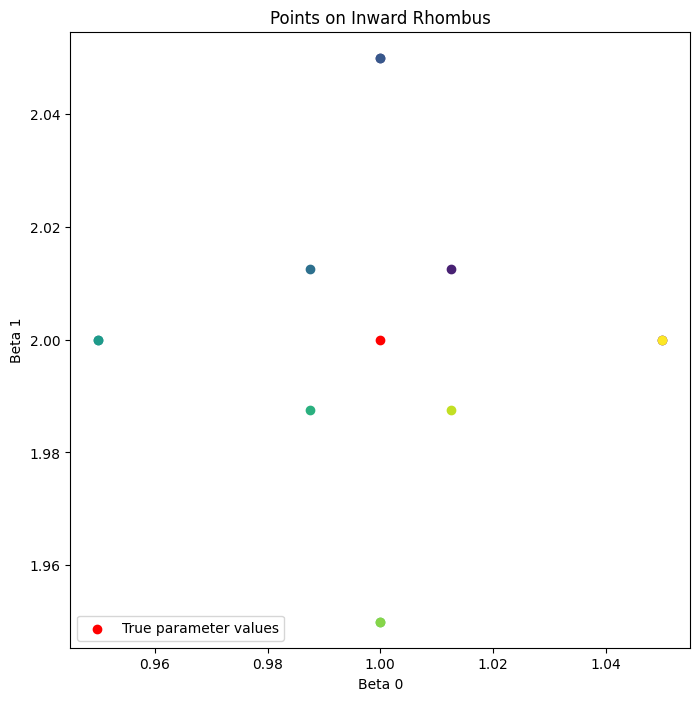

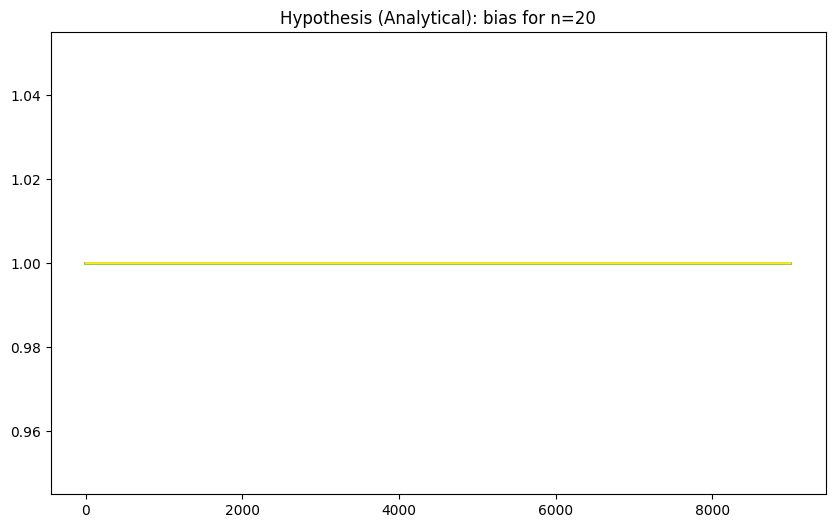

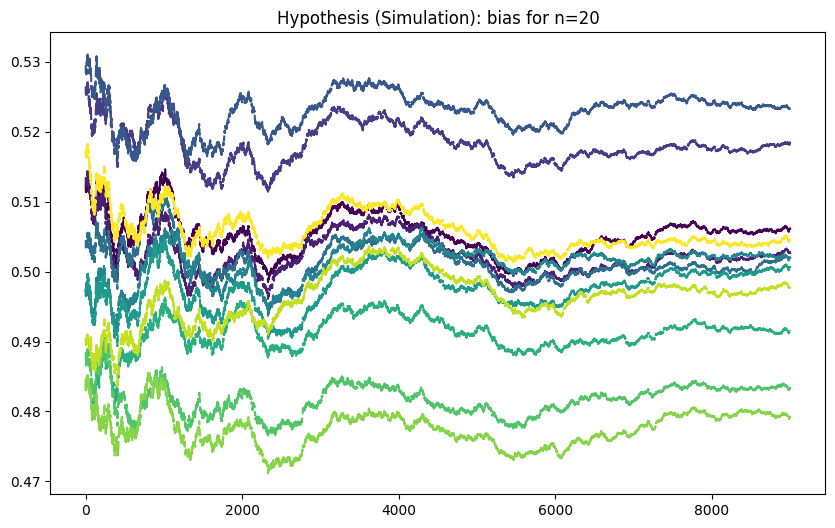

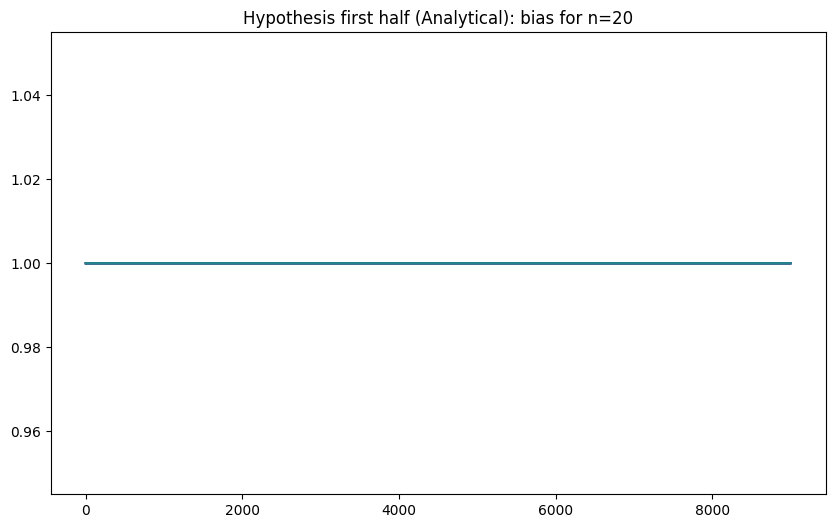

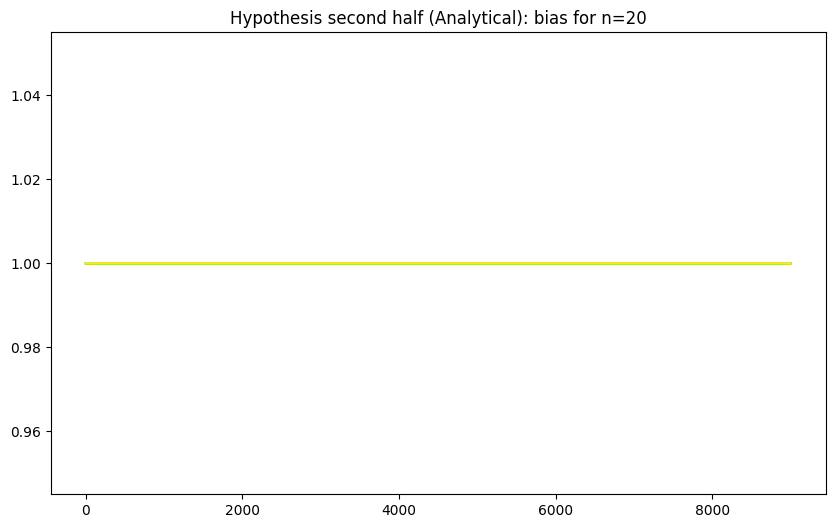

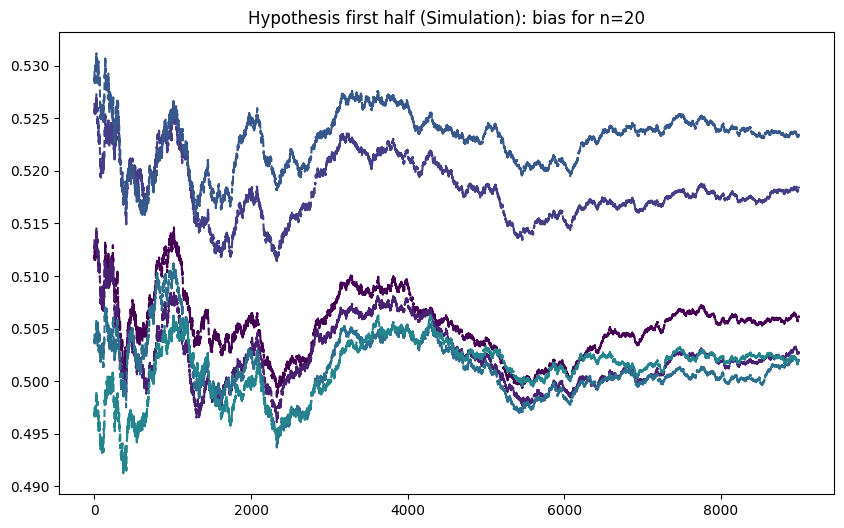

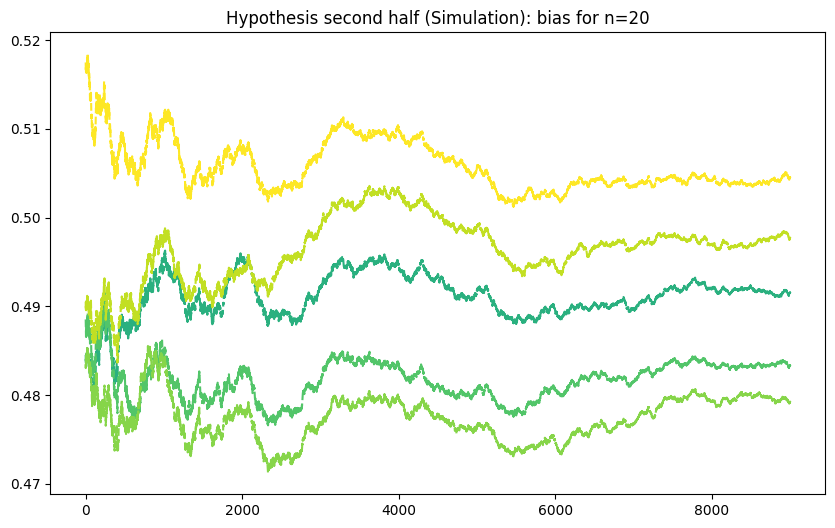

In [ ]:
from matplotlib import cm
def normal_logp_np(x, mu, sigma):
    return -0.5 * ((x - mu) / sigma) ** 2 - np.log(sigma) - 0.5 * np.log(2 * np.pi)
# Convert lists to numpy arrays
posterior_pds = np.array(posterior_pds)
logBR_prior_pds = np.array(logBR_prior_pds)
likelihood_prior_pds = np.array(likelihood_prior_pds)

# Compute biases for all points on the circle
bias_for = []
bias_for_ml = []
burn = 1000
for idx in range(num_points):
    logBR_prior_pd_values = idata.posterior[f'logBR_prior_pdl_{idx}'].values.ravel()
    likelihood_prior_pd_values = idata.posterior[f'likelihood_prior_pdl_{idx}'].values.ravel()

    bias_for_values = logBR_prior_pd_values > 0
    bias_for_mci = bias_for_values.cumsum() / np.arange(1, len(bias_for_values) + 1)

    mu_samples = idata.posterior['mu'][:, :, 0].values.ravel()[:1000]
    y_samples = idata.posterior[f'y_l_{idx}'].values
    marginal_likelihoods = normal_logp_np(y_samples[:, :, :, np.newaxis], mu_samples, 1).sum(axis=2)
    log_marginal_likelihoods = np.log(np.exp(marginal_likelihoods).mean(axis=-1)).ravel()

    bias_for_ml_values = (likelihood_prior_pd_values - log_marginal_likelihoods) >= 0
    bias_for_ml_mci = bias_for_ml_values.cumsum() / np.arange(1, len(bias_for_ml_values) + 1)

    bias_for.append(bias_for_mci)
    bias_for_ml.append(bias_for_ml_mci)

# Generate colors from a colormap
colors = cm.viridis(np.linspace(0, 1, num_points))

# Plotting the color gradient
plt.figure(figsize=(10, 1))
for idx, color in enumerate(colors):
    plt.plot([idx, idx], [0, 1], color=color, linewidth=8)
plt.title("Color Gradient")
plt.yticks([])
plt.show()


# Generate colors from a colormap
colors = cm.viridis(np.linspace(0, 1, num_points))

# Plotting the circle and the true parameter values
plt.figure(figsize=(8, 8))
plt.scatter(beta0[0], beta0[1], color='red', label='True parameter values')


for idx in range(num_points):
    plt.scatter(curved_rhombus_points[idx, 0], curved_rhombus_points[idx, 1], color=colors[idx])

plt.xlabel('Beta 0')
plt.ylabel('Beta 1')
plt.legend(loc=3)
plt.axis('equal')
plt.title('Points on Inward Rhombus')
plt.show()


# Plotting
plt.figure(figsize=(10, 6))
for idx in range(num_points):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    #plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Analytical): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points):
    #plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Simulation): bias for n={}".format(n))
plt.show()


# Plotting
plt.figure(figsize=(10, 6))
for idx in range(num_points//2):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    #plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis first half (Analytical): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points//2 + 1, num_points):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])


plt.title("Hypothesis second half (Analytical): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points//2):
    #plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis first half (Simulation): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points//2 + 1, num_points):
    #plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis second half (Simulation): bias for n={}".format(n))
plt.show()

In [ ]:
import numpy as np
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt
import time

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 20  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p))

# Ground truth parameters for generating data
beta0 = np.array([1, 2])
mu0 = np.dot(X, beta0)
delta = 0.05
sigma0 = 1

num_points = len(curved_rhombus_points)

# Vectorized response variable generation
muls = np.dot(X, curved_rhombus_points.T).T  # Shape: (25, n)
yls = muls + np.random.normal(0, sigma0, (num_points, n))  # Shape: (25, n)

posterior_pds = []
logBR_prior_pds = []
likelihood_prior_pds = []

start_time = time.time()

with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    mu = pm.Deterministic("mu", pm.math.dot(X, beta))

    X_transpose = X.T
    Sigma_inv = np.eye(n) / sigma0**2
    Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2

    cov_beta_post = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)

    # Iterate over each point on the circle
    for i, betal in enumerate(curved_rhombus_points):
        # Calculate mu for each point on the circle

        # Likelihood
        y_l = pm.MvNormal(f'y_l_{i}', mu=muls[i], cov=(sigma0**2) * np.eye(n), shape=n)
        # Posterior mean and covariance for beta
        mean_beta_post = np.dot(cov_beta_post, np.dot(X_transpose, np.dot(Sigma_inv, yls[i])) + Sigma_beta_inv.dot(np.ones(p) * mu_prior_mean))

        prior_pdl = pm.Deterministic(f'prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mu_prior_mean, cov=(mu_prior_sigma**2) * np.eye(n), shape=(n,)), yls[i]))

        # Posterior log-probability
        posterior_betal = pm.MvNormal(f'posterior_betal_{i}', mu=mean_beta_post, cov=cov_beta_post)
        posterior_pdl = pm.Deterministic(f'posterior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=pm.math.dot(X, posterior_betal), cov=(sigma0**2) * np.eye(n), shape=(n,)), yls[i]))
        posterior_pds.append(posterior_pdl)

        # Log BR
        logBR_prior_pdl = pm.Deterministic(f'logBR_prior_pdl_{i}', posterior_pdl - pm.logp(pm.MvNormal.dist(mu=mu_prior_mean, cov=(mu_prior_sigma**2) * np.eye(n), shape=(n,)), pm.math.dot(X, beta)))
        logBR_prior_pds.append(logBR_prior_pdl)

        # Likelihood
        likelihood_prior_pdl = pm.Deterministic(f'likelihood_prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(sigma**2) * np.eye(n), shape=n), y_l).sum())
        likelihood_prior_pds.append(likelihood_prior_pdl)

    # Sampling
    idata = pm.sample(draws=5000, tune=1000)

end_time = time.time()

# Calculate elapsed time
elapsed_time = end_time - start_time

print(f"Cell execution time: {elapsed_time:.2f} seconds")


Cell execution time: 717.87 seconds


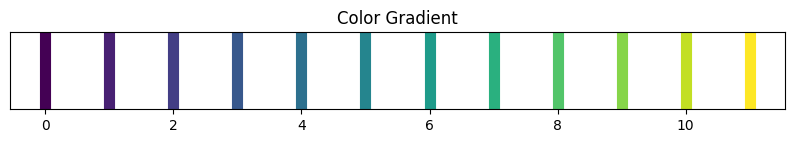

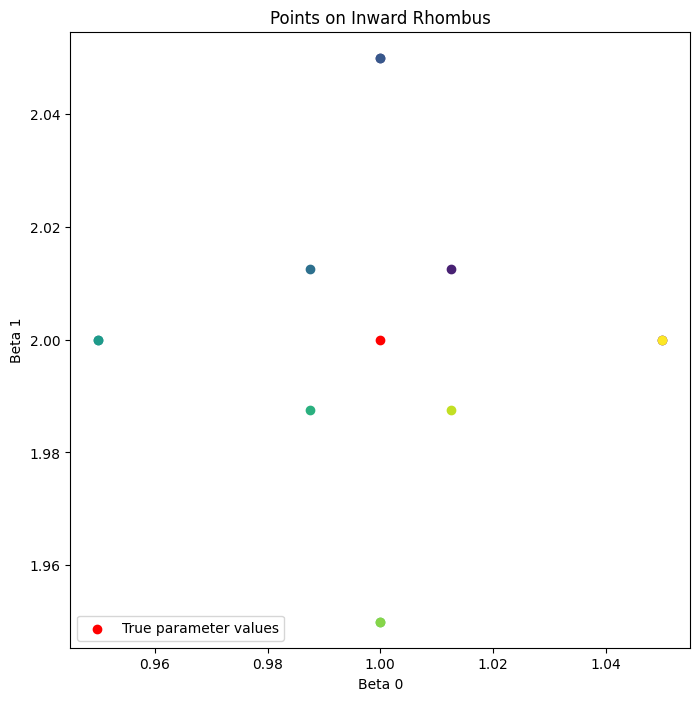

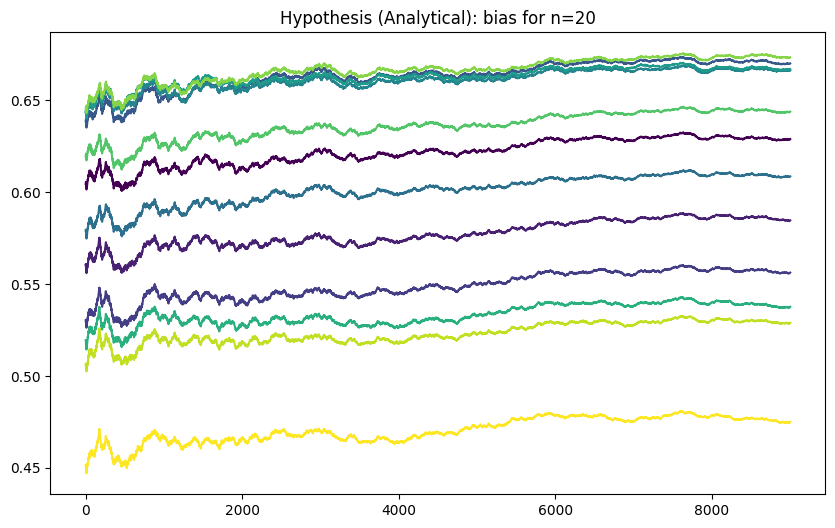

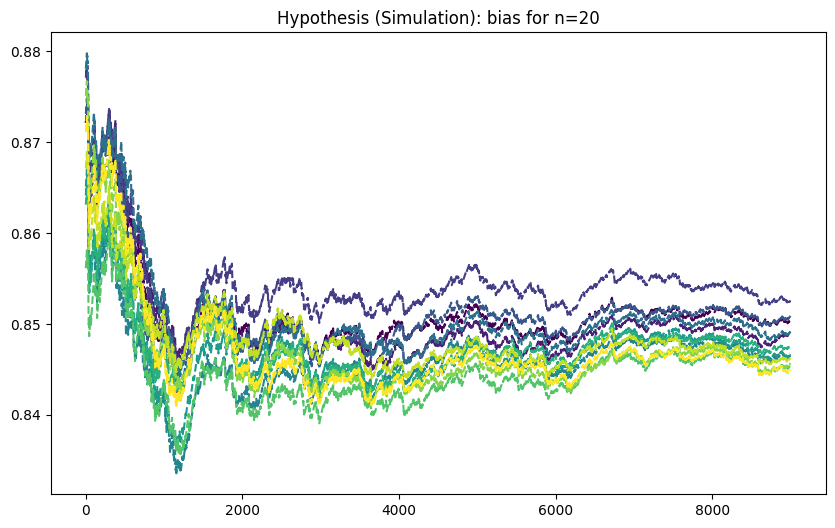

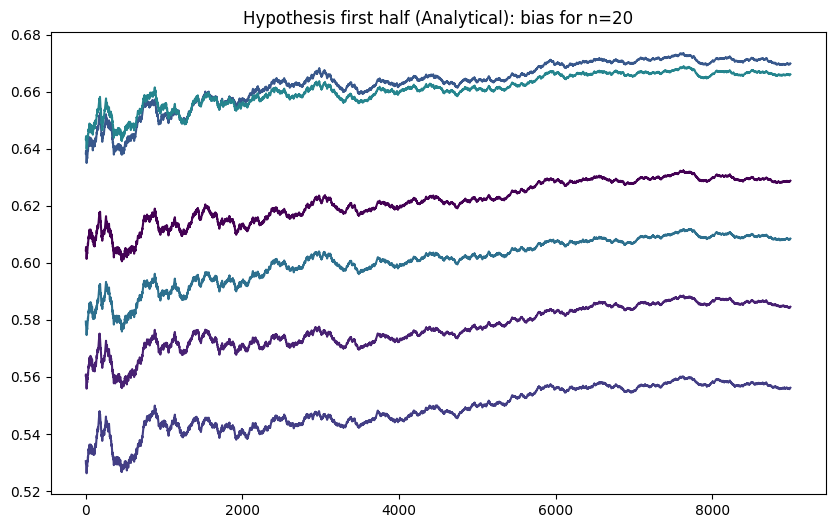

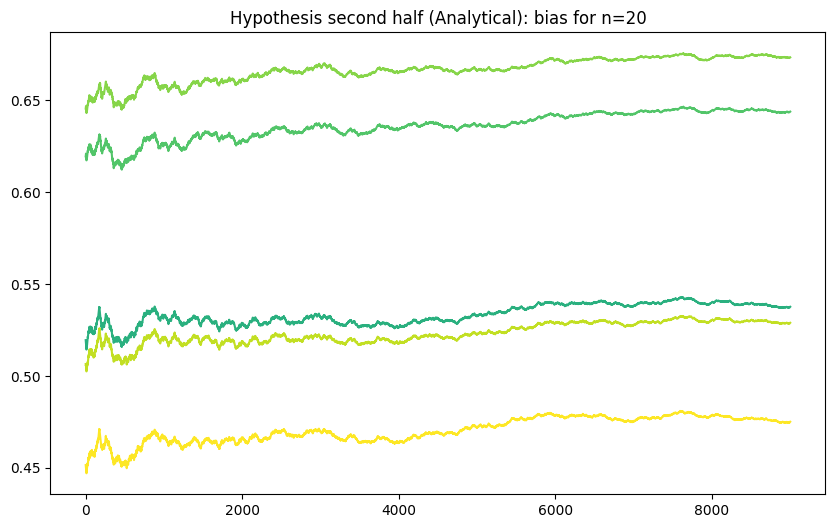

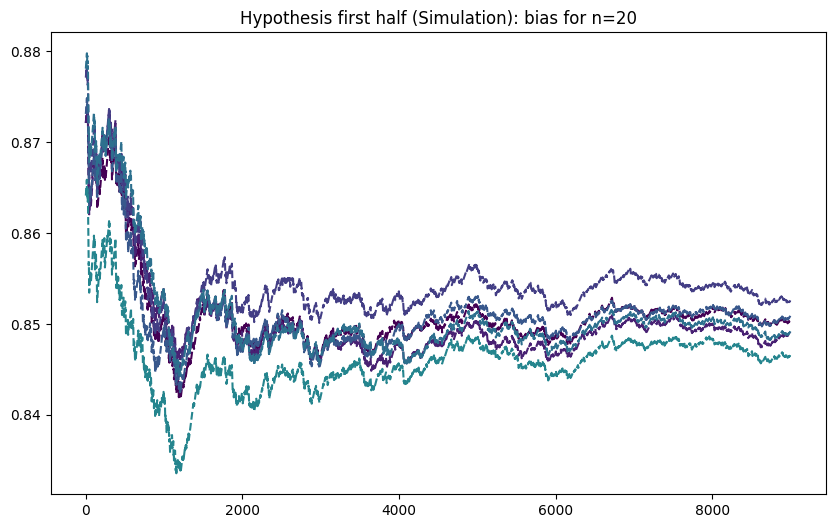

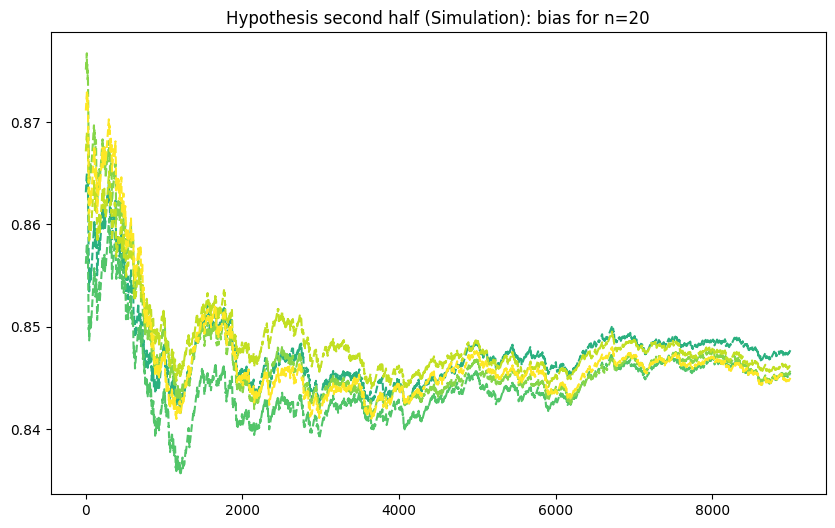

In [ ]:
from matplotlib import cm
def normal_logp_np(x, mu, sigma):
    return -0.5 * ((x - mu) / sigma) ** 2 - np.log(sigma) - 0.5 * np.log(2 * np.pi)
# Convert lists to numpy arrays
posterior_pds = np.array(posterior_pds)
logBR_prior_pds = np.array(logBR_prior_pds)
likelihood_prior_pds = np.array(likelihood_prior_pds)

# Compute biases for all points on the circle
bias_for = []
bias_for_ml = []
burn = 1000
for idx in range(num_points):
    logBR_prior_pd_values = idata.posterior[f'logBR_prior_pdl_{idx}'].values.ravel()
    likelihood_prior_pd_values = idata.posterior[f'likelihood_prior_pdl_{idx}'].values.ravel()

    bias_for_values = logBR_prior_pd_values > 0
    bias_for_mci = bias_for_values.cumsum() / np.arange(1, len(bias_for_values) + 1)

    mu_samples = idata.posterior['mu'][:, :, 0].values.ravel()[:1000]
    y_samples = idata.posterior[f'y_l_{idx}'].values
    marginal_likelihoods = normal_logp_np(y_samples[:, :, :, np.newaxis], mu_samples, 1).sum(axis=2)
    log_marginal_likelihoods = np.log(np.exp(marginal_likelihoods).mean(axis=-1)).ravel()

    bias_for_ml_values = (likelihood_prior_pd_values - log_marginal_likelihoods) >= 0
    bias_for_ml_mci = bias_for_ml_values.cumsum() / np.arange(1, len(bias_for_ml_values) + 1)

    bias_for.append(bias_for_mci)
    bias_for_ml.append(bias_for_ml_mci)

# Generate colors from a colormap
colors = cm.viridis(np.linspace(0, 1, num_points))

# Plotting the color gradient
plt.figure(figsize=(10, 1))
for idx, color in enumerate(colors):
    plt.plot([idx, idx], [0, 1], color=color, linewidth=8)
plt.title("Color Gradient")
plt.yticks([])
plt.show()


# Generate colors from a colormap
colors = cm.viridis(np.linspace(0, 1, num_points))

# Plotting the circle and the true parameter values
plt.figure(figsize=(8, 8))
plt.scatter(beta0[0], beta0[1], color='red', label='True parameter values')


for idx in range(num_points):
    plt.scatter(curved_rhombus_points[idx, 0], curved_rhombus_points[idx, 1], color=colors[idx])

plt.xlabel('Beta 0')
plt.ylabel('Beta 1')
plt.legend(loc=3)
plt.axis('equal')
plt.title('Points on Inward Rhombus')
plt.show()


# Plotting
plt.figure(figsize=(10, 6))
for idx in range(num_points):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    #plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Analytical): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points):
    #plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Simulation): bias for n={}".format(n))
plt.show()


# Plotting
plt.figure(figsize=(10, 6))
for idx in range(num_points//2):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    #plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis first half (Analytical): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points//2 + 1, num_points):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])


plt.title("Hypothesis second half (Analytical): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points//2):
    #plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis first half (Simulation): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points//2 + 1, num_points):
    #plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis second half (Simulation): bias for n={}".format(n))
plt.show()

In [ ]:
import numpy as np
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt
import time

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 20  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p))

# Ground truth parameters for generating data
beta0 = np.array([1, 2])
mu0 = np.dot(X, beta0)
delta = 0.05
sigma0 = 1

num_points = len(curved_rhombus_points)

# Vectorized response variable generation
muls = np.dot(X, curved_rhombus_points.T).T  # Shape: (25, n)
yls = muls + np.random.normal(0, sigma0, (num_points, n))  # Shape: (25, n)

start_time = time.time()

with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    mu = pm.Deterministic("mu", pm.math.dot(X, beta))

    X_transpose = X.T
    Sigma_inv = np.eye(n) / sigma0**2
    Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2

    cov_beta_post = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)

    # Iterate over each point on the circle
    for i, betal in enumerate(curved_rhombus_points):
        # Calculate mu for each point on the circle

        # Likelihood
        y_l = pm.MvNormal(f'y_l_{i}', mu=muls[i], cov=(sigma0**2) * np.eye(n), shape=n)
        # Posterior mean and covariance for beta
        prior_pdl = pm.Deterministic(f'prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu = beta0, cov = (mu_prior_sigma**2) * np.eye(p), shape = p), beta))

        #prior_pdl = pm.Deterministic(f'prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(mu_prior_sigma**2) * np.eye(n), shape=(n,)), yls[i]))


        mean_beta_post = np.dot(cov_beta_post, np.dot(X_transpose, np.dot(Sigma_inv, yls[i])) + Sigma_beta_inv.dot(np.ones(p) * mu_prior_mean))
        # Posterior log-probability
        posterior_pdl = pm.Deterministic(f'posterior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mean_beta_post, cov=cov_beta_post, shape = p), beta))

        #posterior_pdl = pm.Deterministic(f'posterior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=pm.math.dot(X, posterior_betal), cov=(sigma0**2) * np.eye(n), shape=(n,)), mu0))

        # Log BR
        logBR_prior_pdl = pm.Deterministic(f'logBR_prior_pdl_{i}', posterior_pdl - prior_pdl)

        # Likelihood
        likelihood_prior_pdl = pm.Deterministic(f'likelihood_prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(sigma**2) * np.eye(n), shape=n), y_l).sum())

    # Sampling
    idata = pm.sample(draws=5000, tune=1000)

end_time = time.time()

# Calculate elapsed time
elapsed_time = end_time - start_time

print(f"Cell execution time: {elapsed_time:.2f} seconds")


Cell execution time: 393.72 seconds


[ -26.68032847 -213.52437619  -68.98334314 ...  -60.89056428  -88.89508842
  -31.08655948]
[ -3.72401522 -10.96260215  -6.30135067 ...  -4.62565113  -5.72554396
  -3.27564662]
[ -30.40434369 -224.48697834  -75.28469381 ...  -65.51621541  -94.62063238
  -34.3622061 ]


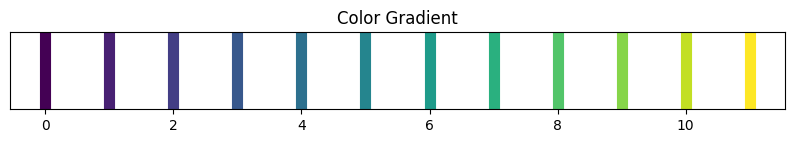

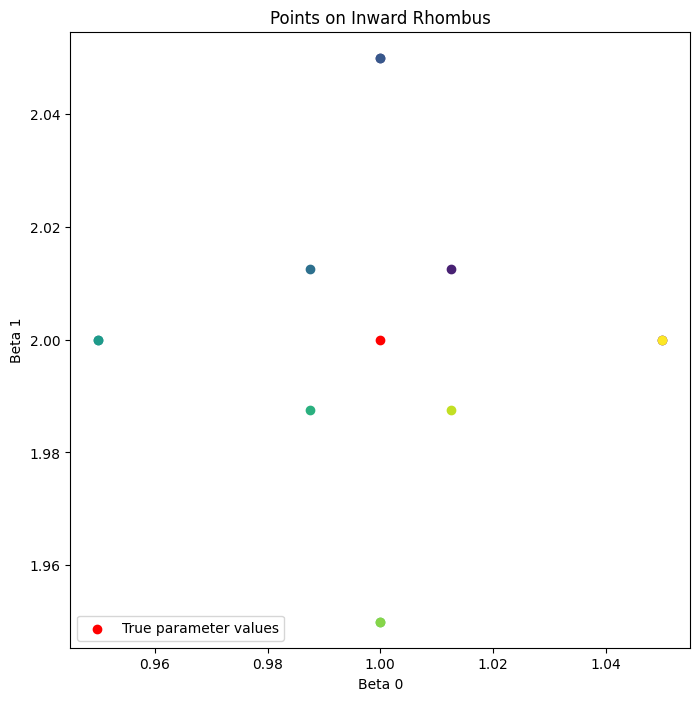

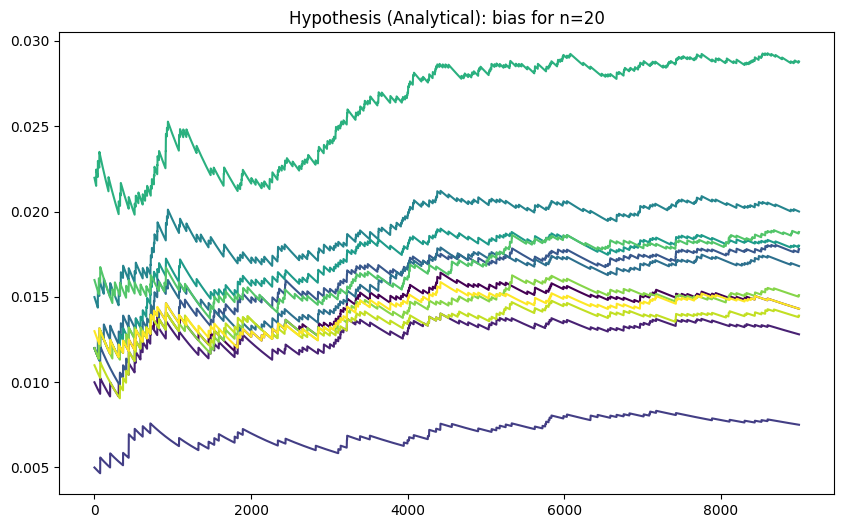

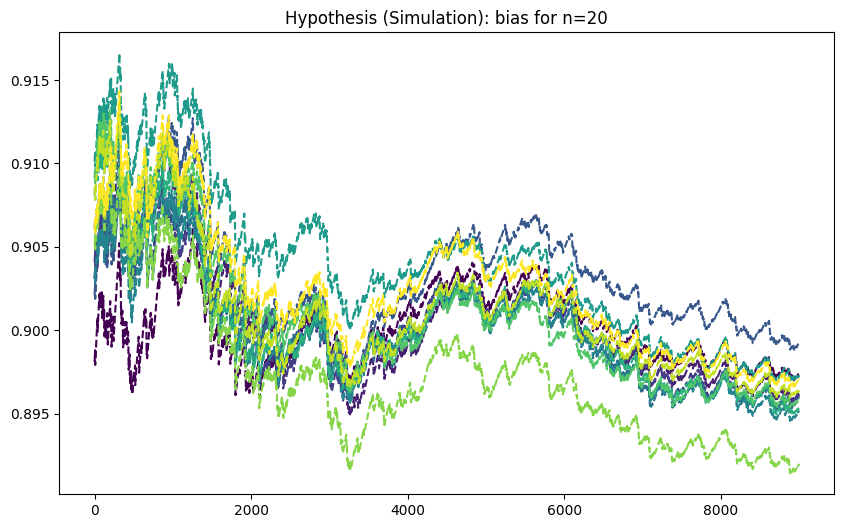

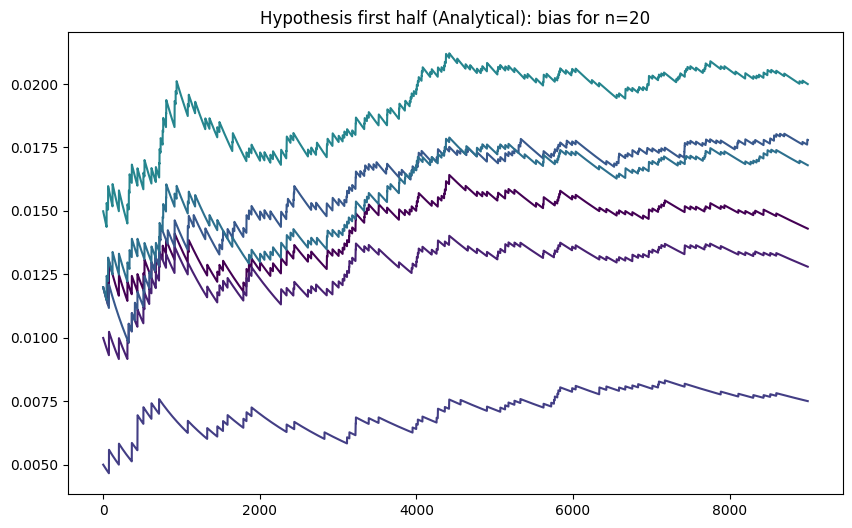

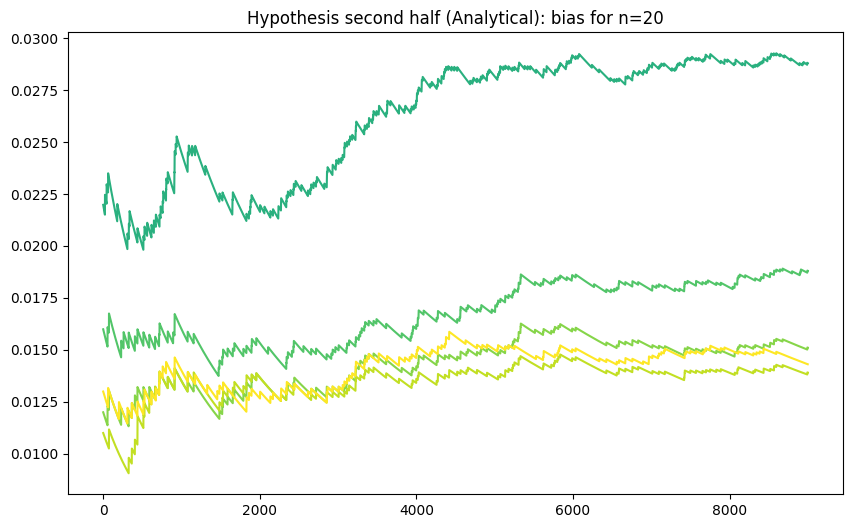

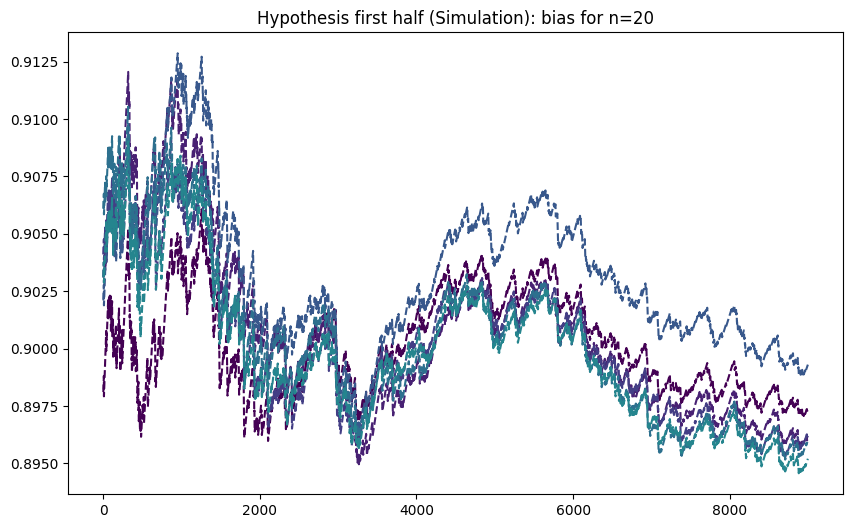

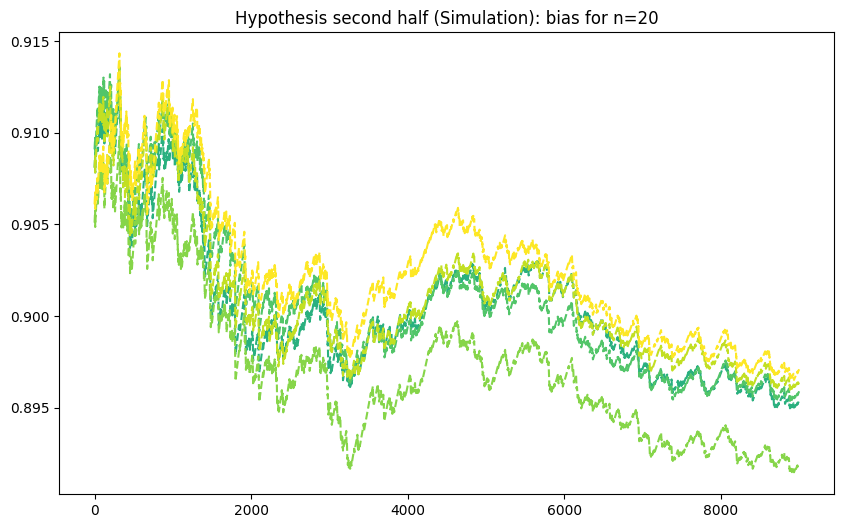

In [ ]:
from matplotlib import cm
def normal_logp_np(x, mu, sigma):
    return -0.5 * ((x - mu) / sigma) ** 2 - np.log(sigma) - 0.5 * np.log(2 * np.pi)




# Compute biases for all points on the circle
bias_for = []
bias_for_ml = []
burn = 1000
for idx in range(num_points):
    if idx == 0:
        print(idata.posterior[f'logBR_prior_pdl_{idx}'].values.ravel())
        print(idata.posterior[f'prior_pdl_{idx}'].values.ravel())
        print(idata.posterior[f'posterior_pdl_{idx}'].values.ravel())

    logBR_prior_pd_values = idata.posterior[f'logBR_prior_pdl_{idx}'].values.ravel()
    likelihood_prior_pd_values = idata.posterior[f'likelihood_prior_pdl_{idx}'].values.ravel()

    bias_for_values = logBR_prior_pd_values > 0
    bias_for_mci = bias_for_values.cumsum() / np.arange(1, len(bias_for_values) + 1)

    mu_samples = idata.posterior['mu'][:, :, 0].values.ravel()[:1000]
    y_samples = idata.posterior[f'y_l_{idx}'].values
    marginal_likelihoods = normal_logp_np(y_samples[:, :, :, np.newaxis], mu_samples, 1).sum(axis=2)
    log_marginal_likelihoods = np.log(np.exp(marginal_likelihoods).mean(axis=-1)).ravel()

    bias_for_ml_values = (likelihood_prior_pd_values - log_marginal_likelihoods) >= 0
    bias_for_ml_mci = bias_for_ml_values.cumsum() / np.arange(1, len(bias_for_ml_values) + 1)

    bias_for.append(bias_for_mci)
    bias_for_ml.append(bias_for_ml_mci)

# Generate colors from a colormap
colors = cm.viridis(np.linspace(0, 1, num_points))

# Plotting the color gradient
plt.figure(figsize=(10, 1))
for idx, color in enumerate(colors):
    plt.plot([idx, idx], [0, 1], color=color, linewidth=8)
plt.title("Color Gradient")
plt.yticks([])
plt.show()


# Generate colors from a colormap
colors = cm.viridis(np.linspace(0, 1, num_points))

# Plotting the circle and the true parameter values
plt.figure(figsize=(8, 8))
plt.scatter(beta0[0], beta0[1], color='red', label='True parameter values')


for idx in range(num_points):
    plt.scatter(curved_rhombus_points[idx, 0], curved_rhombus_points[idx, 1], color=colors[idx])

plt.xlabel('Beta 0')
plt.ylabel('Beta 1')
plt.legend(loc=3)
plt.axis('equal')
plt.title('Points on Inward Rhombus')
plt.show()


# Plotting
plt.figure(figsize=(10, 6))
for idx in range(num_points):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    #plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Analytical): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points):
    #plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Simulation): bias for n={}".format(n))
plt.show()


# Plotting
plt.figure(figsize=(10, 6))
for idx in range(num_points//2):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    #plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis first half (Analytical): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points//2 + 1, num_points):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])


plt.title("Hypothesis second half (Analytical): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points//2):
    #plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis first half (Simulation): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points//2 + 1, num_points):
    #plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis second half (Simulation): bias for n={}".format(n))
plt.show()

In [16]:
import numpy as np
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt
import time

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 20  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p))

# Ground truth parameters for generating data
beta0 = np.array([1, 2])
mu0 = np.dot(X, beta0)
delta = 0.05
sigma0 = 1

num_points = len(curved_rhombus_points)

# Vectorized response variable generation
muls = np.dot(X, curved_rhombus_points.T).T  # Shape: (25, n)
yls = muls + np.random.normal(0, sigma0, (num_points, n))  # Shape: (25, n)

start_time = time.time()

with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    mu = pm.Deterministic("mu", pm.math.dot(X, beta))

    X_transpose = X.T
    Sigma_inv = np.eye(n) / sigma0**2
    Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2

    cov_beta_post = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)

    # Iterate over each point on the circle
    for i, betal in enumerate(curved_rhombus_points):
        # Calculate mu for each point on the circle

        # Likelihood
        y_l = pm.MvNormal(f'y_l_{i}', mu=muls[i], cov=(sigma0**2) * np.eye(n), shape=n)
        # Posterior mean and covariance for beta
        prior_pdl = pm.Deterministic(f'prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu = beta0, cov = (mu_prior_sigma**2) * np.eye(p), shape = p), beta0))

        #prior_pdl = pm.Deterministic(f'prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(mu_prior_sigma**2) * np.eye(n), shape=(n,)), yls[i]))


        mean_beta_post = np.dot(cov_beta_post, np.dot(X_transpose, np.dot(Sigma_inv, yls[i])) + Sigma_beta_inv.dot(np.ones(p) * mu_prior_mean))
        # Posterior log-probability
        posterior_pdl = pm.Deterministic(f'posterior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mean_beta_post, cov=cov_beta_post, shape = p), beta))

        #posterior_pdl = pm.Deterministic(f'posterior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=pm.math.dot(X, posterior_betal), cov=(sigma0**2) * np.eye(n), shape=(n,)), mu0))

        # Log BR
        logBR_prior_pdl = pm.Deterministic(f'logBR_prior_pdl_{i}', posterior_pdl - prior_pdl)

        # Likelihood
        likelihood_prior_pdl = pm.Deterministic(f'likelihood_prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(sigma**2) * np.eye(n), shape=n), y_l).sum())

    # Sampling
    idata = pm.sample(draws=5000, tune=1000)

end_time = time.time()

# Calculate elapsed time
elapsed_time = end_time - start_time

print(f"Cell execution time: {elapsed_time:.2f} seconds")


Cell execution time: 532.92 seconds


In [17]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
import arviz as az

# Define a function for normal log probability
def normal_logp_np(x, mu, sigma):
    return -0.5 * ((x - mu) / sigma) ** 2 - np.log(sigma) - 0.5 * np.log(2 * np.pi)



# Compute biases for all points on the circle
bias_for = []
bias_for_ml = []

for idx in range(num_points):
    logBR_prior_pd_values = idata.posterior[f'logBR_prior_pdl_{idx}'].values.ravel()
    likelihood_prior_pd_values = idata.posterior[f'likelihood_prior_pdl_{idx}'].values.ravel()

    bias_for_values = logBR_prior_pd_values > 0
    bias_for_mci = bias_for_values.cumsum() / np.arange(1, len(bias_for_values) + 1)

    mu_samples = idata.posterior['mu'][:, :, 0].values.ravel()[:1000]
    y_samples = idata.posterior[f'y_l_{idx}'].values
    marginal_likelihoods = normal_logp_np(y_samples[:, :, :, np.newaxis], mu_samples, 1).sum(axis=2)
    log_marginal_likelihoods = np.log(np.exp(marginal_likelihoods).mean(axis=-1)).ravel()

    bias_for_ml_values = (likelihood_prior_pd_values - log_marginal_likelihoods) >= 0
    bias_for_ml_mci = bias_for_ml_values.cumsum() / np.arange(1, len(bias_for_ml_values) + 1)

    bias_for.append(bias_for_mci)
    bias_for_ml.append(bias_for_ml_mci)



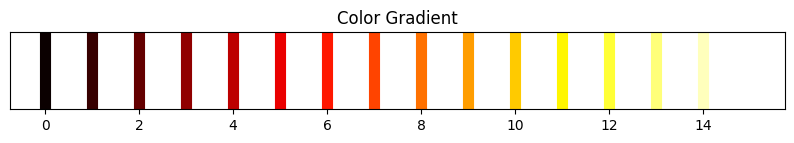

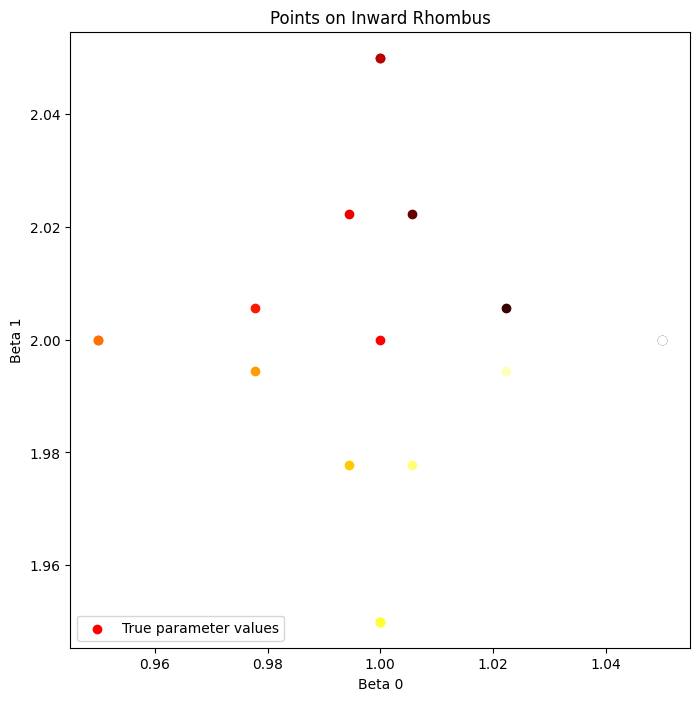

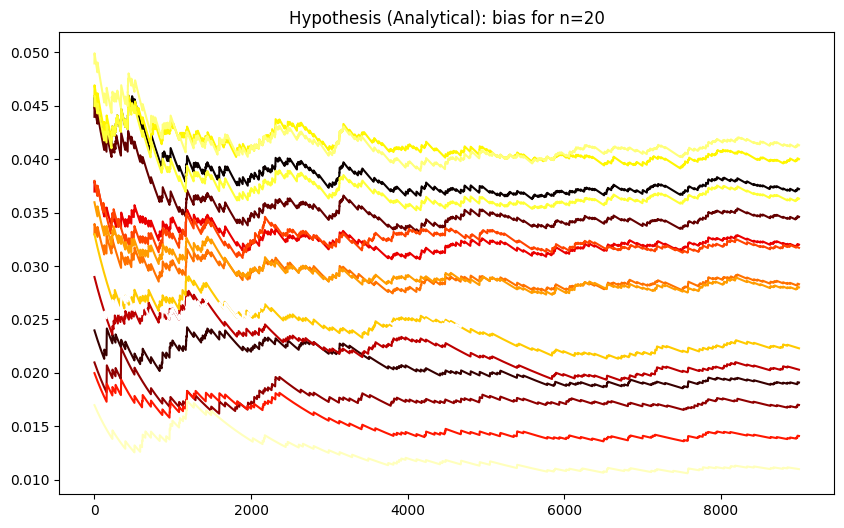

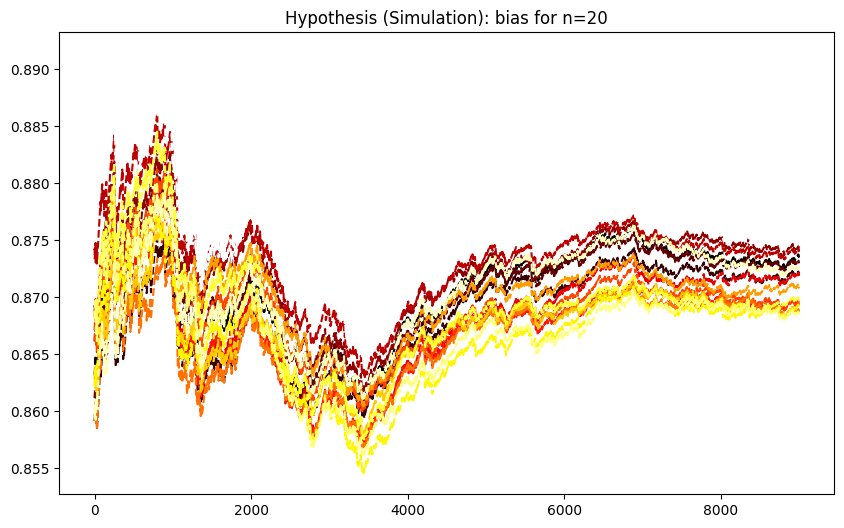

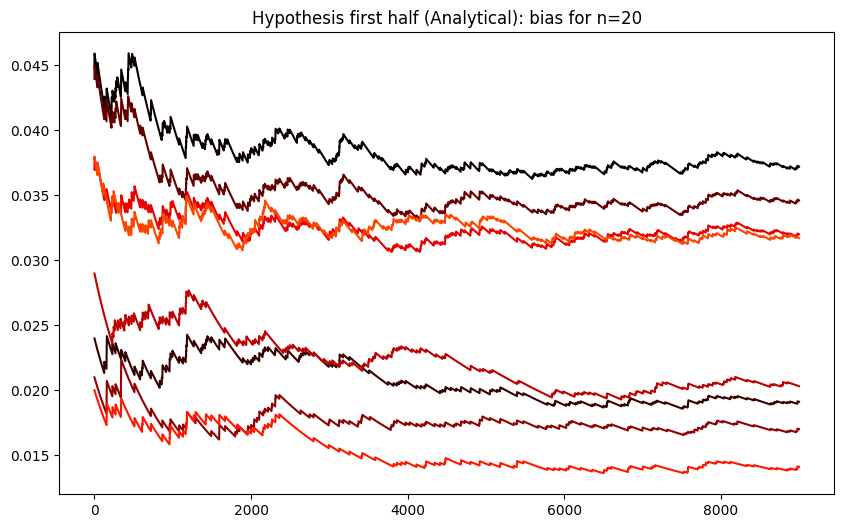

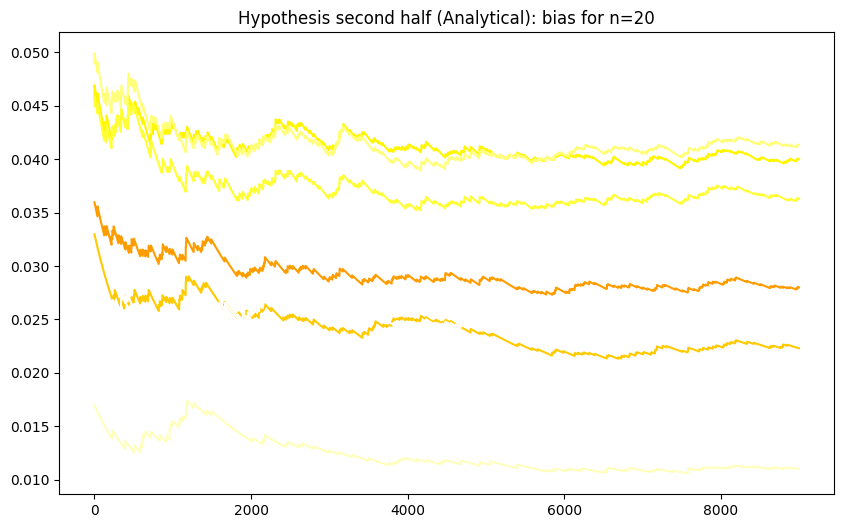

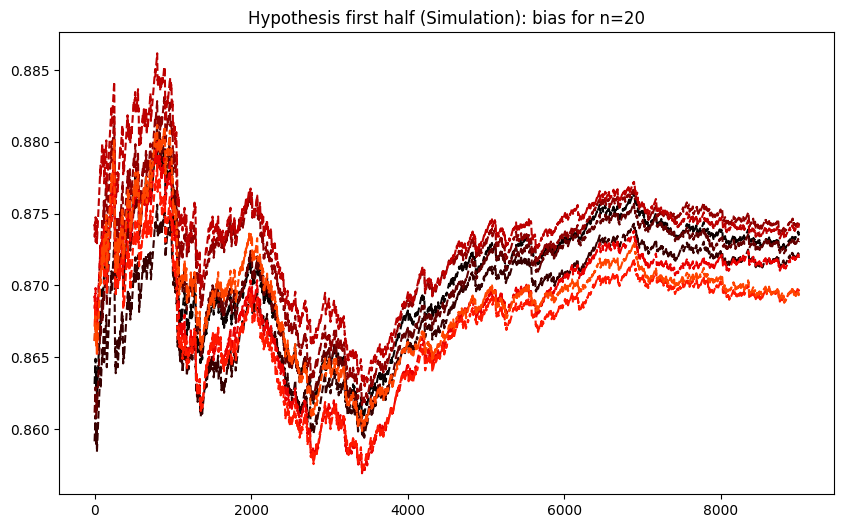

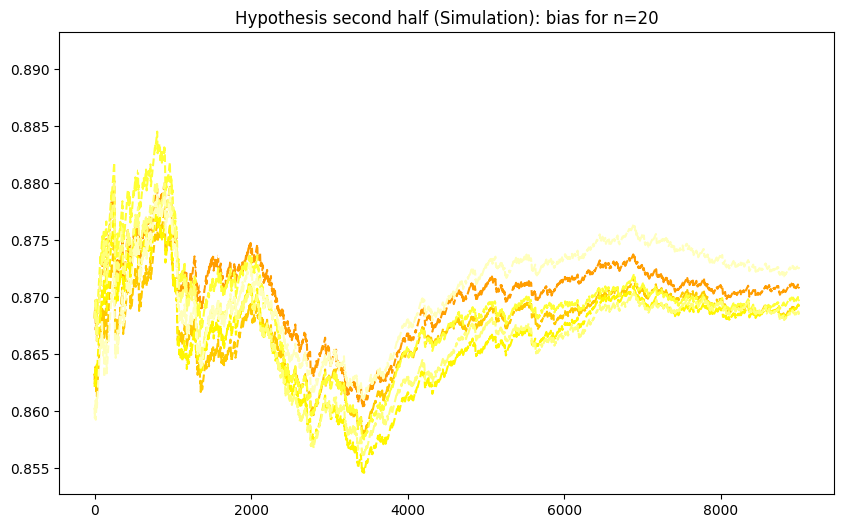

In [22]:
# Generate colors from a colormap
colors = cm.hot(np.linspace(0, 1, num_points))

# Plotting the color gradient
plt.figure(figsize=(10, 1))
for idx, color in enumerate(colors):
    plt.plot([idx, idx], [0, 1], color=color, linewidth=8)
plt.title("Color Gradient")
plt.yticks([])
plt.show()


# Generate colors from a colormap
colors = cm.hot(np.linspace(0, 1, num_points))

# Plotting the circle and the true parameter values
plt.figure(figsize=(8, 8))
plt.scatter(beta0[0], beta0[1], color='red', label='True parameter values')


for idx in range(num_points):
    plt.scatter(curved_rhombus_points[idx, 0], curved_rhombus_points[idx, 1], color=colors[idx])

plt.xlabel('Beta 0')
plt.ylabel('Beta 1')
plt.legend(loc=3)
plt.axis('equal')
plt.title('Points on Inward Rhombus')
plt.show()


# Plotting
plt.figure(figsize=(10, 6))
for idx in range(num_points):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    #plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Analytical): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points):
    #plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Simulation): bias for n={}".format(n))
plt.show()


# Plotting
plt.figure(figsize=(10, 6))
for idx in range(num_points//2):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    #plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis first half (Analytical): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points//2 + 1, num_points):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])


plt.title("Hypothesis second half (Analytical): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points//2):
    #plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis first half (Simulation): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points//2 + 1, num_points):
    #plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis second half (Simulation): bias for n={}".format(n))
plt.show()

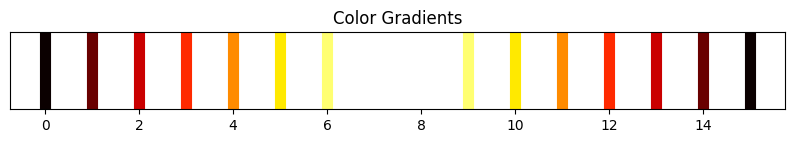

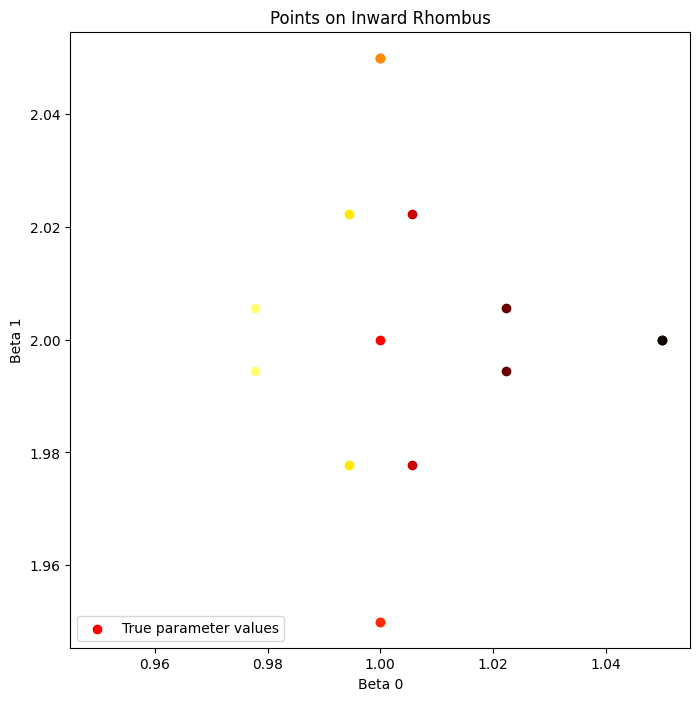

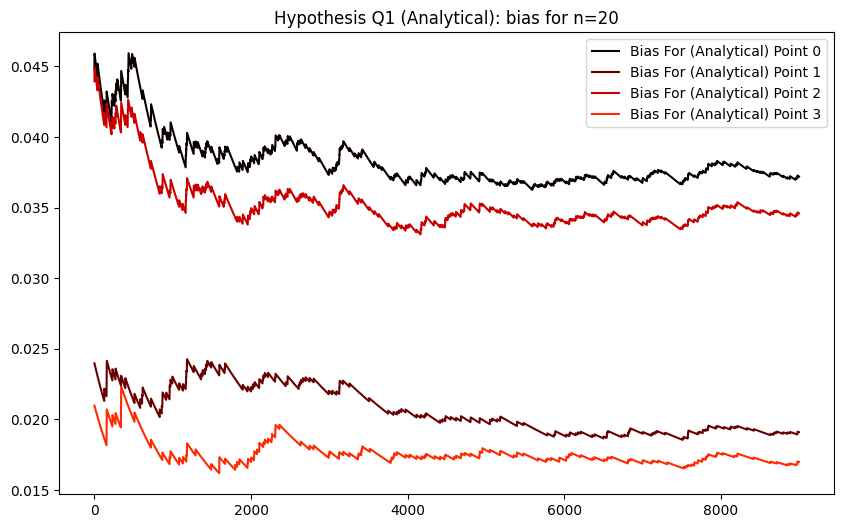

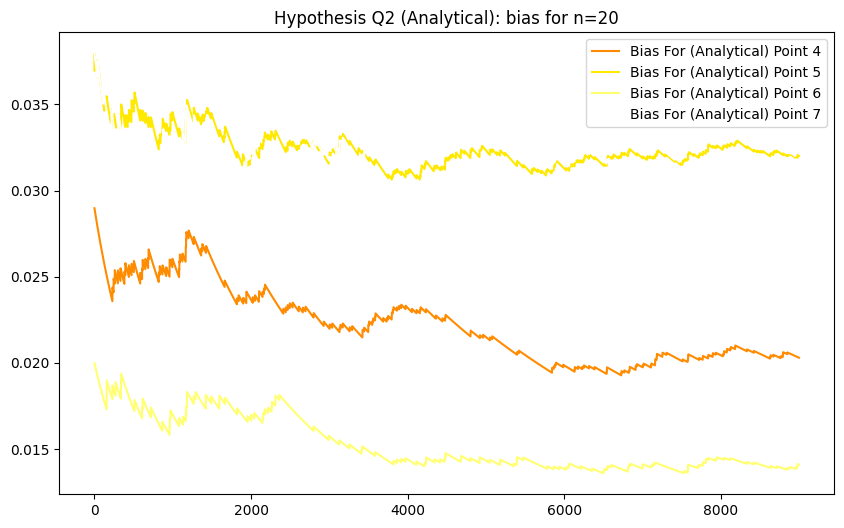

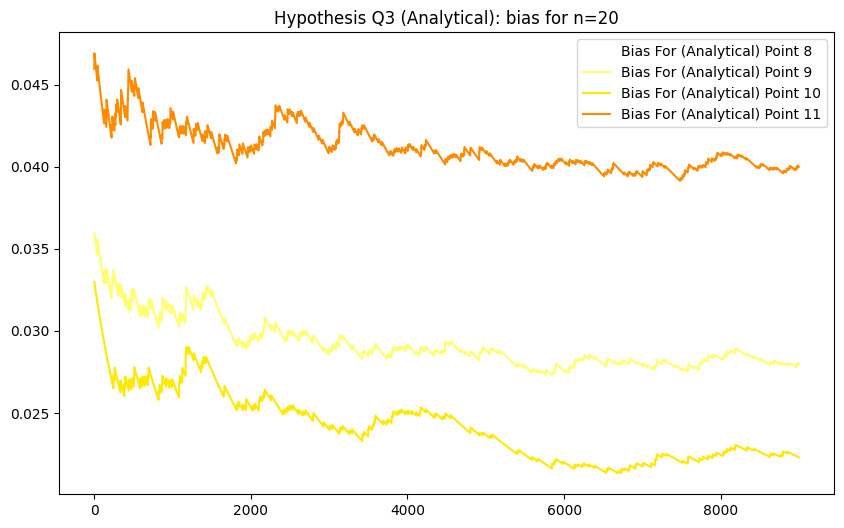

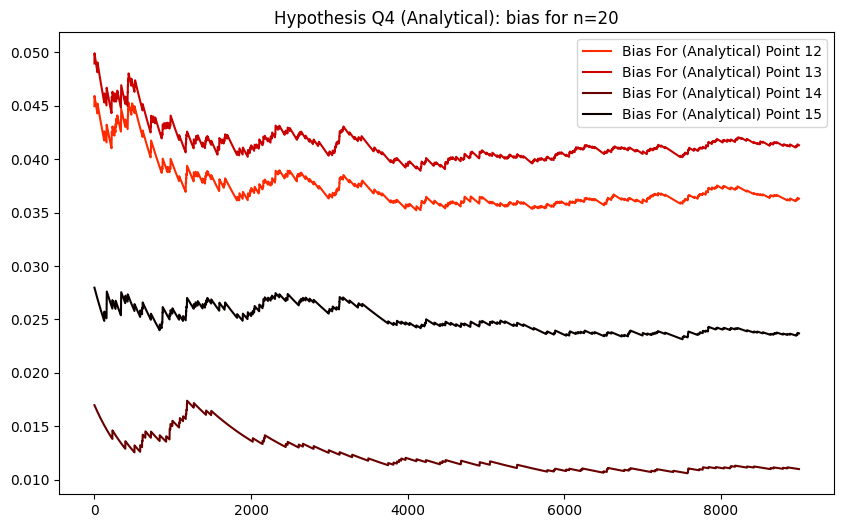

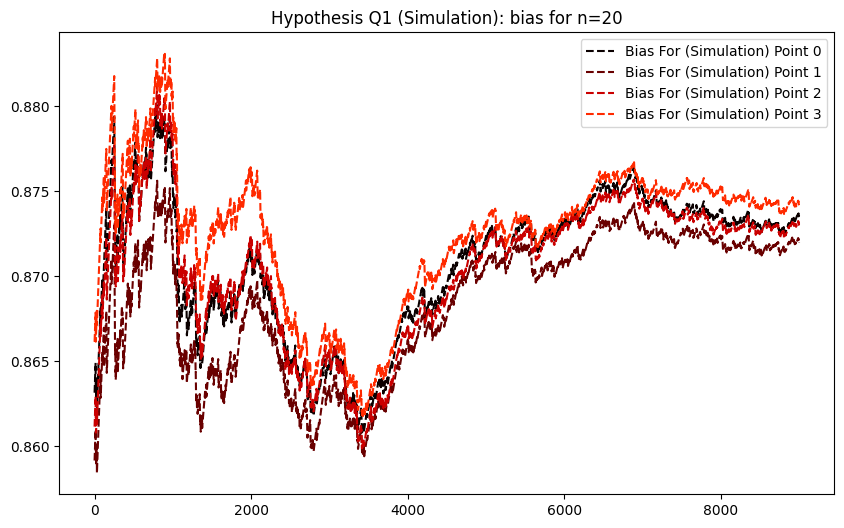

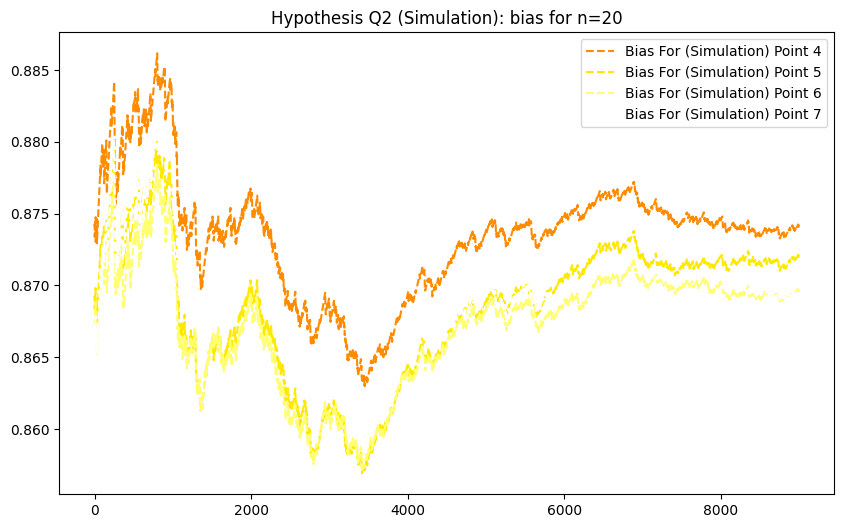

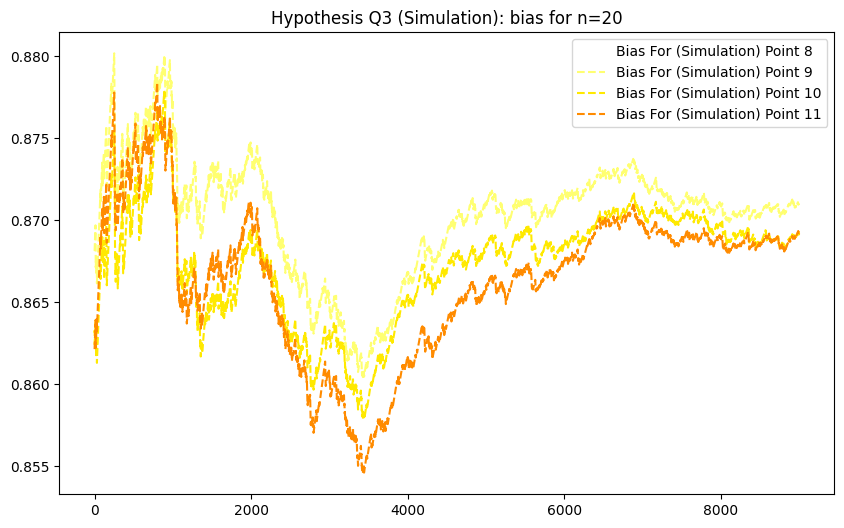

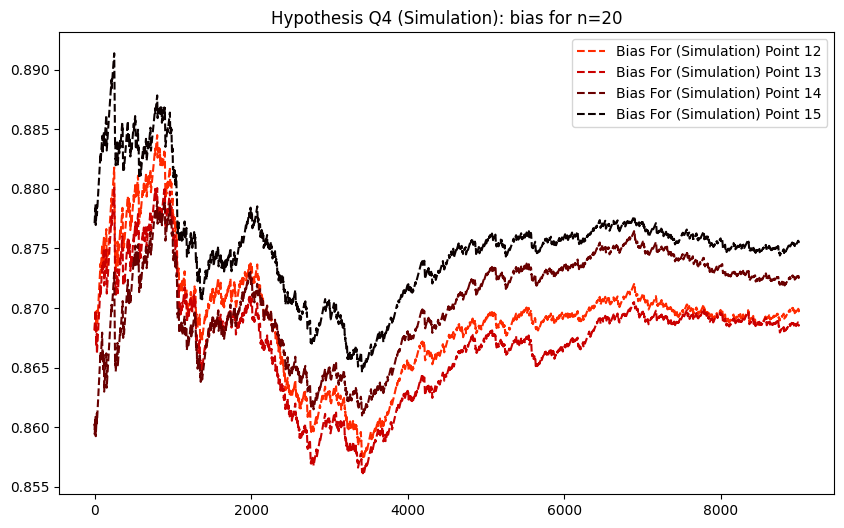

In [26]:

# Generate colors from different colormaps for the first and second halves
colors_first_half = cm.hot(np.linspace(0, 1, num_points // 2))
colors_second_half = cm.hot(np.linspace(0, 1, num_points // 2))[::-1]

# Plotting the color gradients
plt.figure(figsize=(10, 1))
for idx, color in enumerate(np.concatenate((colors_first_half, colors_second_half))):
    plt.plot([idx, idx], [0, 1], color=color, linewidth=8)
plt.title("Color Gradients")
plt.yticks([])
plt.show()

# Plotting points on the inward rhombus with different colors
plt.figure(figsize=(8, 8))
plt.scatter(beta0[0], beta0[1], color='red', label='True parameter values')

for idx in range(num_points):
    if idx < num_points // 2:
        color = colors_first_half[idx]
    else:
        color = colors_second_half[idx - num_points // 2]
    plt.scatter(curved_rhombus_points[idx, 0], curved_rhombus_points[idx, 1], color=color)

plt.xlabel('Beta 0')
plt.ylabel('Beta 1')
plt.legend(loc=3)
plt.axis('equal')
plt.title('Points on Inward Rhombus')
plt.show()

# Plotting for each quarter
points_per_quarter = num_points // 4

plt.figure(figsize=(10, 6))
for idx in range(points_per_quarter):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors_first_half[idx])
plt.title("Hypothesis Q1 (Analytical): bias for n={}".format(n))
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(points_per_quarter, 2 * points_per_quarter):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors_first_half[idx])
plt.title("Hypothesis Q2 (Analytical): bias for n={}".format(n))
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(2 * points_per_quarter, 3 * points_per_quarter):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors_second_half[idx - num_points // 2])
plt.title("Hypothesis Q3 (Analytical): bias for n={}".format(n))
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(3 * points_per_quarter, num_points):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors_second_half[idx - num_points // 2])
plt.title("Hypothesis Q4 (Analytical): bias for n={}".format(n))
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(points_per_quarter):
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors_first_half[idx])
plt.title("Hypothesis Q1 (Simulation): bias for n={}".format(n))
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(points_per_quarter, 2 * points_per_quarter):
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors_first_half[idx])
plt.title("Hypothesis Q2 (Simulation): bias for n={}".format(n))
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(2 * points_per_quarter, 3 * points_per_quarter):
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors_second_half[idx - num_points // 2])
plt.title("Hypothesis Q3 (Simulation): bias for n={}".format(n))
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(3 * points_per_quarter, num_points):
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors_second_half[idx - num_points // 2])
plt.title("Hypothesis Q4 (Simulation): bias for n={}".format(n))
plt.legend()
plt.show()

Change start point of rhombus

In [29]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.special import binom

# Function to calculate Bezier curve points
def bezier_curve(control_points, num_points=100):
    n = len(control_points) - 1
    curve = np.zeros((num_points, 2))
    t = np.linspace(0, 1, num_points)
    for i in range(n + 1):
        curve += np.outer(binom(n, i) * (t ** i) * ((1 - t) ** (n - i)), control_points[i])
    return curve

# True parameter values
beta0 = np.array([1, 2])
delta = 0.05  # Half-diagonal length of the rhombus

# Define the four vertices of the rhombus
vertices = np.array([
    [beta0[0] + delta, beta0[1]],  # Right vertex
    [beta0[0], beta0[1] + delta],  # Top vertex
    [beta0[0] - delta, beta0[1]],  # Left vertex
    [beta0[0], beta0[1] - delta]   # Bottom vertex
])

# Define control points for inward-curving sides
control_points = []
control_points.append([vertices[1], beta0, vertices[2]])  # Top to Left
control_points.append([vertices[2], beta0, vertices[3]])  # Left to Bottom
control_points.append([vertices[3], beta0, vertices[0]])  # Bottom to Right
control_points.append([vertices[0], beta0, vertices[1]])  # Right to Top

# Generate points on the inward-curving rhombus
num_points_per_curve = 4
curved_points = []
for cp in control_points:
    curve = bezier_curve(cp, num_points_per_curve)
    curved_points.append(curve)

# Concatenate all points
curved_rhombus_points = np.vstack(curved_points)


In [30]:
import numpy as np
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt
import time

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 20  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p))

# Ground truth parameters for generating data
beta0 = np.array([1, 2])
mu0 = np.dot(X, beta0)
delta = 0.05
sigma0 = 1

num_points = len(curved_rhombus_points)

# Vectorized response variable generation
muls = np.dot(X, curved_rhombus_points.T).T  # Shape: (25, n)
yls = muls + np.random.normal(0, sigma0, (num_points, n))  # Shape: (25, n)

start_time = time.time()

with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    mu = pm.Deterministic("mu", pm.math.dot(X, beta))

    X_transpose = X.T
    Sigma_inv = np.eye(n) / sigma0**2
    Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2

    cov_beta_post = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)

    # Iterate over each point on the circle
    for i, betal in enumerate(curved_rhombus_points):
        # Calculate mu for each point on the circle

        # Likelihood
        y_l = pm.MvNormal(f'y_l_{i}', mu=muls[i], cov=(sigma0**2) * np.eye(n), shape=n)
        # Posterior mean and covariance for beta
        prior_pdl = pm.Deterministic(f'prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu = beta0, cov = (mu_prior_sigma**2) * np.eye(p), shape = p), beta0))

        #prior_pdl = pm.Deterministic(f'prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(mu_prior_sigma**2) * np.eye(n), shape=(n,)), yls[i]))


        mean_beta_post = np.dot(cov_beta_post, np.dot(X_transpose, np.dot(Sigma_inv, yls[i])) + Sigma_beta_inv.dot(np.ones(p) * mu_prior_mean))
        # Posterior log-probability
        posterior_pdl = pm.Deterministic(f'posterior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mean_beta_post, cov=cov_beta_post, shape = p), beta))

        #posterior_pdl = pm.Deterministic(f'posterior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=pm.math.dot(X, posterior_betal), cov=(sigma0**2) * np.eye(n), shape=(n,)), mu0))

        # Log BR
        logBR_prior_pdl = pm.Deterministic(f'logBR_prior_pdl_{i}', posterior_pdl - prior_pdl)

        # Likelihood
        likelihood_prior_pdl = pm.Deterministic(f'likelihood_prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(sigma**2) * np.eye(n), shape=n), y_l).sum())

    # Sampling
    idata = pm.sample(draws=5000, tune=1000)

end_time = time.time()

# Calculate elapsed time
elapsed_time = end_time - start_time

print(f"Cell execution time: {elapsed_time:.2f} seconds")


Cell execution time: 558.18 seconds


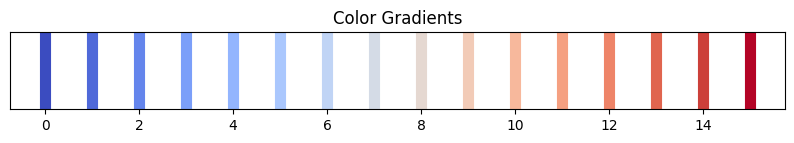

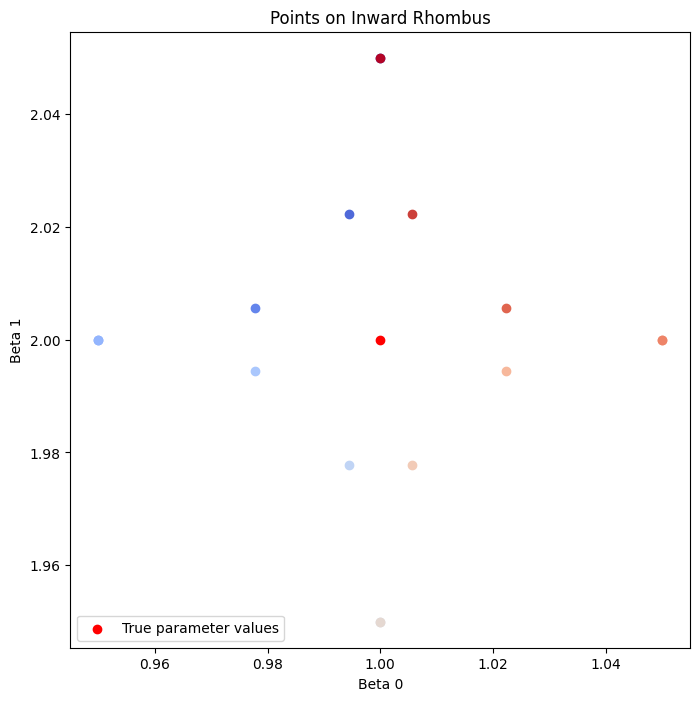

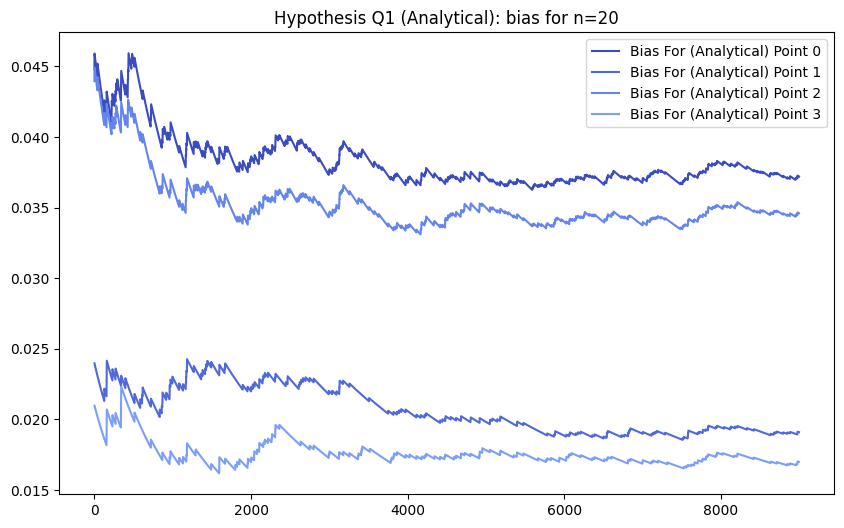

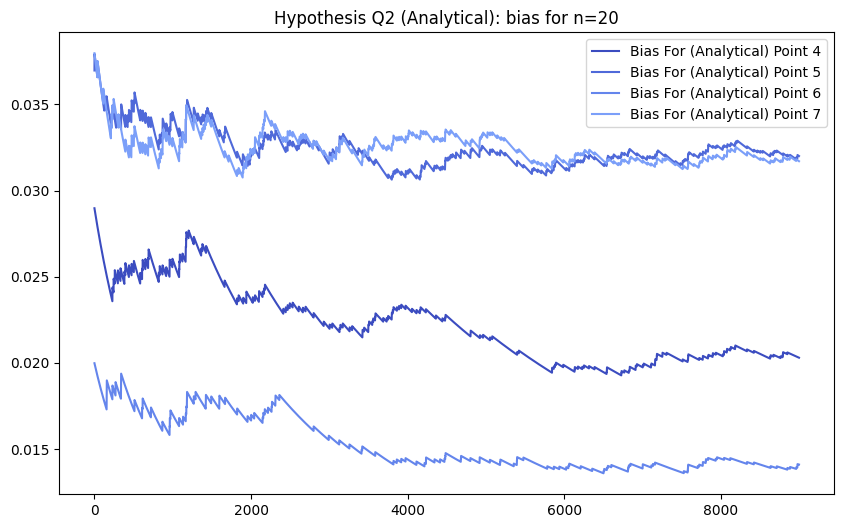

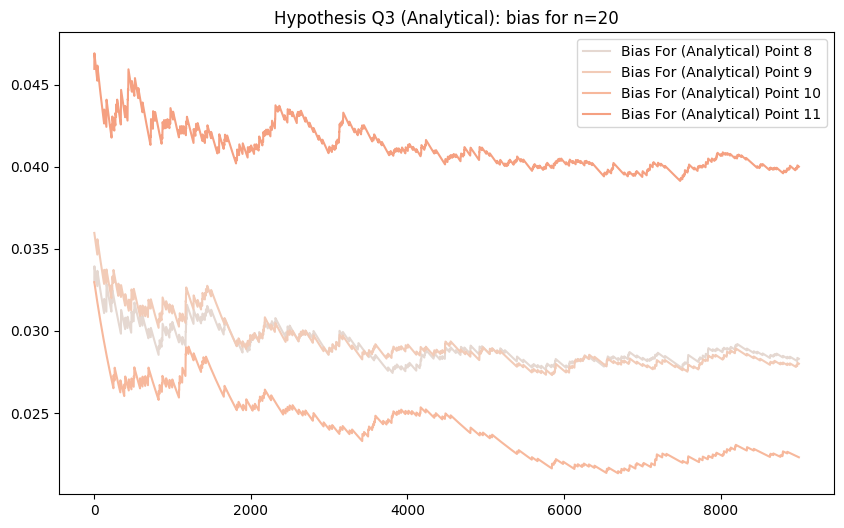

...

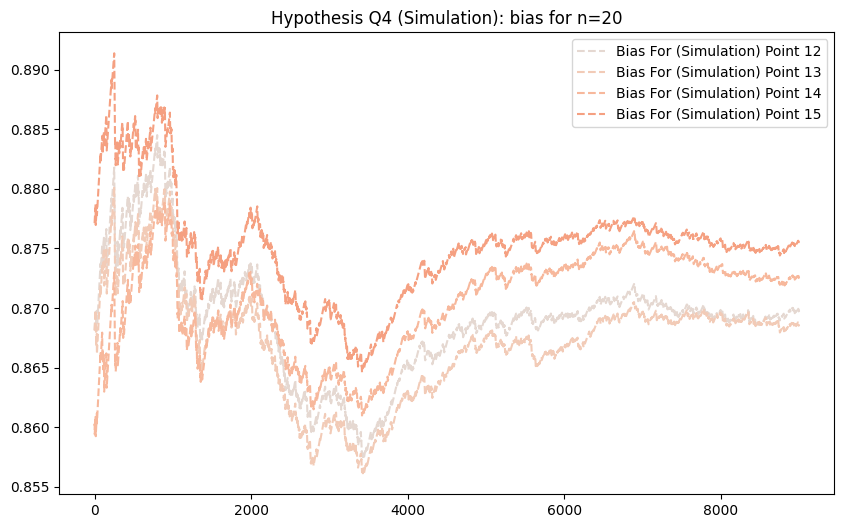

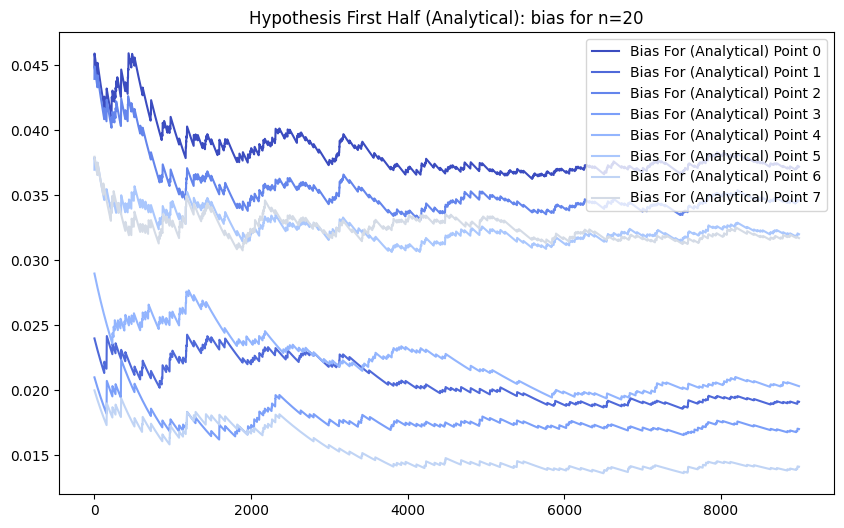

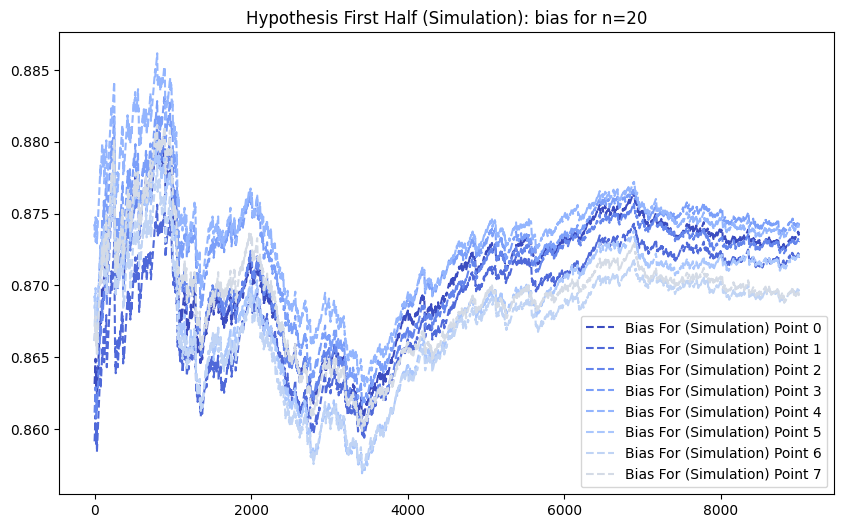

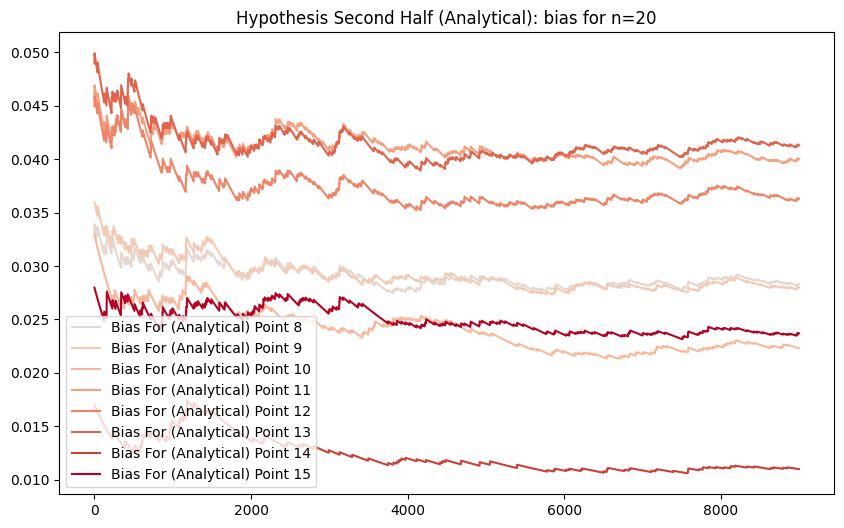

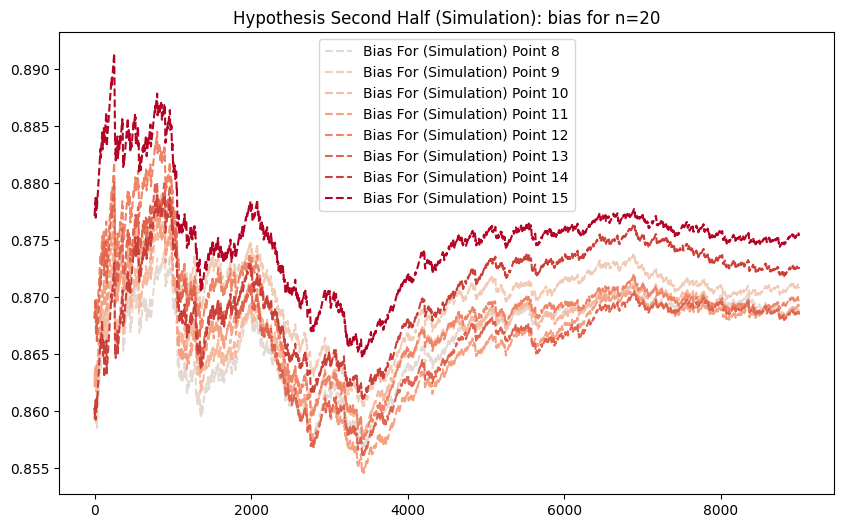

In [34]:

# Generate colors from different colormaps for the first and second halves
colors= cm.coolwarm(np.linspace(0, 1, num_points))
colors_first_half = colors[:len(colors)//2]
colors_second_half = colors[len(colors)//2:]

# Plotting the color gradients
plt.figure(figsize=(10, 1))
for idx, color in enumerate(np.concatenate((colors_first_half, colors_second_half))):
    plt.plot([idx, idx], [0, 1], color=color, linewidth=8)
plt.title("Color Gradients")
plt.yticks([])
plt.show()

# Plotting points on the inward rhombus with different colors
plt.figure(figsize=(8, 8))
plt.scatter(beta0[0], beta0[1], color='red', label='True parameter values')

for idx in range(num_points):
    if idx < num_points // 2:
        color = colors_first_half[idx]
    else:
        color = colors_second_half[idx - num_points // 2]
    plt.scatter(curved_rhombus_points[idx, 0], curved_rhombus_points[idx, 1], color=color)

plt.xlabel('Beta 0')
plt.ylabel('Beta 1')
plt.legend(loc=3)
plt.axis('equal')
plt.title('Points on Inward Rhombus')
plt.show()

# Plotting for each quarter
points_per_quarter = num_points // 4

plt.figure(figsize=(10, 6))
for idx in range(points_per_quarter):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors_first_half[idx])
plt.title("Hypothesis Q1 (Analytical): bias for n={}".format(n))
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(points_per_quarter, 2 * points_per_quarter):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors_first_half[idx - points_per_quarter])
plt.title("Hypothesis Q2 (Analytical): bias for n={}".format(n))
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(2 * points_per_quarter, 3 * points_per_quarter):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors_second_half[idx - 2 * points_per_quarter])
plt.title("Hypothesis Q3 (Analytical): bias for n={}".format(n))
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(3 * points_per_quarter, num_points):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors_second_half[idx - 3 * points_per_quarter])
plt.title("Hypothesis Q4 (Analytical): bias for n={}".format(n))
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(points_per_quarter):
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors_first_half[idx])
plt.title("Hypothesis Q1 (Simulation): bias for n={}".format(n))
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(points_per_quarter, 2 * points_per_quarter):
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors_first_half[idx - points_per_quarter])
plt.title("Hypothesis Q2 (Simulation): bias for n={}".format(n))
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(2 * points_per_quarter, 3 * points_per_quarter):
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors_second_half[idx - 2 * points_per_quarter])
plt.title("Hypothesis Q3 (Simulation): bias for n={}".format(n))
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(3 * points_per_quarter, num_points):
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors_second_half[idx - 3 * points_per_quarter])
plt.title("Hypothesis Q4 (Simulation): bias for n={}".format(n))
plt.legend()
plt.show()

# Plotting for first half
plt.figure(figsize=(10, 6))
for idx in range(num_points // 2):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors_first_half[idx])
plt.title("Hypothesis First Half (Analytical): bias for n={}".format(n))
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points // 2):
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors_first_half[idx])
plt.title("Hypothesis First Half (Simulation): bias for n={}".format(n))
plt.legend()
plt.show()

# Plotting for second half
plt.figure(figsize=(10, 6))
for idx in range(num_points // 2, num_points):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors_second_half[idx - num_points // 2])
plt.title("Hypothesis Second Half (Analytical): bias for n={}".format(n))
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points // 2, num_points):
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors_second_half[idx - num_points // 2])
plt.title("Hypothesis Second Half (Simulation): bias for n={}".format(n))
plt.legend()
plt.show()

In [60]:
import numpy as np
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt
import time

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 20  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p))
X_transpose = X.T

# Ground truth parameters for generating data
beta0 = np.array([1, 2])
mu0 = np.dot(X, beta0)
delta = 0.05
sigma0 = 1

num_points = len(curved_rhombus_points)

# Vectorized response variable generation
muls = np.dot(X, curved_rhombus_points.T).T  # Shape: (25, n)
yls = muls + np.random.normal(0, sigma0, (num_points, n))  # Shape: (25, n)

start_time = time.time()

print("x", X.shape)
print("xT", X.T.shape)
print("muls", muls.shape)
print("mulsi", muls[i].shape)
print("yls", yls.shape)
print(yls[i].shape)
with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    mu = pm.Deterministic("mu", pm.math.dot(X, beta))

    Sigma_inv = np.eye(n) / sigma0**2
    Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2

    cov_beta_post = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)
    print("cov_beta_post", cov_beta_post.shape)
    # Iterate over each point on the circle
    for i, betal in enumerate(curved_rhombus_points):
        # Calculate mu for each point on the circle

        # Likelihood
        y_l = pm.MvNormal(f'y_l_{i}', mu=muls[i], cov=(sigma0**2) * np.eye(n), shape=(1, n))
        # Posterior mean and covariance for beta
        prior_pdl = pm.Deterministic(f'prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu = beta0, cov = (mu_prior_sigma**2) * np.eye(p), shape = p), beta0))

        #prior_pdl = pm.Deterministic(f'prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(mu_prior_sigma**2) * np.eye(n), shape=(n,)), yls[i]))
        print("y_l", np.dot(np.eye(1), y_l).shape)
        print("first", np.dot(X_transpose, np.dot(Sigma_inv, yls[i])).shape)
        print("second", np.dot(X_transpose, np.dot(Sigma_inv, y_l)).shape)

        print(np.dot(Sigma_beta_inv, beta0).shape)
        print(np.dot(X_transpose, np.dot(Sigma_inv, y_l)) + np.dot(Sigma_beta_inv, beta0).shape)
        print(np.dot(cov_beta_post, np.dot(X_transpose, np.dot(Sigma_inv, yls[i])) + np.dot(Sigma_beta_inv, beta0.T)).shape)
        mean_beta_post = np.dot(cov_beta_post, np.dot(X_transpose, np.dot(Sigma_inv, yls[i])) + np.dot(Sigma_beta_inv, beta0))

        # Posterior log-probability
        posterior_pdl = pm.Deterministic(f'posterior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mean_beta_post, cov=cov_beta_post, shape = p), beta))

        #posterior_pdl = pm.Deterministic(f'posterior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=pm.math.dot(X, posterior_betal), cov=(sigma0**2) * np.eye(n), shape=(n,)), mu0))

        # Log BR
        logBR_prior_pdl = pm.Deterministic(f'logBR_prior_pdl_{i}', posterior_pdl - prior_pdl)

        # Likelihood
        likelihood_prior_pdl = pm.Deterministic(f'likelihood_prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(sigma**2) * np.eye(n), shape=n), y_l).sum())

    # Sampling
    idata = pm.sample(draws=5000, tune=1000)

end_time = time.time()

# Calculate elapsed time
elapsed_time = end_time - start_time

print(f"Cell execution time: {elapsed_time:.2f} seconds")


x (20, 2)
xT (2, 20)
muls (16, 20)
mulsi (20,)
yls (16, 20)
(20,)
cov_beta_post (2, 2)
y_l (1, 1)
first (2,)
second (2, 20)
(2,)
[[Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0
  Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0]
 [Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0
  Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0]]
(2,)
y_l (1, 1)
first (2,)
second (2, 20)
(2,)
[[Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0
  Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0]
 [Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0
  Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0]]
(2,)
y_l (1, 1)
first (2,)
second (2, 20)
(2,)
[[Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0
  Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0]
 [Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0
  Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0 Add.0]]
(2,)
y_l (1, 1)
first (2

Cell execution time: 656.94 seconds


In [61]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
import arviz as az

# Define a function for normal log probability
def normal_logp_np(x, mu, sigma):
    return -0.5 * ((x - mu) / sigma) ** 2 - np.log(sigma) - 0.5 * np.log(2 * np.pi)



# Compute biases for all points on the circle
bias_for = []
bias_for_ml = []

for idx in range(num_points):
    logBR_prior_pd_values = idata.posterior[f'logBR_prior_pdl_{idx}'].values.ravel()
    likelihood_prior_pd_values = idata.posterior[f'likelihood_prior_pdl_{idx}'].values.ravel()

    bias_for_values = logBR_prior_pd_values > 0
    bias_for_mci = bias_for_values.cumsum() / np.arange(1, len(bias_for_values) + 1)

    mu_samples = idata.posterior['mu'][:, :, 0].values.ravel()[:1000]
    y_samples = idata.posterior[f'y_l_{idx}'].values
    marginal_likelihoods = normal_logp_np(y_samples[:, :, :, np.newaxis], mu_samples, 1).sum(axis=2)
    log_marginal_likelihoods = np.log(np.exp(marginal_likelihoods).mean(axis=-1)).ravel()

    bias_for_ml_values = (likelihood_prior_pd_values - log_marginal_likelihoods) >= 0
    bias_for_ml_mci = bias_for_ml_values.cumsum() / np.arange(1, len(bias_for_ml_values) + 1)

    bias_for.append(bias_for_mci)
    bias_for_ml.append(bias_for_ml_mci)



ValueError: operands could not be broadcast together with shapes (2,5000,1,1,20) (1000,) 

In [ ]:

# Generate colors from different colormaps for the first and second halves
colors= cm.coolwarm(np.linspace(0, 1, num_points))
colors_first_half = colors[:len(colors)//2]
colors_second_half = colors[len(colors)//2:]

# Plotting the color gradients
plt.figure(figsize=(10, 1))
for idx, color in enumerate(np.concatenate((colors_first_half, colors_second_half))):
    plt.plot([idx, idx], [0, 1], color=color, linewidth=8)
plt.title("Color Gradients")
plt.yticks([])
plt.show()

# Plotting points on the inward rhombus with different colors
plt.figure(figsize=(8, 8))
plt.scatter(beta0[0], beta0[1], color='red', label='True parameter values')

for idx in range(num_points):
    if idx < num_points // 2:
        color = colors_first_half[idx]
    else:
        color = colors_second_half[idx - num_points // 2]
    plt.scatter(curved_rhombus_points[idx, 0], curved_rhombus_points[idx, 1], color=color)

plt.xlabel('Beta 0')
plt.ylabel('Beta 1')
plt.legend(loc=3)
plt.axis('equal')
plt.title('Points on Inward Rhombus')
plt.show()

# Plotting for each quarter
points_per_quarter = num_points // 4

plt.figure(figsize=(10, 6))
for idx in range(points_per_quarter):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors_first_half[idx])
plt.title("Hypothesis Q1 (Analytical): bias for n={}".format(n))
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(points_per_quarter, 2 * points_per_quarter):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors_first_half[idx - points_per_quarter])
plt.title("Hypothesis Q2 (Analytical): bias for n={}".format(n))
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(2 * points_per_quarter, 3 * points_per_quarter):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors_second_half[idx - 2 * points_per_quarter])
plt.title("Hypothesis Q3 (Analytical): bias for n={}".format(n))
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(3 * points_per_quarter, num_points):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors_second_half[idx - 3 * points_per_quarter])
plt.title("Hypothesis Q4 (Analytical): bias for n={}".format(n))
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(points_per_quarter):
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors_first_half[idx])
plt.title("Hypothesis Q1 (Simulation): bias for n={}".format(n))
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(points_per_quarter, 2 * points_per_quarter):
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors_first_half[idx - points_per_quarter])
plt.title("Hypothesis Q2 (Simulation): bias for n={}".format(n))
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(2 * points_per_quarter, 3 * points_per_quarter):
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors_second_half[idx - 2 * points_per_quarter])
plt.title("Hypothesis Q3 (Simulation): bias for n={}".format(n))
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(3 * points_per_quarter, num_points):
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors_second_half[idx - 3 * points_per_quarter])
plt.title("Hypothesis Q4 (Simulation): bias for n={}".format(n))
plt.legend()
plt.show()

# Plotting for first half
plt.figure(figsize=(10, 6))
for idx in range(num_points // 2):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors_first_half[idx])
plt.title("Hypothesis First Half (Analytical): bias for n={}".format(n))
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points // 2):
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors_first_half[idx])
plt.title("Hypothesis First Half (Simulation): bias for n={}".format(n))
plt.legend()
plt.show()

# Plotting for second half
plt.figure(figsize=(10, 6))
for idx in range(num_points // 2, num_points):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors_second_half[idx - num_points // 2])
plt.title("Hypothesis Second Half (Analytical): bias for n={}".format(n))
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points // 2, num_points):
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors_second_half[idx - num_points // 2])
plt.title("Hypothesis Second Half (Simulation): bias for n={}".format(n))
plt.legend()
plt.show()

In [63]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.special import binom

# Function to calculate Bezier curve points
def bezier_curve(control_points, num_points=100):
    n = len(control_points) - 1
    curve = np.zeros((num_points, 2))
    t = np.linspace(0, 1, num_points)
    for i in range(n + 1):
        curve += np.outer(binom(n, i) * (t ** i) * ((1 - t) ** (n - i)), control_points[i])
    return curve

# True parameter values
beta0 = np.array([1, 2])
delta1 = 0.05  # Half-diagonal length of the rhombus
delta2 = 0.05
# Define the four vertices of the rhombus
vertices = np.array([
    [beta0[0] + delta1, beta0[1]],  # Right vertex
    [beta0[0], beta0[1] + delta2],  # Top vertex
    [beta0[0] - delta1, beta0[1]],  # Left vertex
    [beta0[0], beta0[1] - delta2]   # Bottom vertex
])

# Define control points for inward-curving sides
control_points = []
control_points.append([vertices[0], beta0, vertices[1]])  # Right to Top

control_points.append([vertices[1], beta0, vertices[2]])  # Top to Left
control_points.append([vertices[2], beta0, vertices[3]])  # Left to Bottom
control_points.append([vertices[3], beta0, vertices[0]])  # Bottom to Right

# Generate points on the inward-curving rhombus
num_points_per_curve = 4
curved_points = []
for cp in control_points:
    curve = bezier_curve(cp, num_points_per_curve)
    curved_points.append(curve)

# Concatenate all points
curved_rhombus_points = np.vstack(curved_points)
num_points = len(curved_rhombus_points)

In [65]:
import numpy as np
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt
import time

# Define prior parameters
mu_prior_mean = 0
mu_prior_sigma = 1

sigma_prior_mu = 1
sigma_prior_sigma = 1

n = 20  # Number of observations
p = 2  # Number of covariates

# Design matrix X
X = np.random.normal(size=(n, p))

# Ground truth parameters for generating data
mu0 = np.dot(X, beta0)
delta = 0.05
sigma0 = 1

num_points = len(curved_rhombus_points)

# Vectorized response variable generation
muls = np.dot(X, curved_rhombus_points.T).T  # Shape: (25, n)
yls = muls + np.random.normal(0, sigma0, (num_points, n))  # Shape: (25, n)

start_time = time.time()

with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=mu_prior_mean, sigma=mu_prior_sigma, shape=(p,))
    sigma = pm.TruncatedNormal("sigma", mu=sigma_prior_mu, sigma=sigma_prior_sigma, lower=0)

    mu = pm.Deterministic("mu", pm.math.dot(X, beta))

    X_transpose = X.T
    Sigma_inv = np.eye(n) / sigma0**2
    Sigma_beta_inv = np.eye(p) / mu_prior_sigma**2

    cov_beta_post = np.linalg.inv(np.dot(X_transpose, np.dot(Sigma_inv, X)) + Sigma_beta_inv)

    # Iterate over each point on the circle
    for i, betal in enumerate(curved_rhombus_points):
        # Calculate mu for each point on the circle

        # Likelihood
        y_l = pm.MvNormal(f'y_l_{i}', mu=muls[i], cov=(sigma0**2) * np.eye(n), shape=n)
        # Posterior mean and covariance for beta
        prior_pdl = pm.Deterministic(f'prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu = beta0, cov = (mu_prior_sigma**2) * np.eye(p), shape = p), beta))

        #prior_pdl = pm.Deterministic(f'prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(mu_prior_sigma**2) * np.eye(n), shape=(n,)), yls[i]))
        #mean_beta_post = np.dot(cov_beta_post, np.dot(X_transpose, np.dot(Sigma_inv, yls[i])) + Sigma_beta_inv.dot(np.ones(p) * mu_prior_mean))
        mean_beta_post = np.dot(cov_beta_post, np.dot(X_transpose, np.dot(Sigma_inv, yls[i])) + np.dot(Sigma_beta_inv, beta0))
        # Posterior log-probability
        posterior_pdl = pm.Deterministic(f'posterior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mean_beta_post, cov=cov_beta_post, shape = p), beta))

        #posterior_pdl = pm.Deterministic(f'posterior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=pm.math.dot(X, posterior_betal), cov=(sigma0**2) * np.eye(n), shape=(n,)), mu0))

        # Log BR
        logBR_prior_pdl = pm.Deterministic(f'logBR_prior_pdl_{i}', posterior_pdl - prior_pdl)

        # Likelihood
        likelihood_prior_pdl = pm.Deterministic(f'likelihood_prior_pdl_{i}', pm.logp(pm.MvNormal.dist(mu=mu0, cov=(sigma**2) * np.eye(n), shape=n), y_l).sum())

    # Sampling
    idata = pm.sample(draws=5000, tune=1000)

end_time = time.time()

# Calculate elapsed time
elapsed_time = end_time - start_time

print(f"Cell execution time: {elapsed_time:.2f} seconds")


Cell execution time: 545.17 seconds


[-64.58454139 -64.58454139 -73.45783703 ... -57.27822229 -35.29412088
 -58.26865663]
[-5.63506779 -5.63506779 -6.6059908  ... -5.57090057 -4.20032938
 -5.62868158]
[-70.21960919 -70.21960919 -80.06382782 ... -62.84912286 -39.49445027
 -63.89733821]


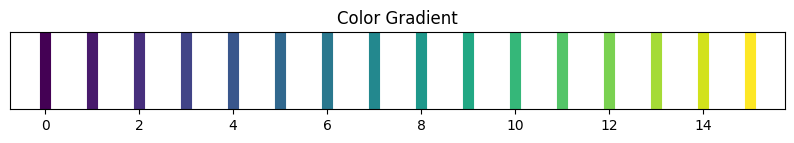

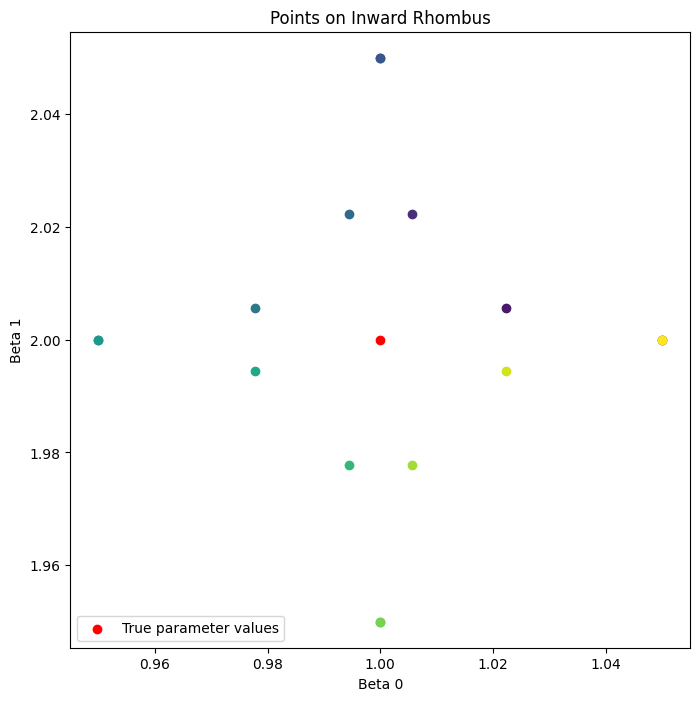

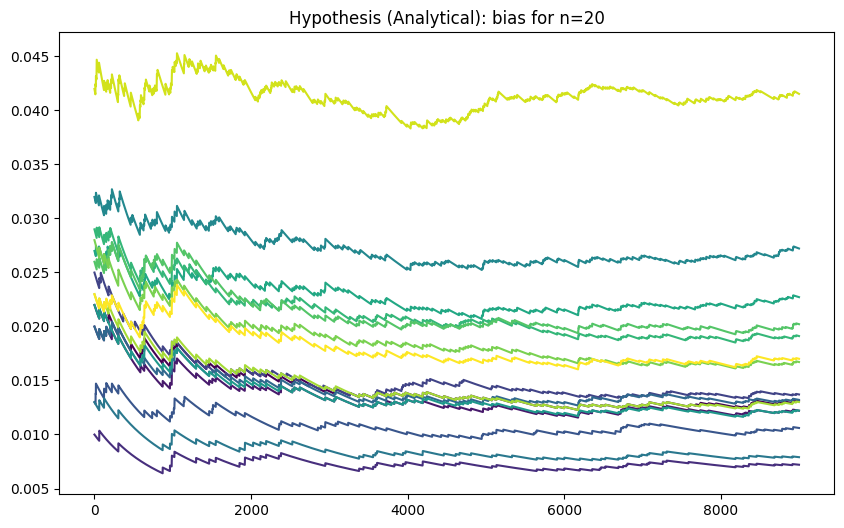

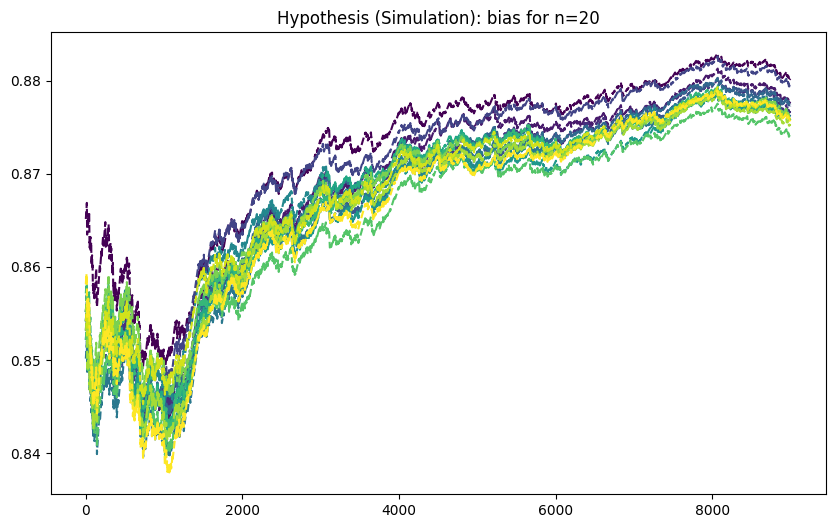

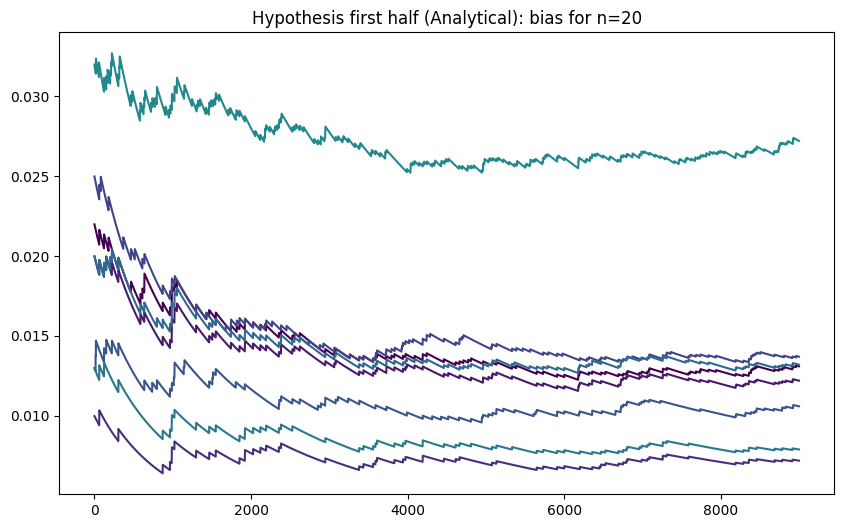

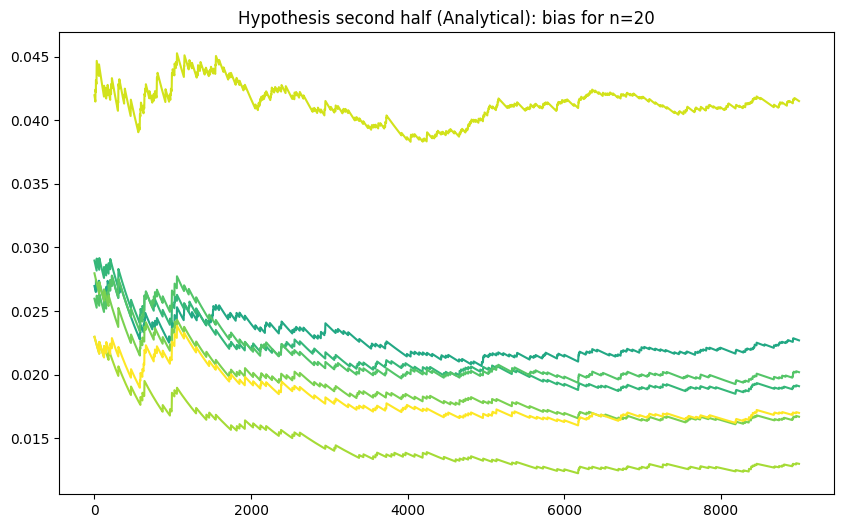

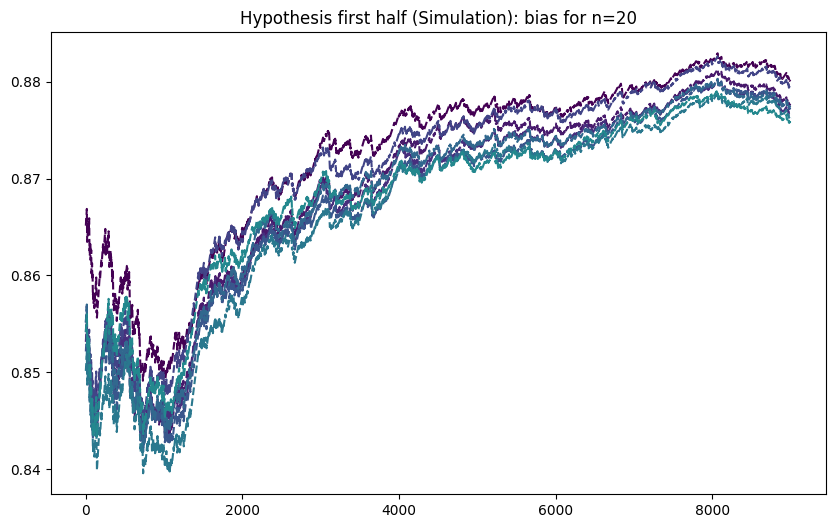

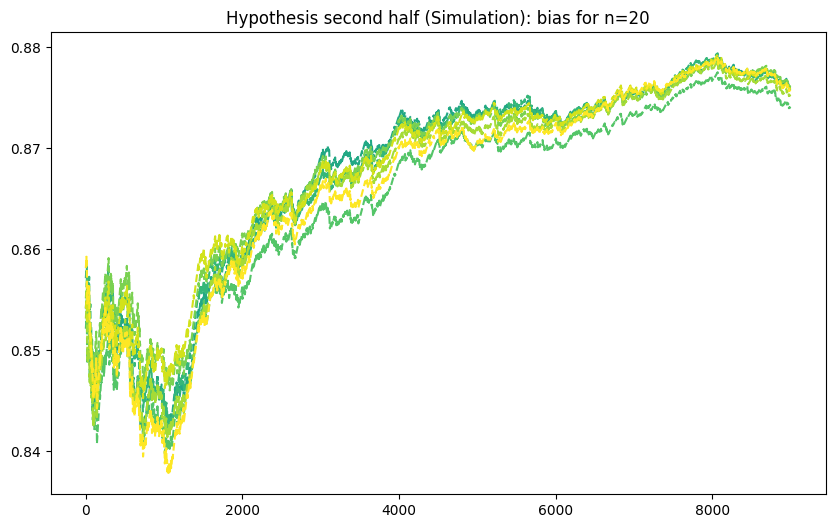

In [66]:
from matplotlib import cm
def normal_logp_np(x, mu, sigma):
    return -0.5 * ((x - mu) / sigma) ** 2 - np.log(sigma) - 0.5 * np.log(2 * np.pi)




# Compute biases for all points on the circle
bias_for = []
bias_for_ml = []
burn = 1000
for idx in range(num_points):
    if idx == 0:
        print(idata.posterior[f'logBR_prior_pdl_{idx}'].values.ravel())
        print(idata.posterior[f'prior_pdl_{idx}'].values.ravel())
        print(idata.posterior[f'posterior_pdl_{idx}'].values.ravel())

    logBR_prior_pd_values = idata.posterior[f'logBR_prior_pdl_{idx}'].values.ravel()
    likelihood_prior_pd_values = idata.posterior[f'likelihood_prior_pdl_{idx}'].values.ravel()

    bias_for_values = logBR_prior_pd_values > 0
    bias_for_mci = bias_for_values.cumsum() / np.arange(1, len(bias_for_values) + 1)

    mu_samples = idata.posterior['mu'][:, :, 0].values.ravel()[:1000]
    y_samples = idata.posterior[f'y_l_{idx}'].values
    marginal_likelihoods = normal_logp_np(y_samples[:, :, :, np.newaxis], mu_samples, 1).sum(axis=2)
    log_marginal_likelihoods = np.log(np.exp(marginal_likelihoods).mean(axis=-1)).ravel()

    bias_for_ml_values = (likelihood_prior_pd_values - log_marginal_likelihoods) >= 0
    bias_for_ml_mci = bias_for_ml_values.cumsum() / np.arange(1, len(bias_for_ml_values) + 1)

    bias_for.append(bias_for_mci)
    bias_for_ml.append(bias_for_ml_mci)

# Generate colors from a colormap
colors = cm.viridis(np.linspace(0, 1, num_points))

# Plotting the color gradient
plt.figure(figsize=(10, 1))
for idx, color in enumerate(colors):
    plt.plot([idx, idx], [0, 1], color=color, linewidth=8)
plt.title("Color Gradient")
plt.yticks([])
plt.show()


# Generate colors from a colormap
colors = cm.viridis(np.linspace(0, 1, num_points))

# Plotting the circle and the true parameter values
plt.figure(figsize=(8, 8))
plt.scatter(beta0[0], beta0[1], color='red', label='True parameter values')


for idx in range(num_points):
    plt.scatter(curved_rhombus_points[idx, 0], curved_rhombus_points[idx, 1], color=colors[idx])

plt.xlabel('Beta 0')
plt.ylabel('Beta 1')
plt.legend(loc=3)
plt.axis('equal')
plt.title('Points on Inward Rhombus')
plt.show()


# Plotting
plt.figure(figsize=(10, 6))
for idx in range(num_points):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    #plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Analytical): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points):
    #plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis (Simulation): bias for n={}".format(n))
plt.show()


# Plotting
plt.figure(figsize=(10, 6))
for idx in range(num_points//2):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    #plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis first half (Analytical): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points//2 + 1, num_points):
    plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])


plt.title("Hypothesis second half (Analytical): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points//2):
    #plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis first half (Simulation): bias for n={}".format(n))
plt.show()

plt.figure(figsize=(10, 6))
for idx in range(num_points//2 + 1, num_points):
    #plt.plot(bias_for[idx][burn:], label=f'Bias For (Analytical) Point {idx}', color=colors[idx])
    plt.plot(bias_for_ml[idx][burn:], label=f'Bias For (Simulation) Point {idx}', linestyle='--', color=colors[idx])

plt.title("Hypothesis second half (Simulation): bias for n={}".format(n))
plt.show()